In [342]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [343]:
data = pd.read_csv(r'C:\Users\yasmi\OneDrive\Documents\Data science courses\Wine_data.csv')

In [344]:
data

,JSON_Name1,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,id,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity,winetype
0,457,12.5,0.043,0.28,0.98918,6.1,24.0,458,3.14,6,1.7,0.44,98.0,0.26,white
1,77,8.6,0.041,0.69,0.99770,7.3,58.0,78,3.06,5,10.2,0.45,160.0,0.31,white
2,4373,9.1,0.058,0.28,0.99520,6.9,14.0,4374,3.29,6,5.0,0.36,146.0,0.19,white
3,4926,9.4,0.060,0.26,0.99690,6.9,55.0,4927,3.21,5,10.9,0.44,193.0,0.56,white
4,2194,9.6,0.055,0.34,0.99450,7.5,50.0,2195,3.29,6,1.3,0.80,153.0,0.14,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,919,10.7,0.064,0.00,0.99500,6.0,40.0,920,3.54,6,2.1,0.93,54.0,0.51,red
6493,2354,11.5,0.036,0.49,0.99320,6.9,49.0,2355,3.20,6,6.6,0.27,172.0,0.19,white
6494,5326,10.4,0.054,0.20,0.99200,6.9,5.0,5327,3.10,6,0.9,0.42,126.0,0.46,white
6495,6489,9.5,0.067,0.02,0.99700,6.4,4.0,6490,3.46,5,1.8,0.68,11.0,0.57,red


In [345]:
data.isnull().sum()

JSON_Name1            0
alcohol               0
chlorides             0
citricacid            0
density               0
fixedacidity          0
freesulfurdioxide     0
id                    0
ph                    0
quality               0
residualsugar         0
sulphates             0
totalsulfurdioxide    0
volatileacidity       0
winetype              0
dtype: int64

In [346]:
data.describe()

,JSON_Name1,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,id,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,3248.000000,10.491801,0.056034,0.318633,0.994697,7.215307,30.525319,3249.000000,3.218501,5.818378,5.443235,0.531268,115.744574,0.339666
std,1875.666681,1.192712,0.035034,0.145318,0.002999,1.296434,17.749400,1875.666681,0.160787,0.873255,4.757804,0.148806,56.521855,0.164636
min,0.000000,8.000000,0.009000,0.000000,0.987110,3.800000,1.000000,1.000000,2.720000,3.000000,0.600000,0.220000,6.000000,0.080000
25%,1624.000000,9.500000,0.038000,0.250000,0.992340,6.400000,17.000000,1625.000000,3.110000,5.000000,1.800000,0.430000,77.000000,0.230000
50%,3248.000000,10.300000,0.047000,0.310000,0.994890,7.000000,29.000000,3249.000000,3.210000,6.000000,3.000000,0.510000,118.000000,0.290000
75%,4872.000000,11.300000,0.065000,0.390000,0.996990,7.700000,41.000000,4873.000000,3.320000,6.000000,8.100000,0.600000,156.000000,0.400000
max,6496.000000,14.900000,0.611000,1.660000,1.038980,15.900000,289.000000,6497.000000,4.010000,9.000000,65.800000,2.000000,440.000000,1.580000


In [347]:
data = data.drop_duplicates()

In [348]:
data.dtypes

JSON_Name1              int64
alcohol               float64
chlorides             float64
citricacid            float64
density               float64
fixedacidity          float64
freesulfurdioxide     float64
id                      int64
ph                    float64
quality                 int64
residualsugar         float64
sulphates             float64
totalsulfurdioxide    float64
volatileacidity       float64
winetype               object
dtype: object

In [349]:
data.groupby('quality').size()

quality
3      30
4     216
5    2138
6    2836
7    1079
8     193
9       5
dtype: int64

In [350]:
# Analyze data by wine type
white_wine = data[data['winetype'] == 'white']
red_wine = data[data['winetype'] == 'red']

print("White Wine Quality Average:", white_wine['quality'].mean())
print("Red Wine Quality Average:", red_wine['quality'].mean())

White Wine Quality Average: 5.87790935075541
Red Wine Quality Average: 5.6360225140712945


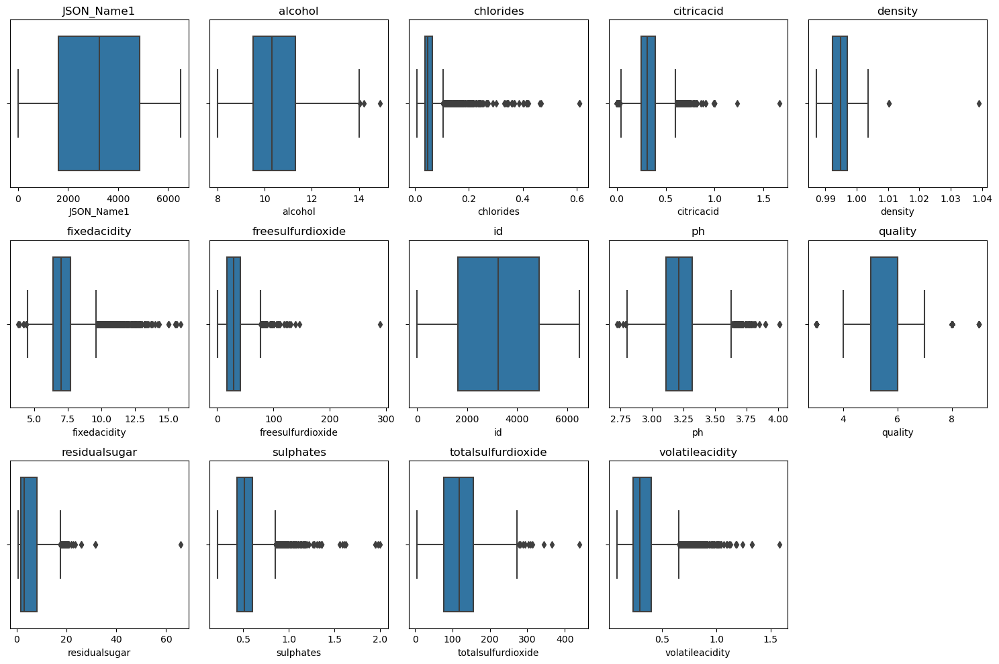

In [351]:
# Box plots to identify outliers
plt.figure(figsize=(15, 10))
for column in data.select_dtypes(include=['float64', 'int64']).columns:
    plt.subplot(3, 5, list(data.select_dtypes(include=['float64', 'int64']).columns).index(column) + 1)
    sns.boxplot(x=data[column])
    plt.title(column)
plt.tight_layout()
plt.show()

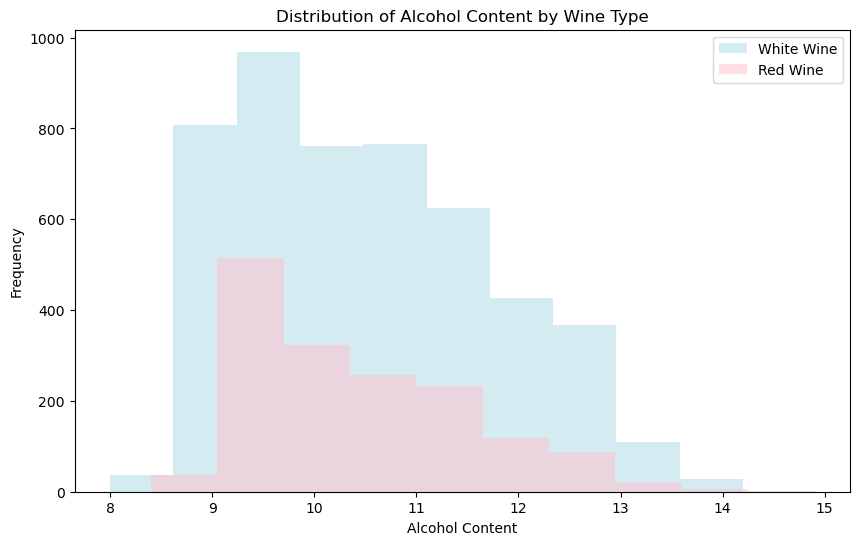

In [352]:
# Plot distribution of alcohol content
import matplotlib.pyplot as plt 

plt.figure(figsize=(10, 6))
data[data['winetype'] == 'white']['alcohol'].plot(kind='hist', alpha=0.5, label='White Wine', color='lightblue')
data[data['winetype'] == 'red']['alcohol'].plot(kind='hist', alpha=0.5, label='Red Wine', color='pink')
plt.legend()
plt.xlabel('Alcohol Content')
plt.title('Distribution of Alcohol Content by Wine Type')
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



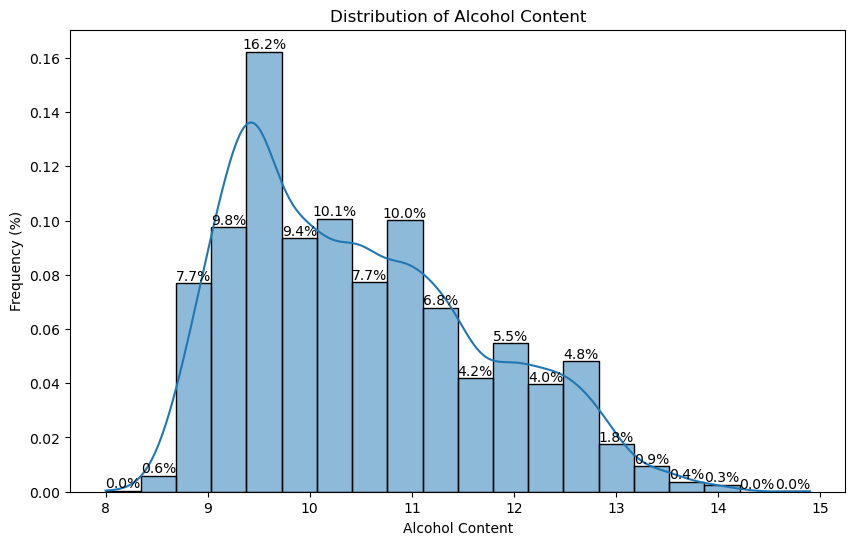

In [353]:
# Create histogram with density normalization
plt.figure(figsize=(10, 6))
hist_data = sns.histplot(data['alcohol'], bins=20, kde=True, stat="probability")

# Calculate the percentage for each bin
for patch in hist_data.patches:
    height = patch.get_height()
    percentage = height * 100  # Convert to percentage
    x = patch.get_x() + patch.get_width() / 2
    y = height
    plt.annotate(f'{percentage:.1f}%', (x, y), ha='center', va='bottom')

# Add titles and labels
plt.title('Distribution of Alcohol Content')
plt.xlabel('Alcohol Content')
plt.ylabel('Frequency (%)')
plt.show()

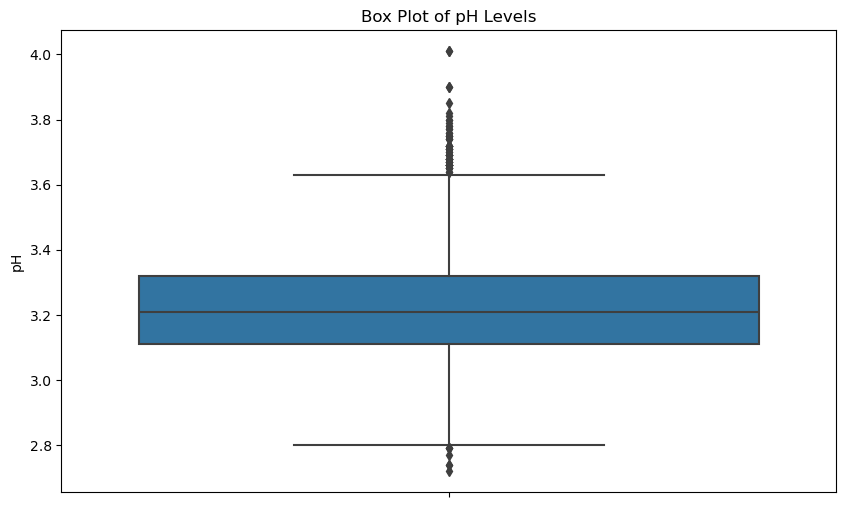

In [354]:
# Box plot of pH levels
plt.figure(figsize=(10, 6))
sns.boxplot(y='ph', data=data)
plt.title('Box Plot of pH Levels')
plt.ylabel('pH')
plt.show()

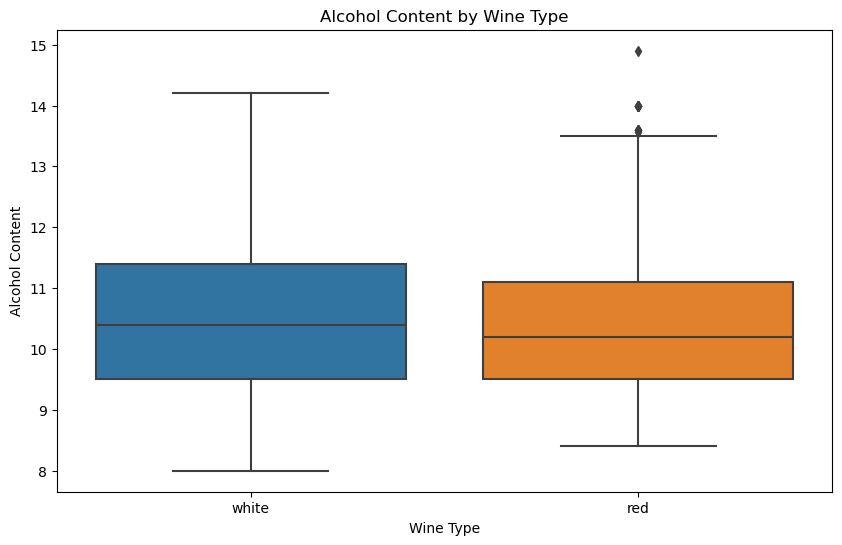

In [355]:
# Box plot for alcohol content by wine type
plt.figure(figsize=(10, 6))
sns.boxplot(x='winetype', y='alcohol', data=data)
plt.title('Alcohol Content by Wine Type')
plt.xlabel('Wine Type')
plt.ylabel('Alcohol Content')
plt.show()

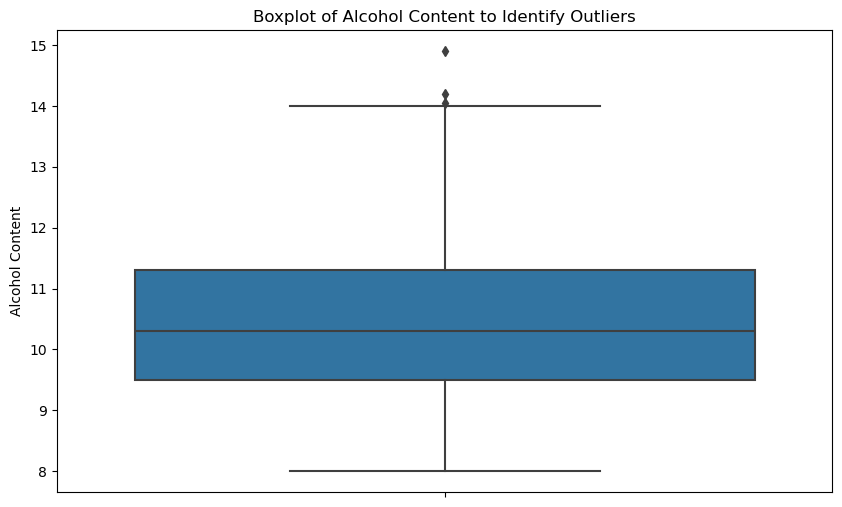

In [356]:
# Boxplot for outlier detection
plt.figure(figsize=(10, 6))
sns.boxplot(y=data['alcohol'])
plt.title('Boxplot of Alcohol Content to Identify Outliers')
plt.ylabel('Alcohol Content')
plt.show()

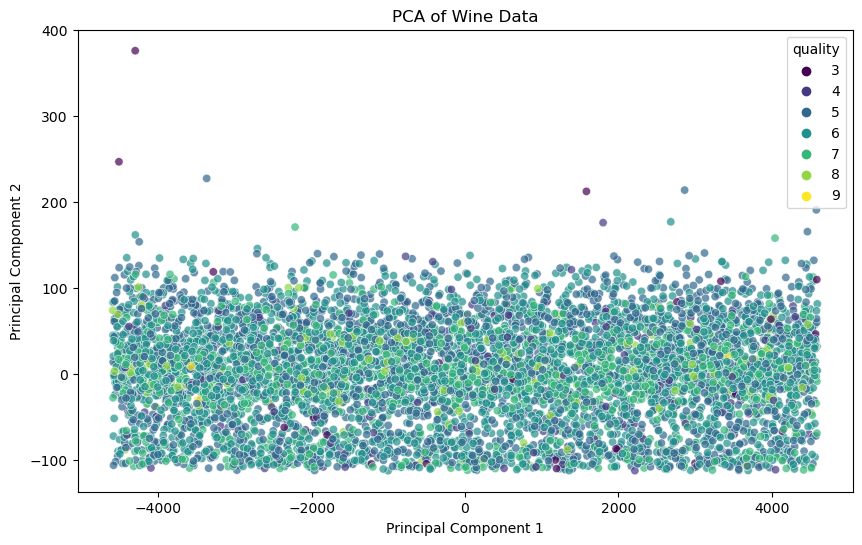

In [357]:
from sklearn.decomposition import PCA
import numpy as np

# Selecting numeric features
features = data.select_dtypes(include=[np.number])
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['quality'] = data['quality']

# Plotting PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='quality', data=pca_df, palette='viridis', alpha=0.7)
plt.title('PCA of Wine Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

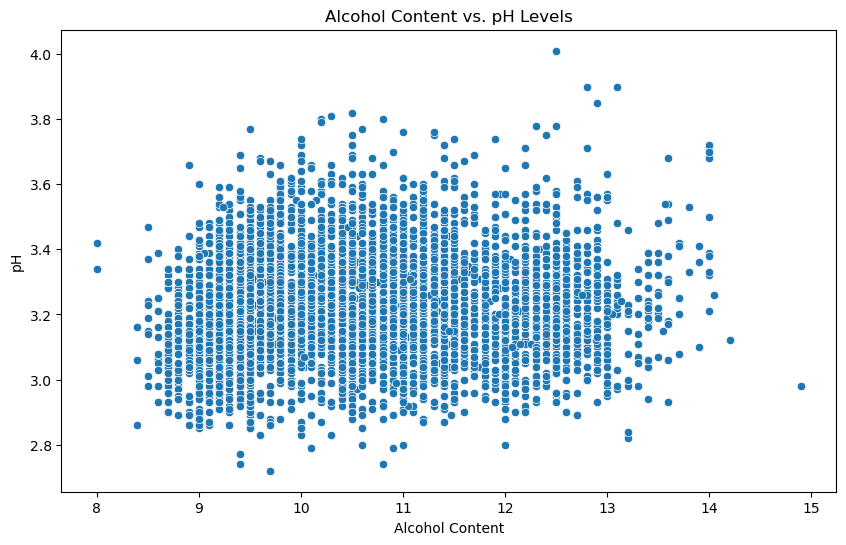

In [358]:
# Scatter plot of alcohol content vs. pH levels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='alcohol', y='ph', data=data)
plt.title('Alcohol Content vs. pH Levels')
plt.xlabel('Alcohol Content')
plt.ylabel('pH')
plt.show()

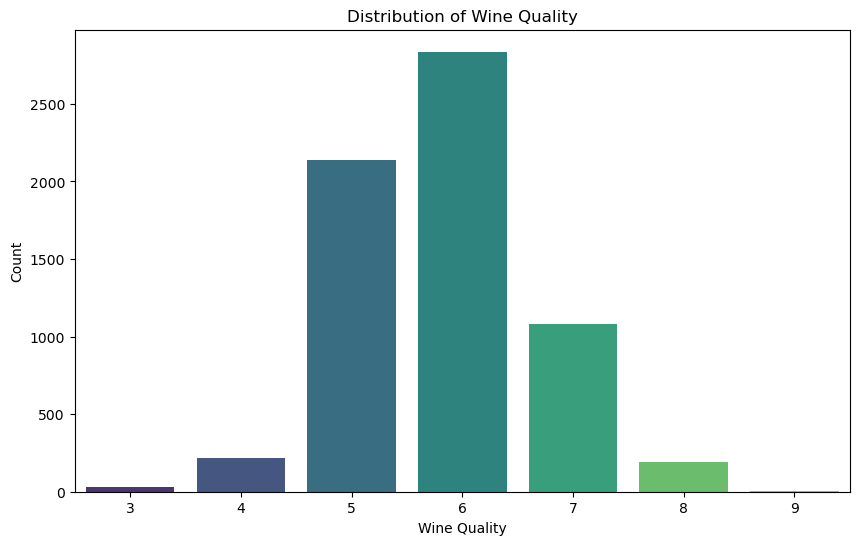

In [359]:
# Count plot of wine quality
plt.figure(figsize=(10, 6))
sns.countplot(x='quality', data=data, palette='viridis')
plt.title('Distribution of Wine Quality')
plt.xlabel('Wine Quality')
plt.ylabel('Count')
plt.show()

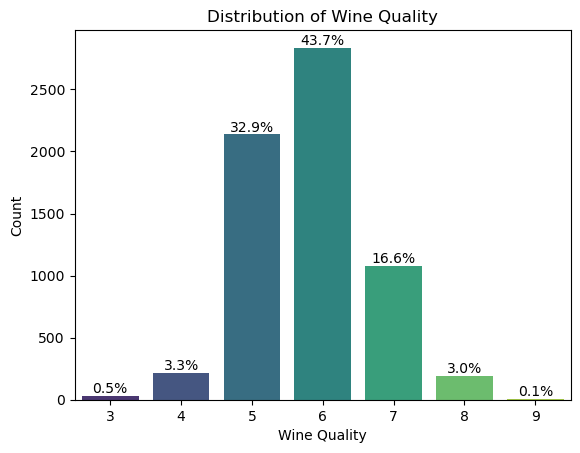

In [360]:
# Create count plot
ax = sns.countplot(x='quality', data=data, palette='viridis')

# Calculate total count for percentage calculation
total = len(data)

# Add percentages to bars
for p in ax.patches:
    count = p.get_height()
    percentage = (count / total) * 100
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2., count), 
                ha='center', va='bottom')

# Add titles and labels
plt.title('Distribution of Wine Quality')
plt.xlabel('Wine Quality')
plt.ylabel('Count')

plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

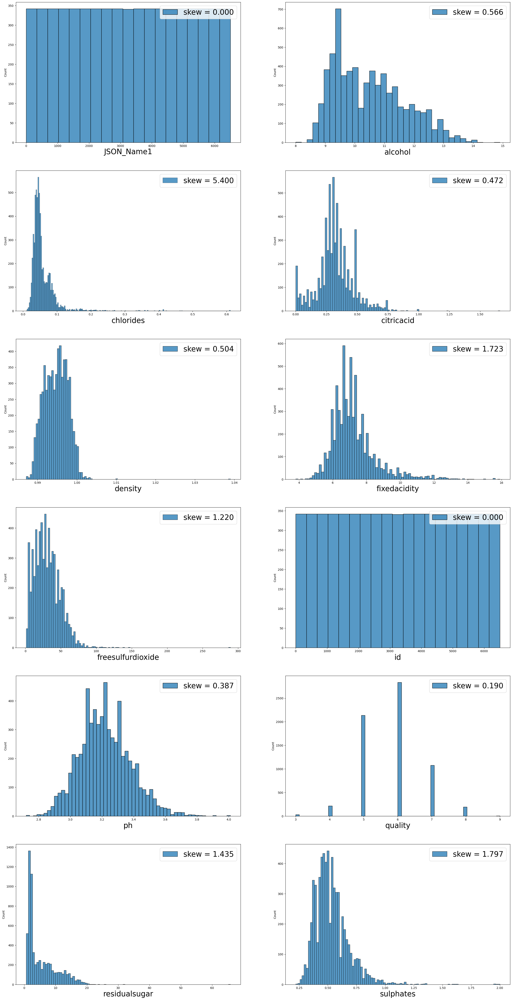

In [361]:
# Distribution of features
from seaborn import histplot
fig,axs = plt.subplots(nrows=6, ncols=2,figsize=(30,60))
for p,ax in zip(data.columns,axs.flat):
    skew = data[p].skew()
    histplot(data[p],kde=False,label = 'skew = %.3f'%skew, ax=ax)
    ax.legend(loc='best',fontsize=25)
    ax.set_xlabel(p,fontsize=25)
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

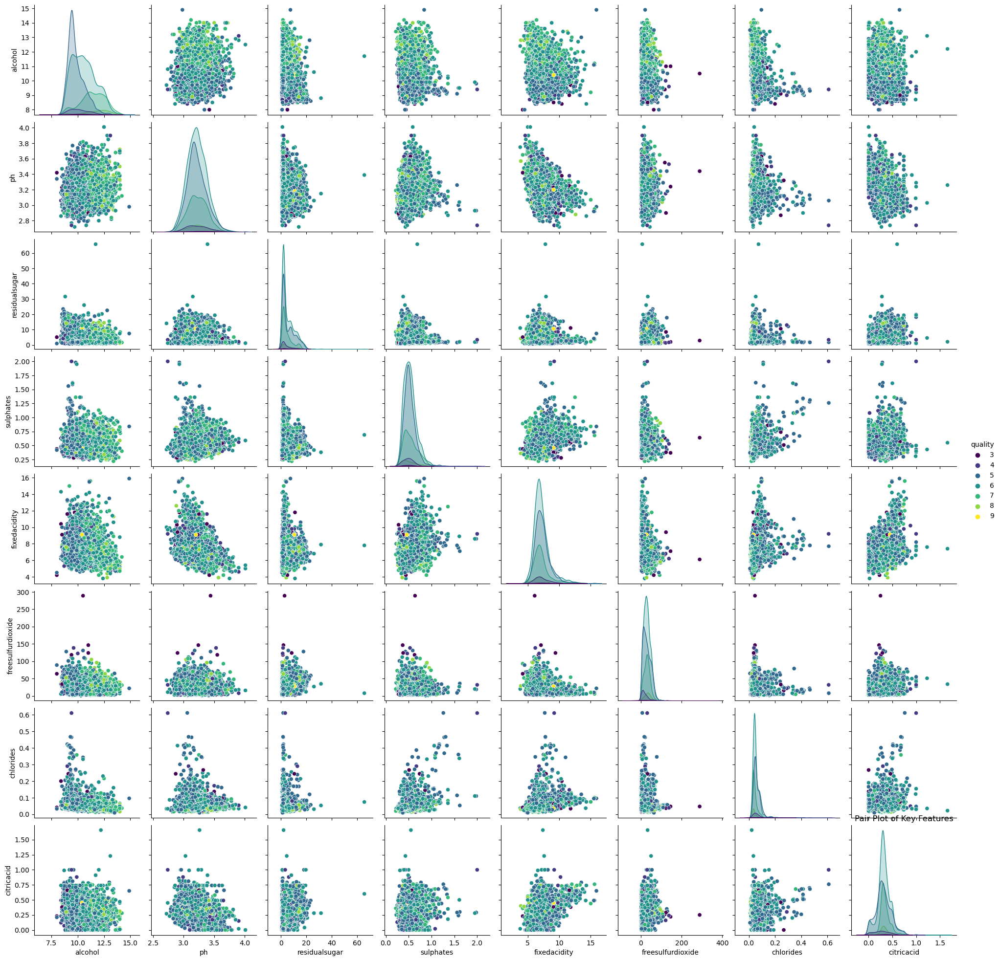

In [362]:
# Pair plot of key features
key_features = ['alcohol', 'ph', 'residualsugar', 'sulphates', 'quality', 'fixedacidity', 'freesulfurdioxide', 'chlorides', 'citricacid']
sns.pairplot(data[key_features], hue='quality', palette='viridis')
plt.title('Pair Plot of Key Features')
plt.show()

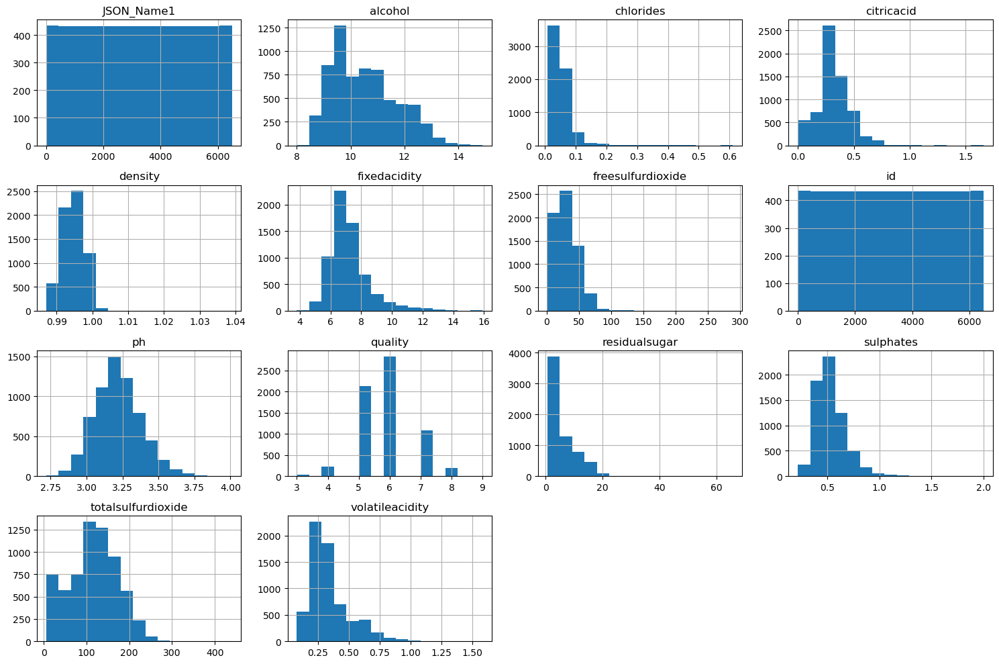

In [363]:
# Histograms for each feature
data.hist(bins=15, figsize=(15, 10), layout=(4, 4))
plt.tight_layout()
plt.show()

In [364]:
data = data.drop(columns=['JSON_Name1', 'id'], errors='ignore')

IndexError: index 12 is out of bounds for axis 0 with size 12

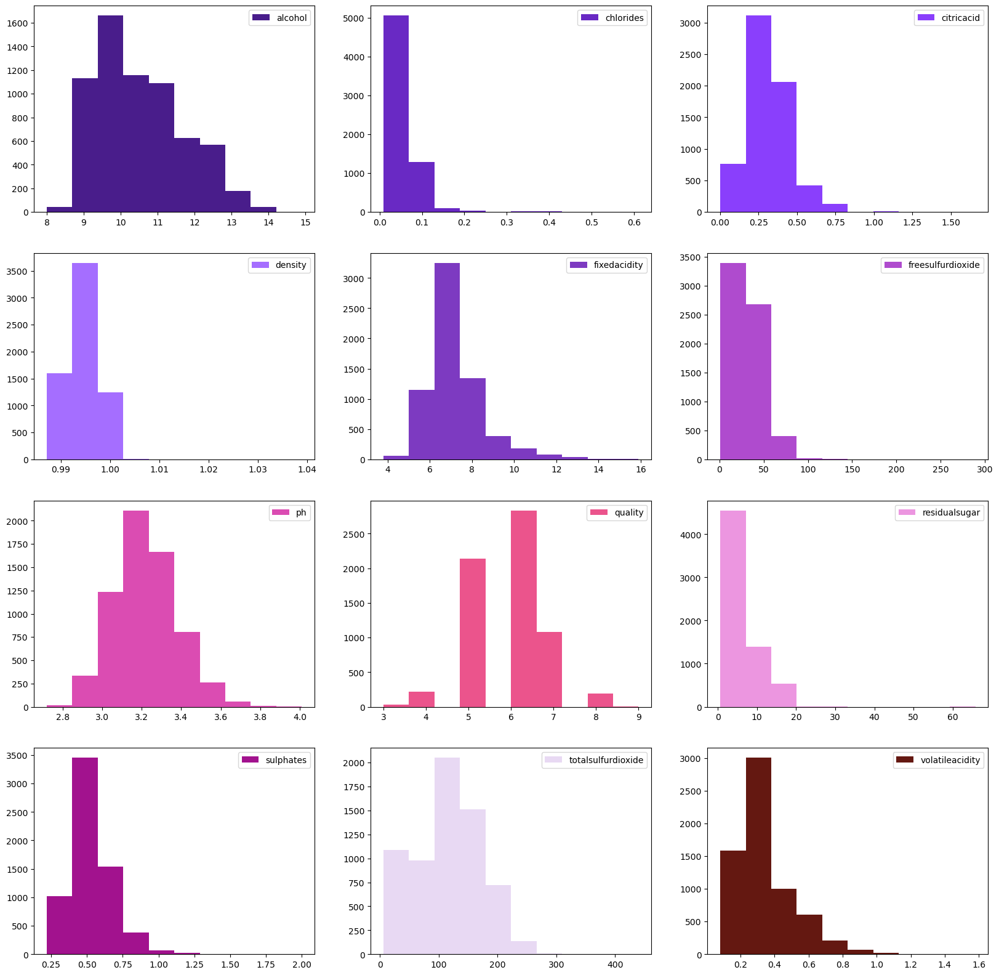

In [365]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (20, 20))

colors = ['#491D8B', '#6929C4', '#8A3FFC', '#A56EFF',
          '#7D3AC1', '#AF4BCE', '#DB4CB2', '#EB548C',
          '#EC96E0', '#A2128E', '#E8D9F3', '#641811']

for index, column in enumerate(data.columns):
    ax = axes.flatten()[index]
    ax.hist(data[column], color = colors[index], label = column)
    ax.legend(loc = "best")
plt.suptitle("Histograms", size = 18)

plt.show()

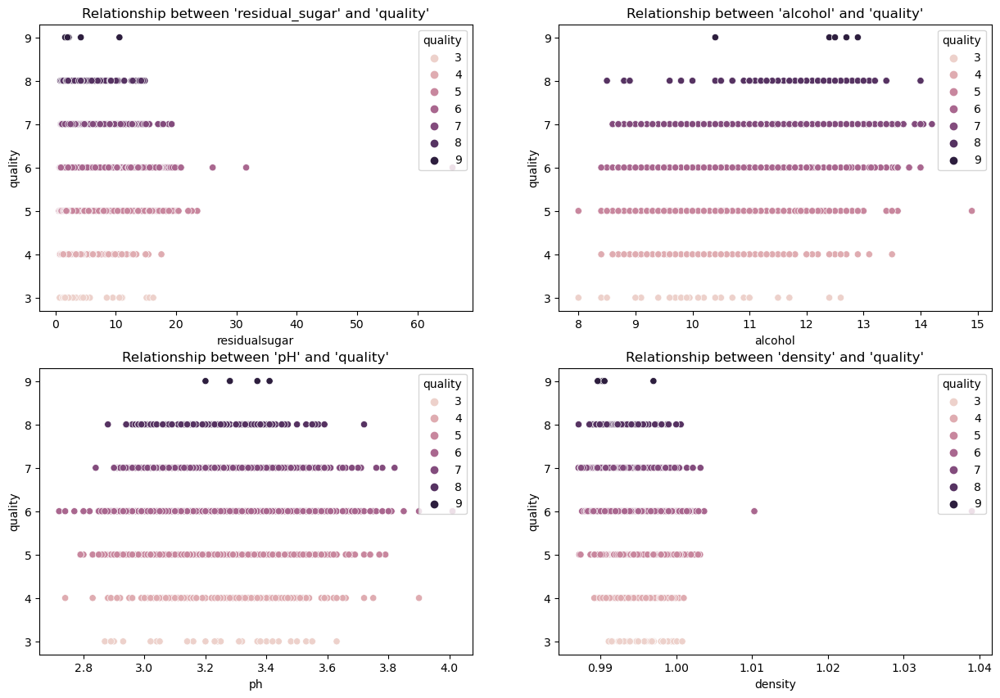

In [387]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

sns.scatterplot(ax = axes[0],
                x = "residualsugar",
                y = "quality", hue = "quality",
                data = data).set(title = "Relationship between 'residual_sugar' and 'quality'");

sns.scatterplot(ax = axes[1],
                x = "alcohol",
                y = "quality", hue = "quality",
                data = data).set(title = "Relationship between 'alcohol' and 'quality'");

sns.scatterplot(ax = axes[2],
                x = "ph",
                y = "quality", hue = "quality",
                data = data).set(title = "Relationship between 'pH' and 'quality'");

sns.scatterplot(ax = axes[3],
                x = "density",
                y = "quality", hue = "quality",
                data = data).set(title = "Relationship between 'density' and 'quality'");

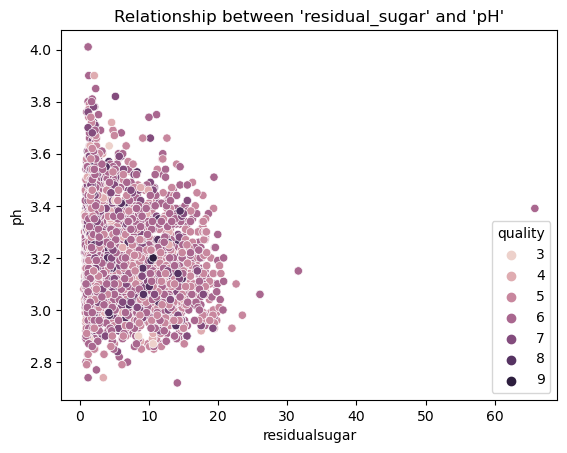

In [388]:
sns.scatterplot(x = "residualsugar",
                y = "ph",
                hue = "quality",
                data = data).set(title = "Relationship between 'residual_sugar' and 'pH'");

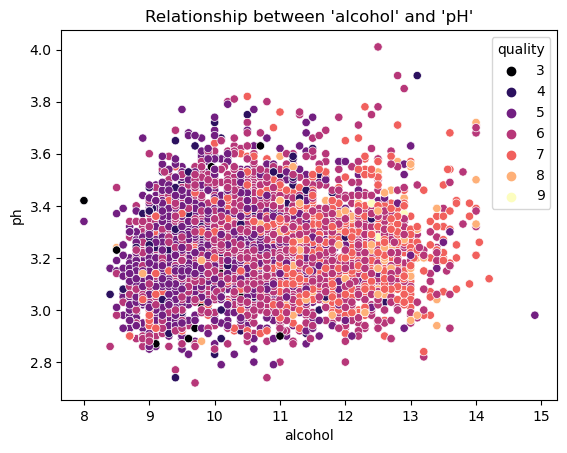

In [389]:
sns.scatterplot(x = "alcohol",
                y = "ph",
                hue = "quality",
                palette = "magma",
                data = data).set(title = "Relationship between 'alcohol' and 'pH'");

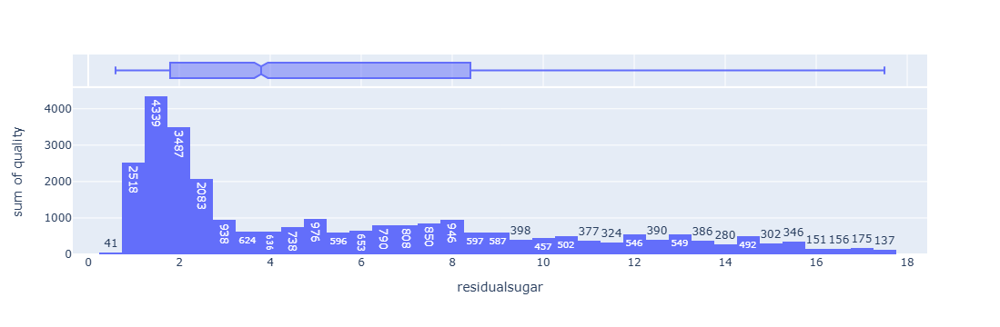

In [875]:
import plotly.express as px
fig = px.histogram(data, x = "residualsugar", y = "quality", marginal = "box",
                   color = None, text_auto = True, hover_data  = data.columns)
fig.show()

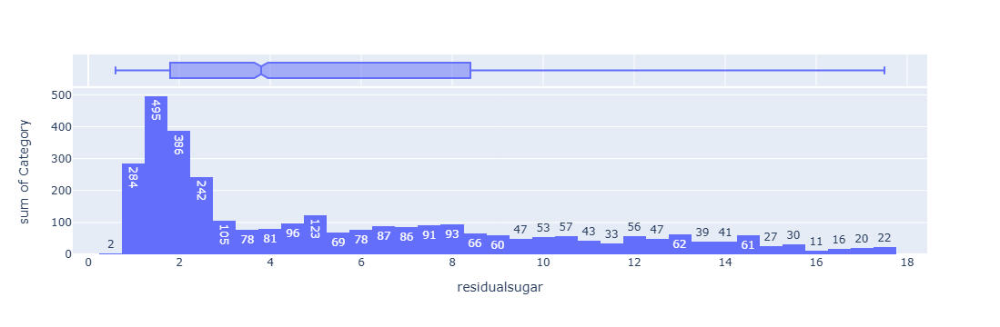

In [877]:
fig = px.histogram(data, x = "residualsugar", y = "Category", marginal = "box",
                   color = None, text_auto = True, hover_data  = data.columns)
fig.show()

In [392]:
# Separate columns into continuous and categorical
continuous_cols = data.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



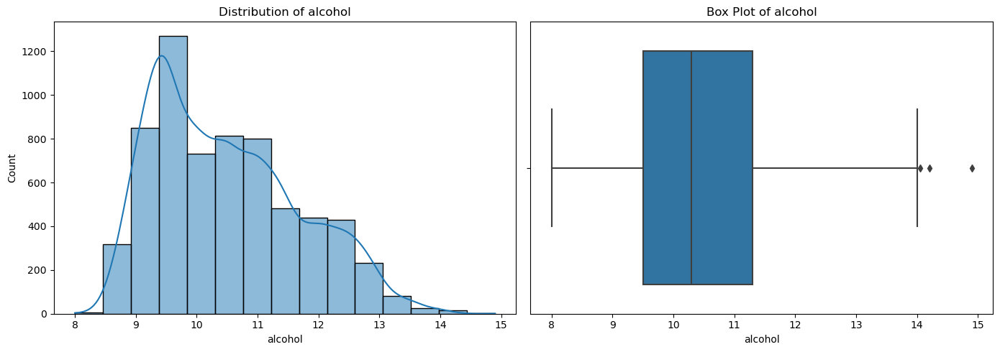

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



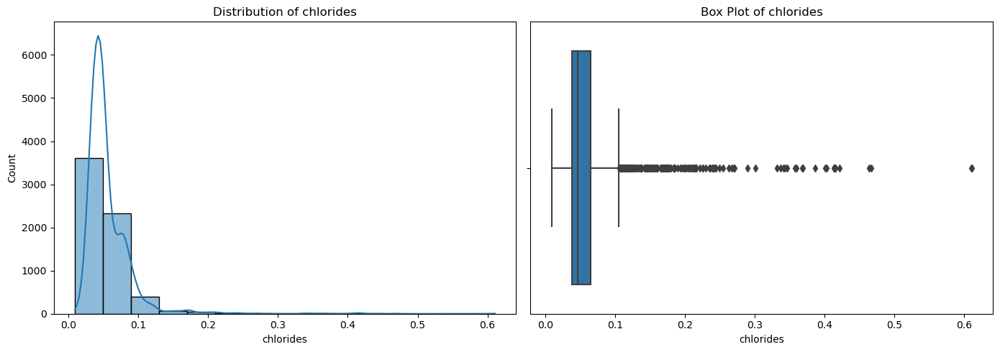

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



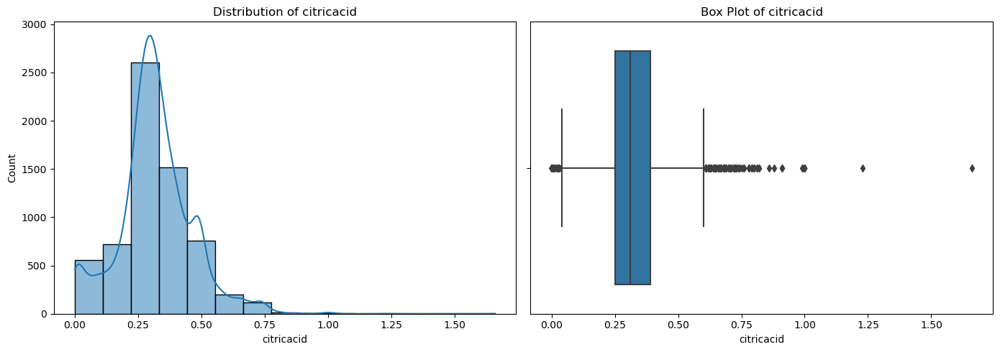

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



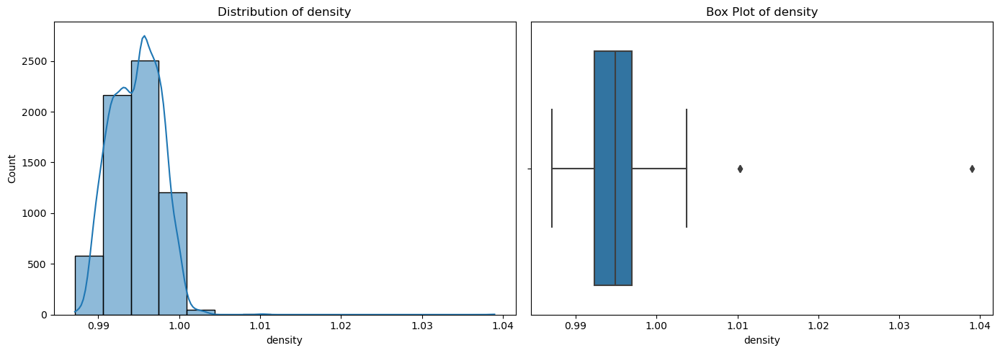

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



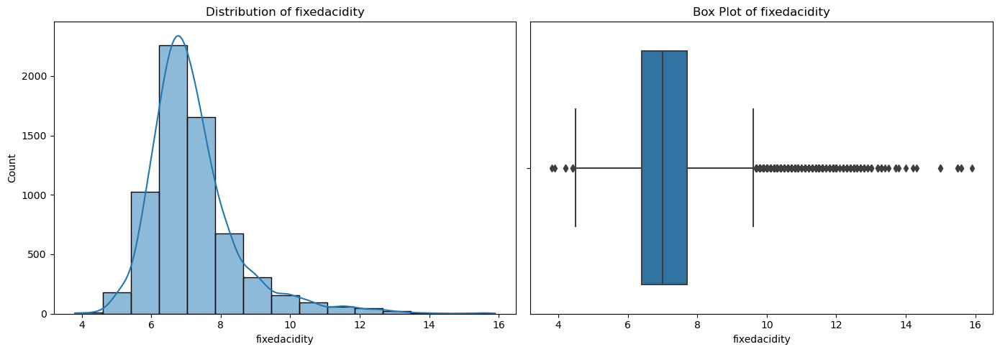

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



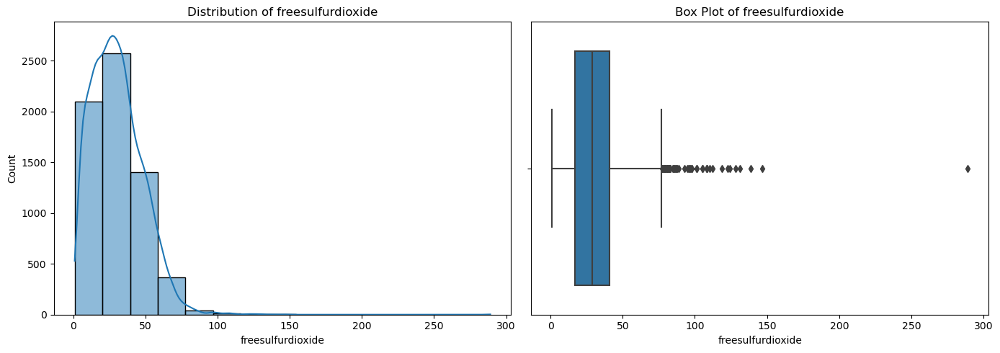

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



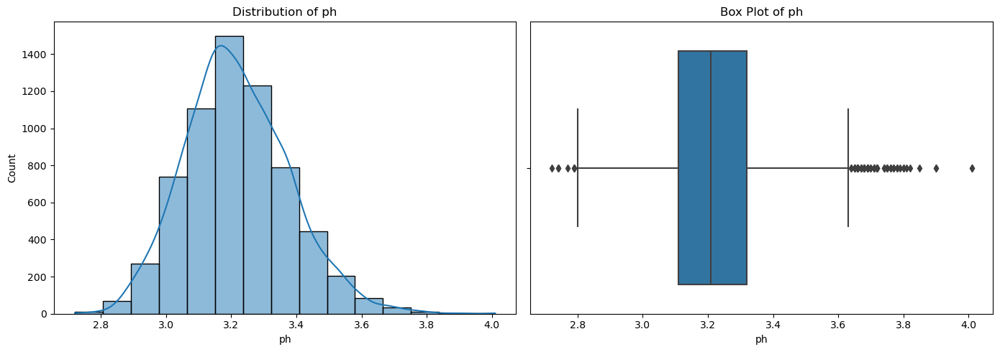

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



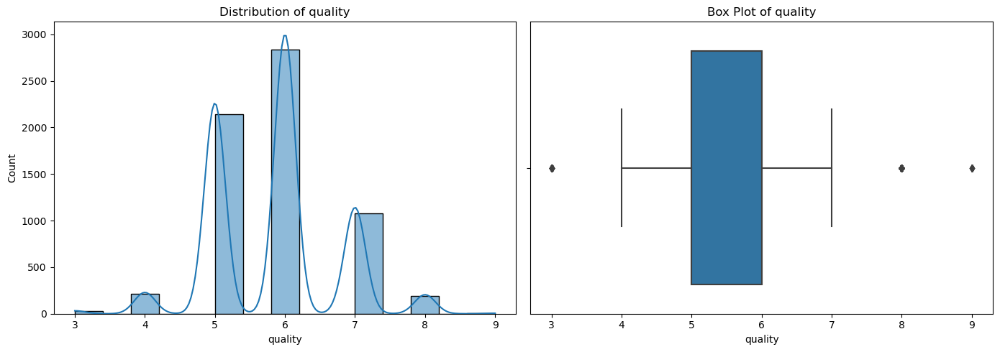

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



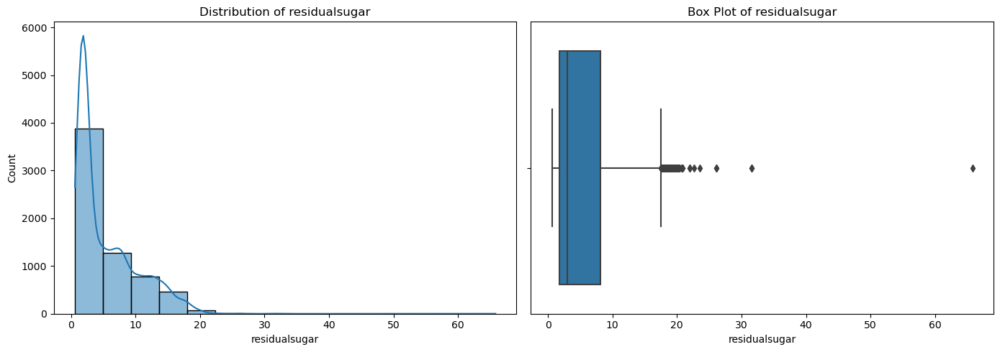

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



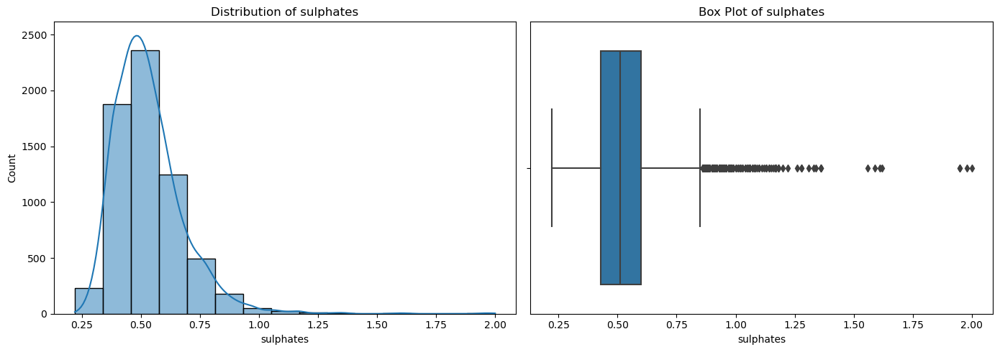

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



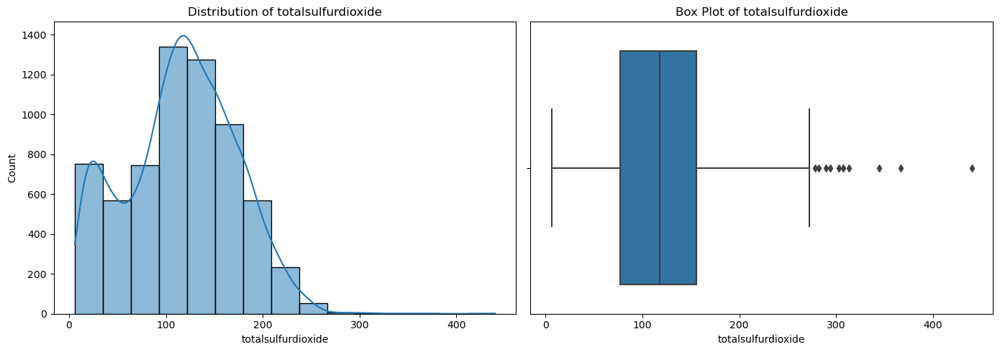

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



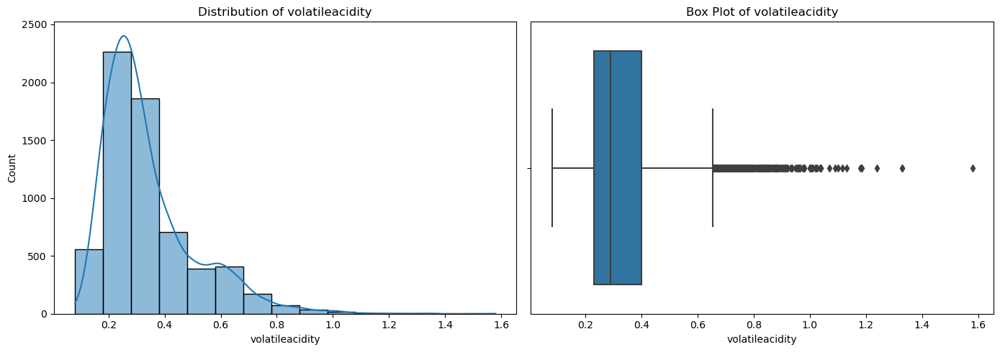

In [393]:
# Loop over continuous columns for histograms and box plots
for col in continuous_cols:
    plt.figure(figsize=(14, 5))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[col], bins=15, kde=True)
    plt.title(f'Distribution of {col}')

    # Box Plot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col])
    plt.title(f'Box Plot of {col}')

    plt.tight_layout()
    plt.show()

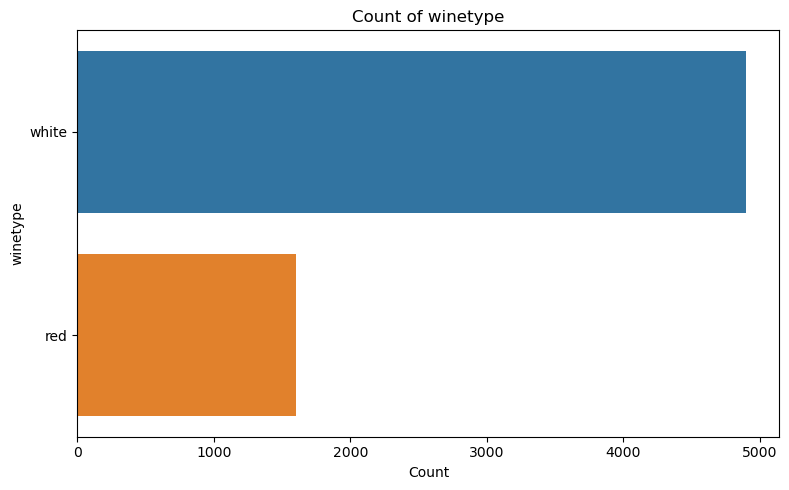

In [394]:
# Loop over categorical columns for count plots
for col in categorical_cols:
    plt.figure(figsize=(8, 5))

    # Count Plot
    sns.countplot(y=data[col], order=data[col].value_counts().index)
    plt.title(f'Count of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)

    plt.tight_layout()
    plt.show()

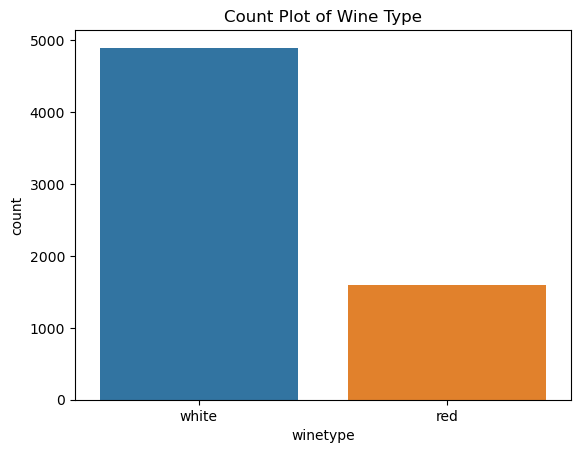

In [396]:
sns.countplot(x='winetype', data=data)
plt.title('Count Plot of Wine Type')
plt.show()

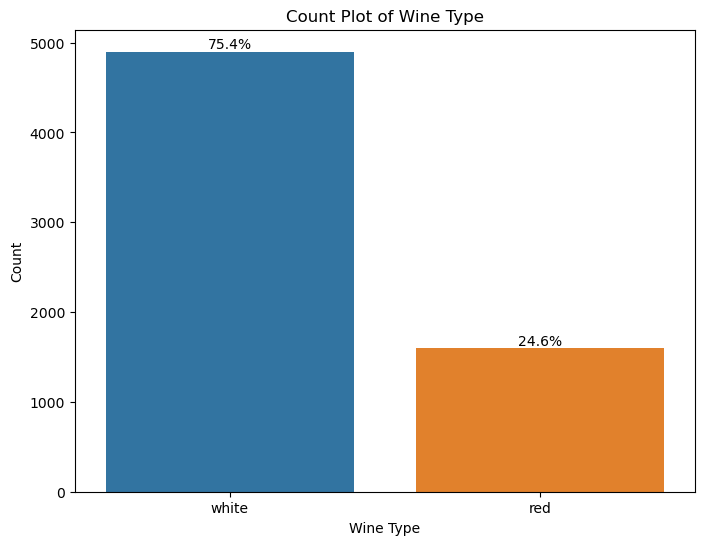

In [397]:
# Create a count plot
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='winetype', data=data)

# Calculate total count for percentage calculation
total = len(data)

# Add percentages to bars
for p in ax.patches:
    count = p.get_height()
    percentage = (count / total) * 100
    ax.annotate(f'{percentage:.1f}%', 
                (p.get_x() + p.get_width() / 2., count), 
                ha='center', va='bottom')

# Add title and labels
plt.title('Count Plot of Wine Type')
plt.xlabel('Wine Type')
plt.ylabel('Count')

plt.show()

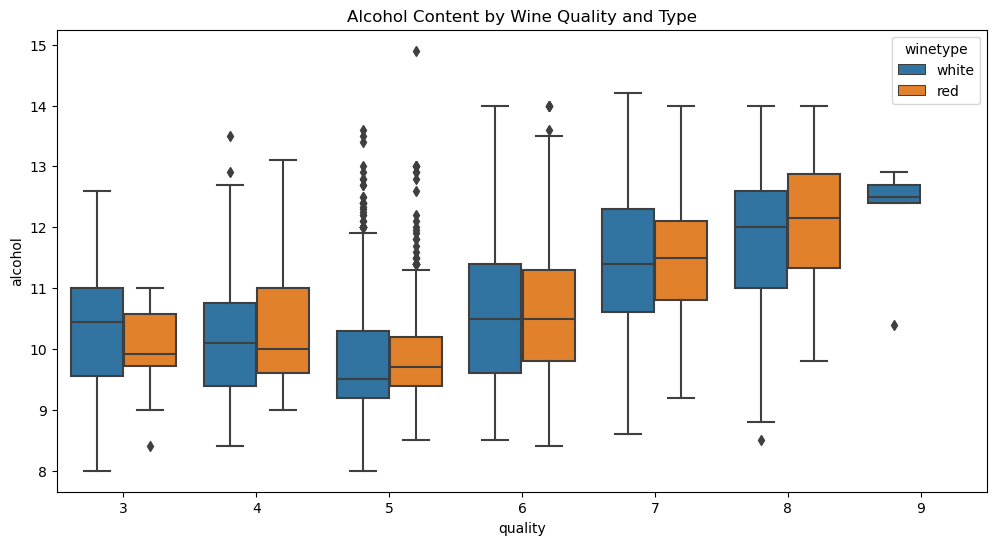

In [399]:
# Box plot of alcohol content by wine quality
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='quality', y='alcohol', hue='winetype')
plt.title('Alcohol Content by Wine Quality and Type')
plt.show()

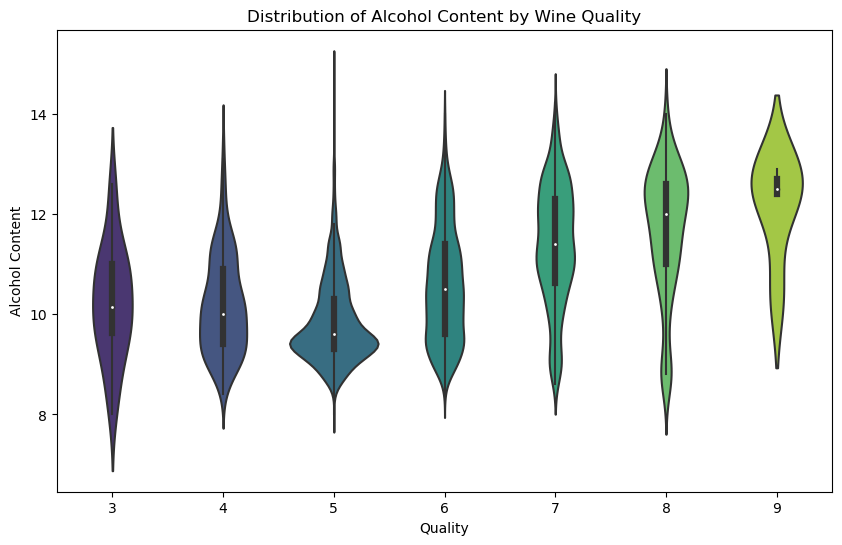

In [402]:
# Violin plot for alcohol content by quality
plt.figure(figsize=(10, 6))
sns.violinplot(x='quality', y='alcohol', data=data, palette='viridis')
plt.title('Distribution of Alcohol Content by Wine Quality')
plt.xlabel('Quality')
plt.ylabel('Alcohol Content')
plt.show()

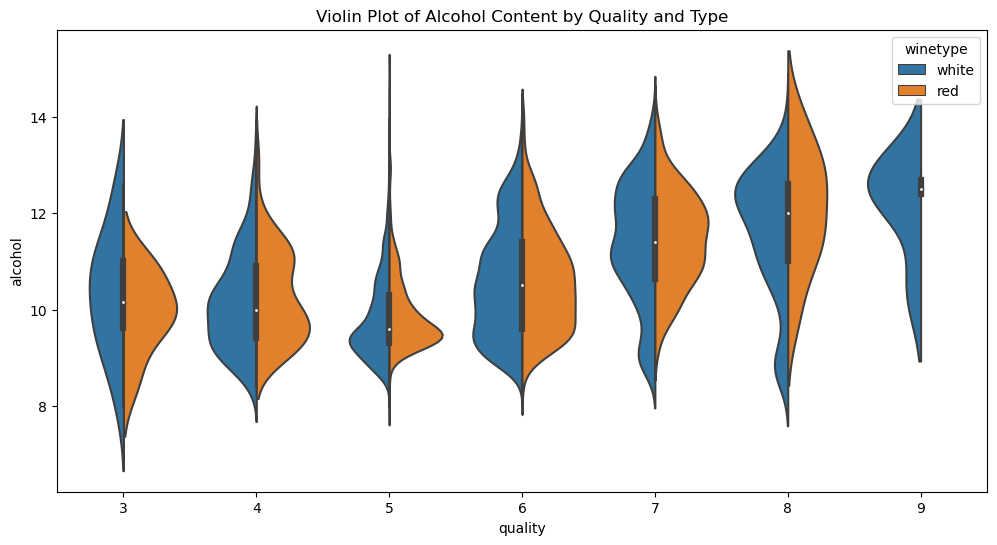

In [403]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=data, x='quality', y='alcohol', hue='winetype', split=True)
plt.title('Violin Plot of Alcohol Content by Quality and Type')
plt.show()

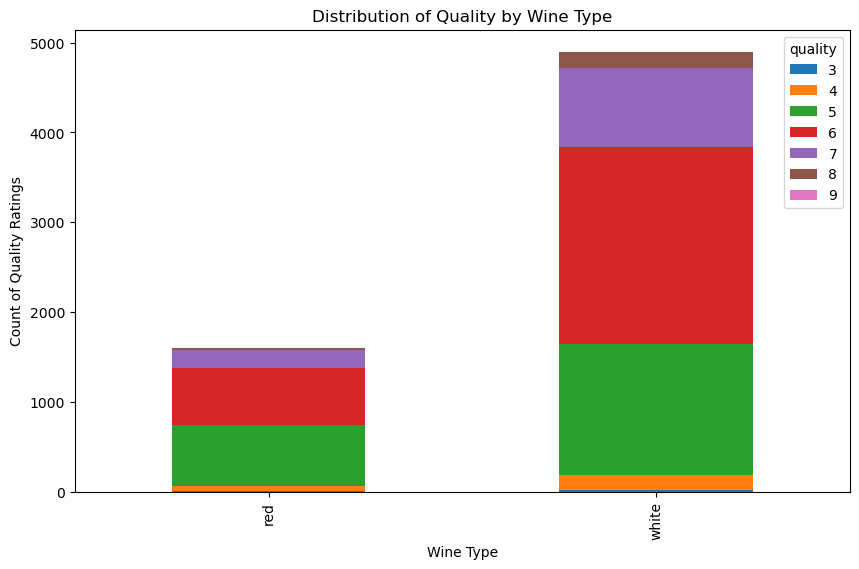

In [404]:
quality_counts = data.groupby(['winetype', 'quality']).size().unstack(fill_value=0)
quality_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Distribution of Quality by Wine Type')
plt.xlabel('Wine Type')
plt.ylabel('Count of Quality Ratings')
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

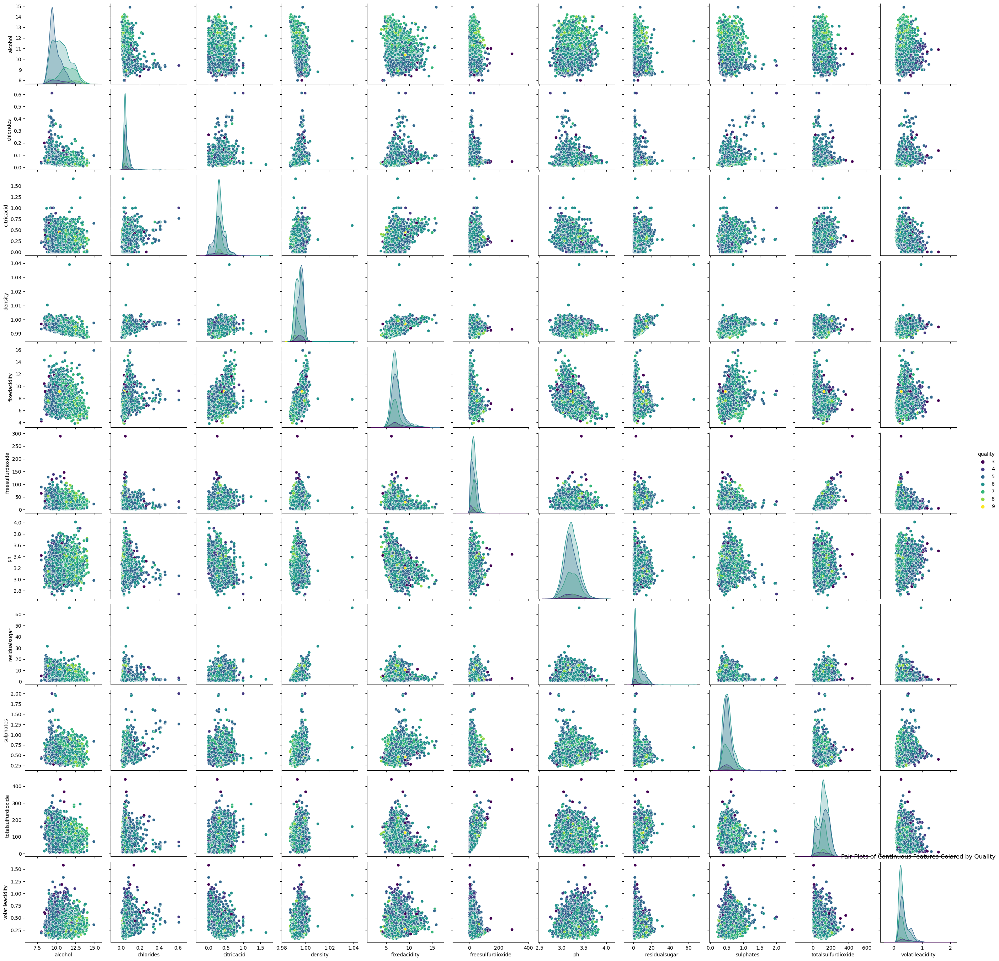

In [405]:
# Pair plots for continuous variables
sns.pairplot(data, hue='quality', diag_kind='kde', palette='viridis')
plt.title('Pair Plots of Continuous Features Colored by Quality')
plt.show()

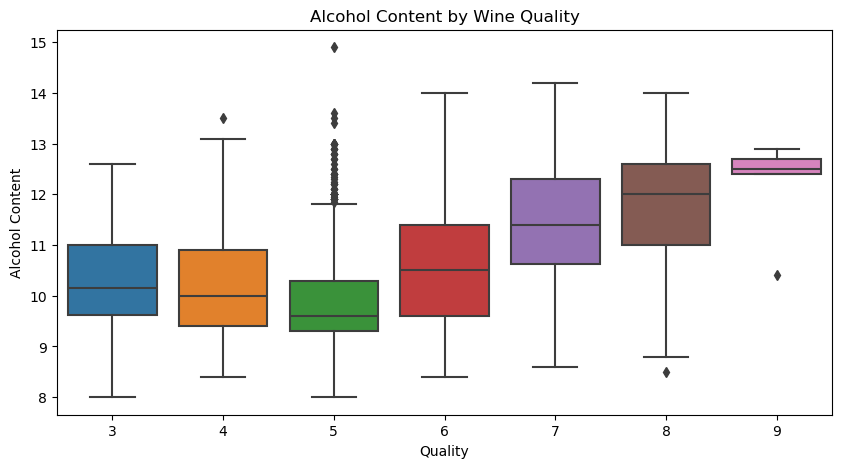

In [406]:
# Boxplot of alcohol content by wine quality
plt.figure(figsize=(10, 5))
sns.boxplot(x='quality', y='alcohol', data=data)
plt.title('Alcohol Content by Wine Quality')
plt.xlabel('Quality')
plt.ylabel('Alcohol Content')
plt.show()

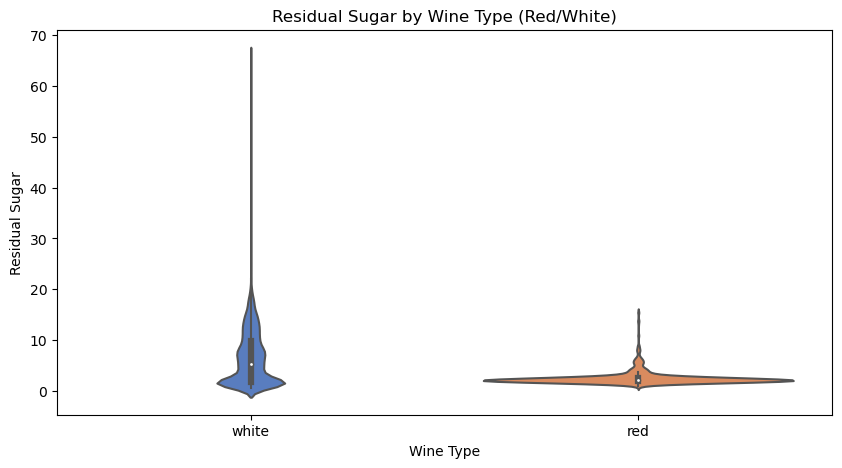

In [407]:
# Violin plot of residual sugar by wine type
plt.figure(figsize=(10, 5))
sns.violinplot(x='winetype', y='residualsugar', data=data, palette='muted')
plt.title('Residual Sugar by Wine Type (Red/White)')
plt.xlabel('Wine Type')
plt.ylabel('Residual Sugar')
plt.show()

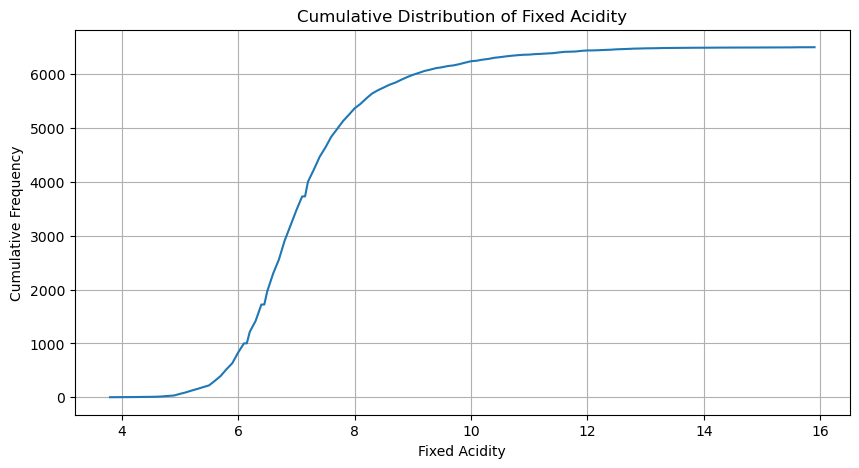

In [408]:
# CDF of fixed acidity
plt.figure(figsize=(10, 5))
data['fixedacidity'].value_counts().sort_index().cumsum().plot()
plt.title('Cumulative Distribution of Fixed Acidity')
plt.xlabel('Fixed Acidity')
plt.ylabel('Cumulative Frequency')
plt.grid()
plt.show()

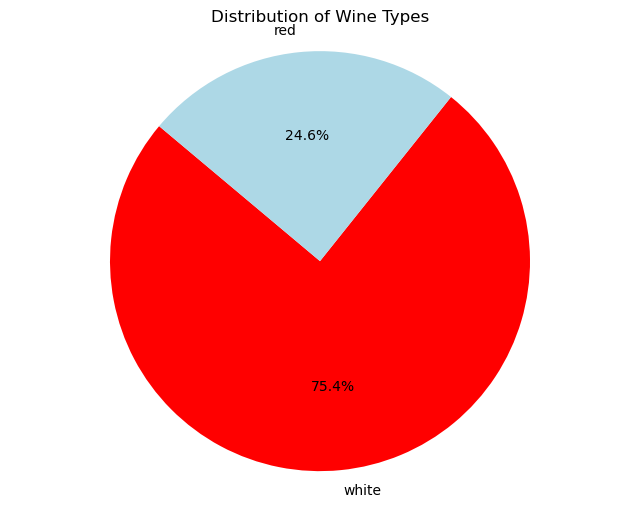

In [409]:
# Count the number of each wine type
wine_type_counts = data['winetype'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 6))
plt.pie(wine_type_counts, labels=wine_type_counts.index, autopct='%1.1f%%', startangle=140, colors=['red', 'lightblue'])
plt.title('Distribution of Wine Types')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is a circle.
plt.show()

In [410]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
le = LabelEncoder()

# Convert 'winetype' to numerical
data['winetype'] = le.fit_transform(data['winetype'])  # 'white' -> 0, 'red' -> 1

# Check the DataFrame
data

,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity,winetype
0,12.5,0.043,0.28,0.98918,6.1,24.0,3.14,6,1.7,0.44,98.0,0.26,1
1,8.6,0.041,0.69,0.99770,7.3,58.0,3.06,5,10.2,0.45,160.0,0.31,1
2,9.1,0.058,0.28,0.99520,6.9,14.0,3.29,6,5.0,0.36,146.0,0.19,1
3,9.4,0.060,0.26,0.99690,6.9,55.0,3.21,5,10.9,0.44,193.0,0.56,1
4,9.6,0.055,0.34,0.99450,7.5,50.0,3.29,6,1.3,0.80,153.0,0.14,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,10.7,0.064,0.00,0.99500,6.0,40.0,3.54,6,2.1,0.93,54.0,0.51,0
6493,11.5,0.036,0.49,0.99320,6.9,49.0,3.20,6,6.6,0.27,172.0,0.19,1
6494,10.4,0.054,0.20,0.99200,6.9,5.0,3.10,6,0.9,0.42,126.0,0.46,1
6495,9.5,0.067,0.02,0.99700,6.4,4.0,3.46,5,1.8,0.68,11.0,0.57,0


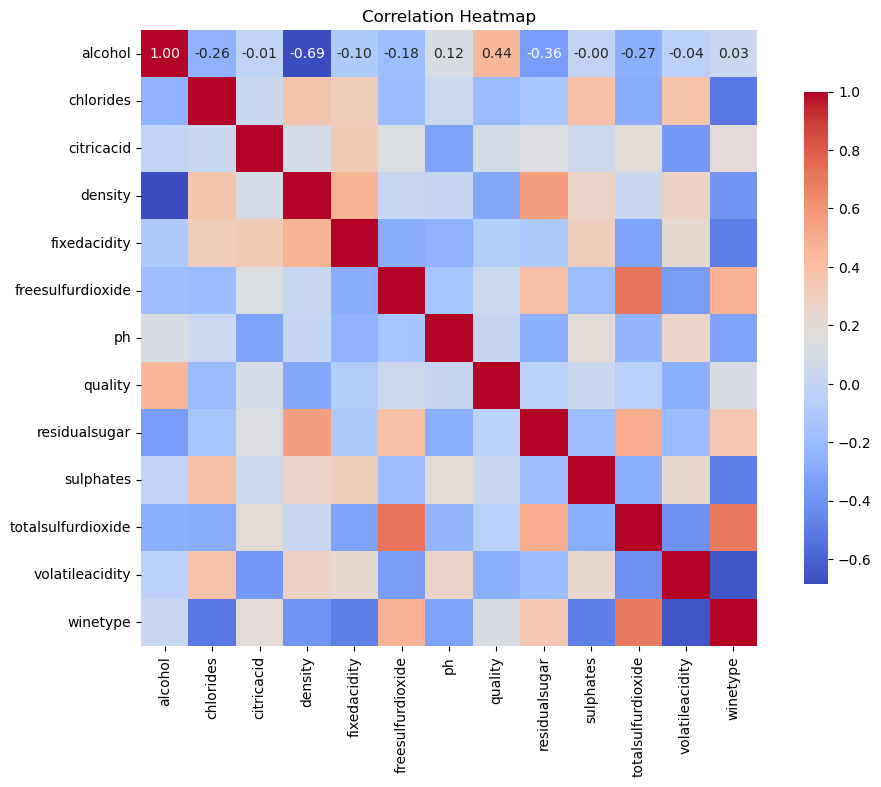

In [420]:
# Correlation matrix
correlation_matrix = data.corr()

# Heatmap for correlations
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={'shrink': .8})
plt.title('Correlation Heatmap')
plt.show()

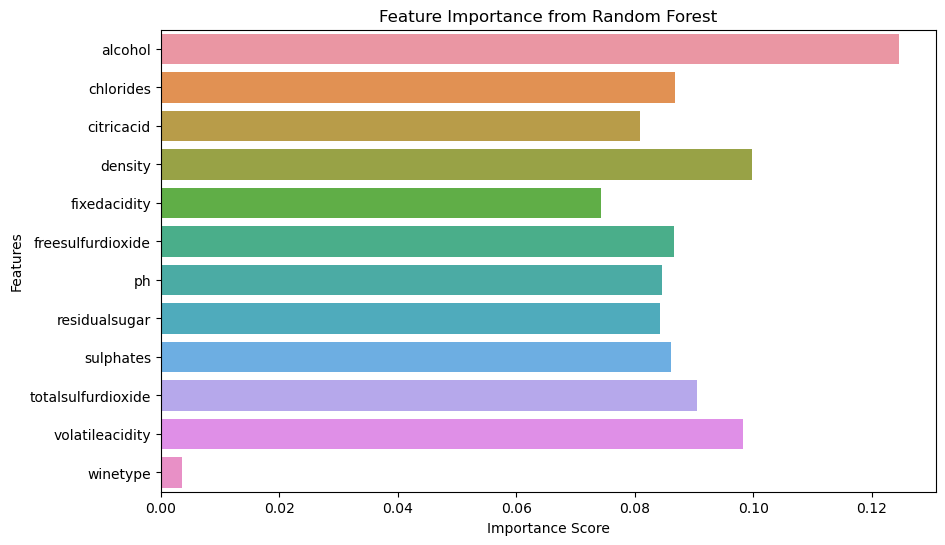

In [422]:
from sklearn.ensemble import RandomForestClassifier

# Train a Random Forest model for feature importance
model = RandomForestClassifier(n_estimators=100, random_state=42)
x = data.drop('quality', axis=1)
y = data['quality']
model.fit(x, y)

# Feature importance
importances = model.feature_importances_
features = x.columns

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features)
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='quality', ylabel='winetype'>

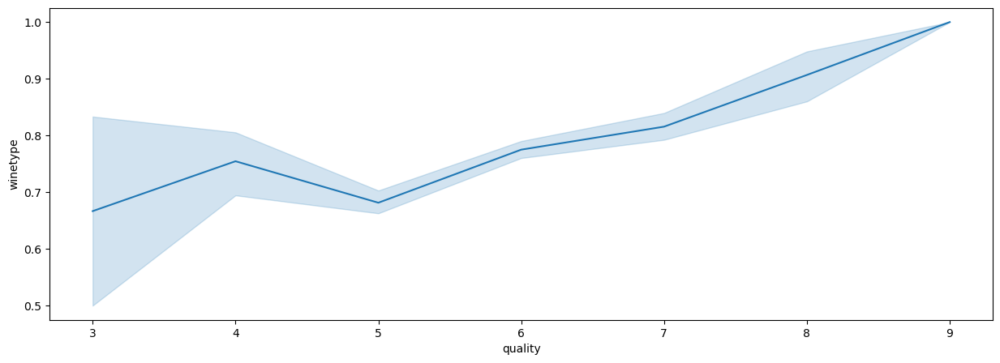

In [423]:
# ploting the line chart to check the devaiation of the value over the year
plt.figure(figsize = [15, 5])
sns.lineplot(data = data, x = 'quality', y = 'winetype')

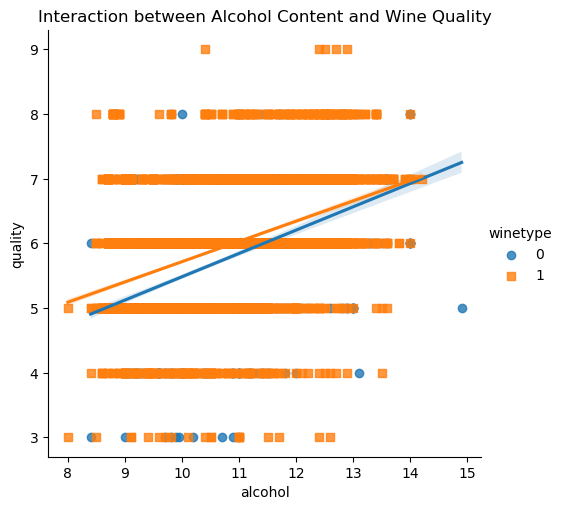

In [424]:
# Using interaction between alcohol content and sulphates
sns.lmplot(x='alcohol', y='quality', hue='winetype', data=data, markers=['o', 's'])
plt.title('Interaction between Alcohol Content and Wine Quality')
plt.show()

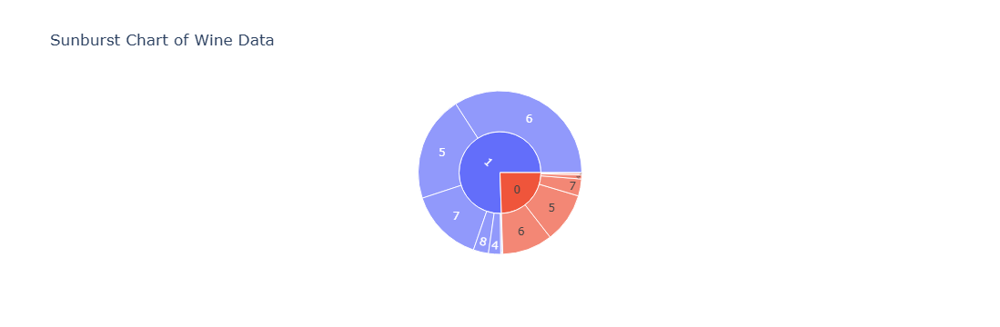

In [425]:
# Create sunburst chart
import plotly.express as px
fig = px.sunburst(data, path=['winetype', 'quality'], values='alcohol',
                  title='Sunburst Chart of Wine Data')

# Show the chart
fig.show()

In [426]:
import pandas as pd
import plotly.express as px

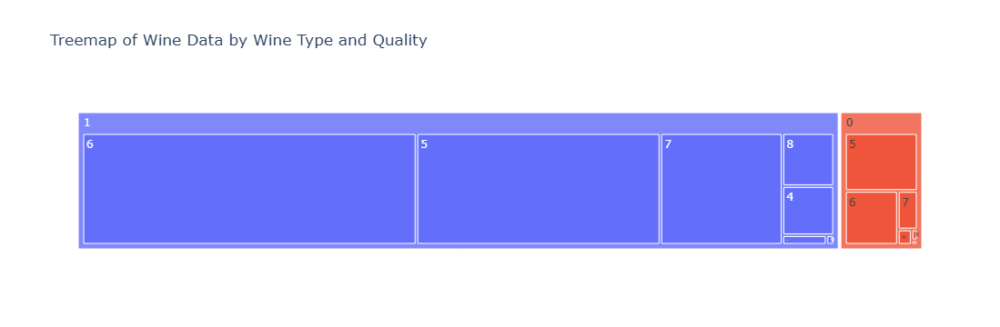

In [427]:
# Create treemap chart
fig = px.treemap(data, path=['winetype', 'quality'], values='totalsulfurdioxide',
                 title='Treemap of Wine Data by Wine Type and Quality')

# Show the chart
fig.show()

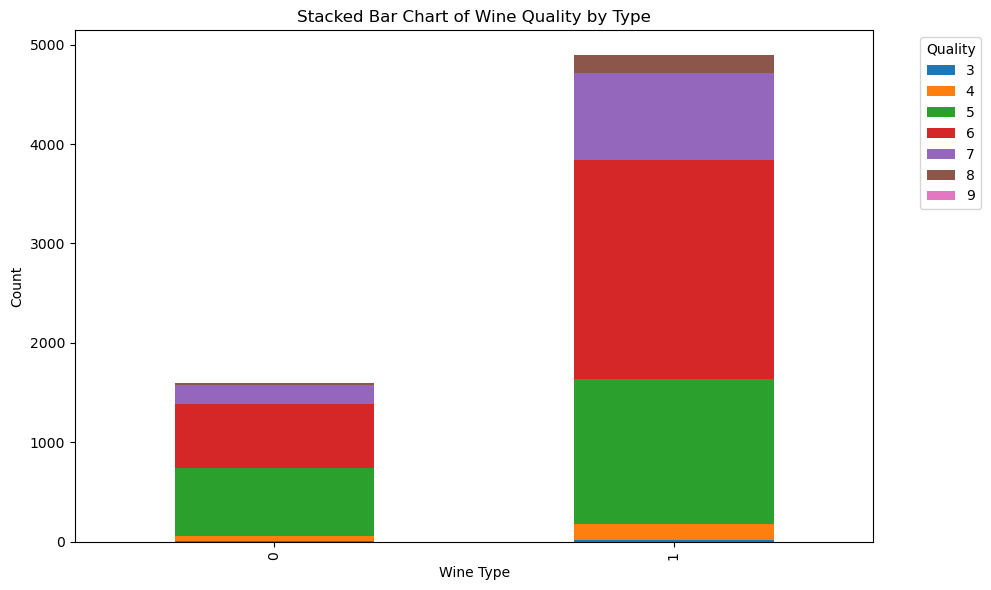

In [428]:
# Count records for each combination of winetype and quality
count_df = data.groupby(['winetype', 'quality']).size().reset_index(name='count')

# Pivot the DataFrame to get categories in rows and counts
pivot_df = count_df.pivot_table(index='winetype', columns='quality', values='count', fill_value=0)

# Create a stacked bar chart
pivot_df.plot(kind='bar', stacked=True, figsize=(10, 6))

# Set title and labels
plt.title('Stacked Bar Chart of Wine Quality by Type')
plt.xlabel('Wine Type')
plt.ylabel('Count')
plt.legend(title='Quality', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()

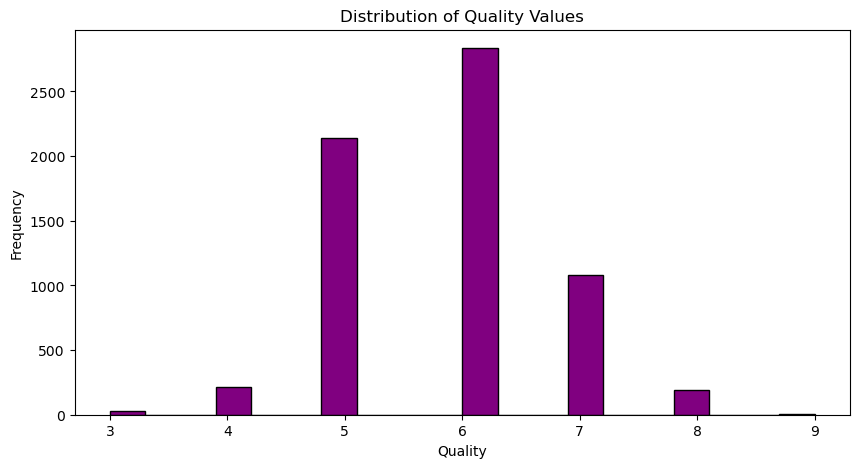

In [459]:
# Plotting the Histogram
plt.figure(figsize=(10, 5))
plt.hist(data['quality'], bins=20, color='purple', edgecolor='black')

# Adding titles and labels
plt.title('Distribution of Quality Values')
plt.xlabel('Quality')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [463]:
  def pie_chart(data,col):
        targets = list(data[col].value_counts().index)
        values = list((data[col].value_counts()*100/len(data[col])).values)
        fig = px.pie(values=values, names=targets,color_discrete_sequence=['darkcyan', 'lawngreen'],title=col)
        fig.show()

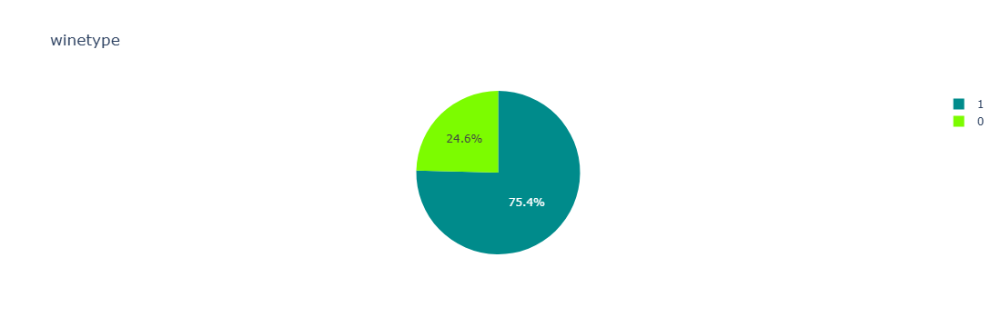

In [465]:
pie_chart(data,'winetype')

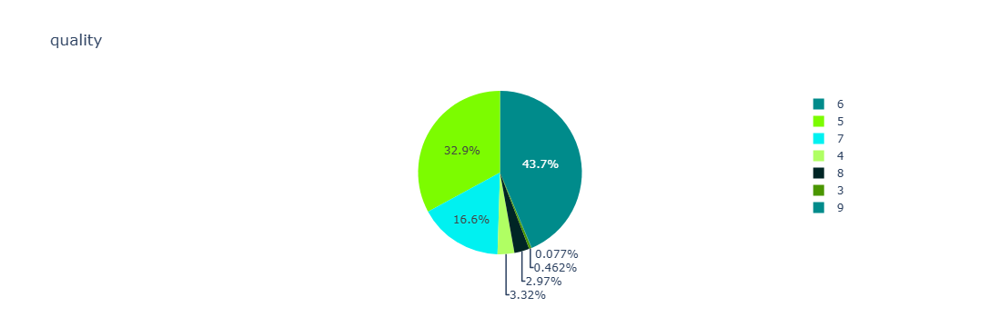

In [467]:
pie_chart(data,'quality')

In [469]:
# include the data label , and add the interpretation for each chart , 

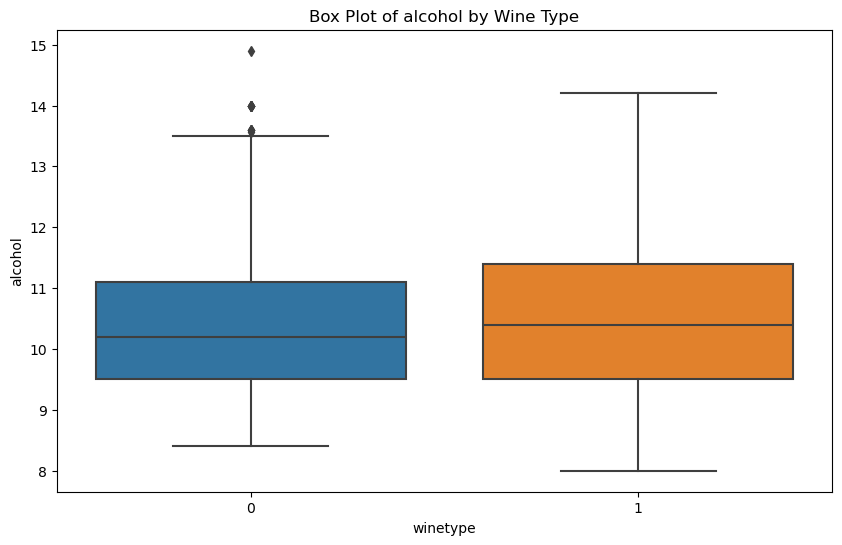

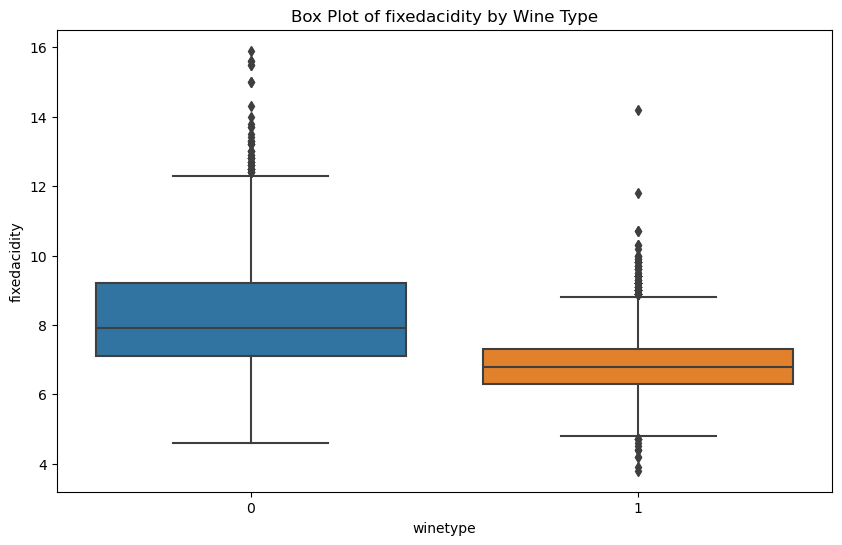

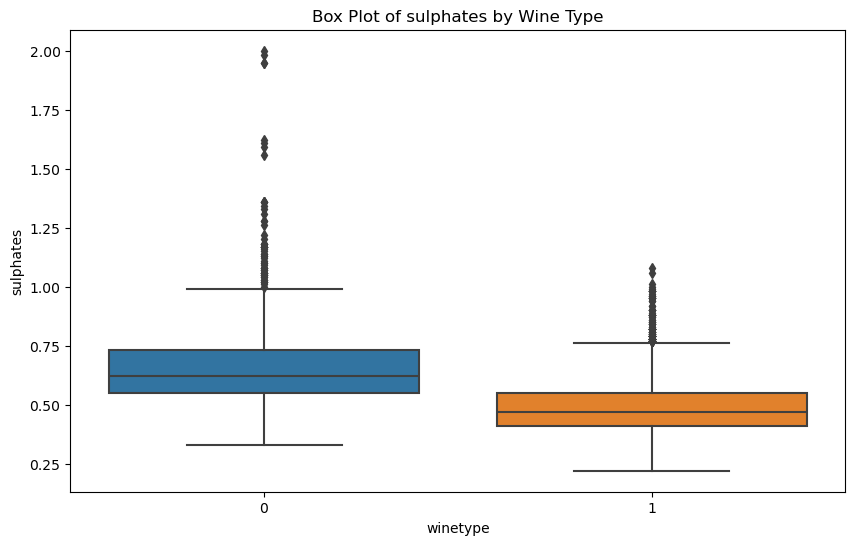

In [471]:
for feature in ['alcohol', 'fixedacidity', 'sulphates']:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='winetype', y=feature, data=data)
    plt.title(f'Box Plot of {feature} by Wine Type')
    plt.show()

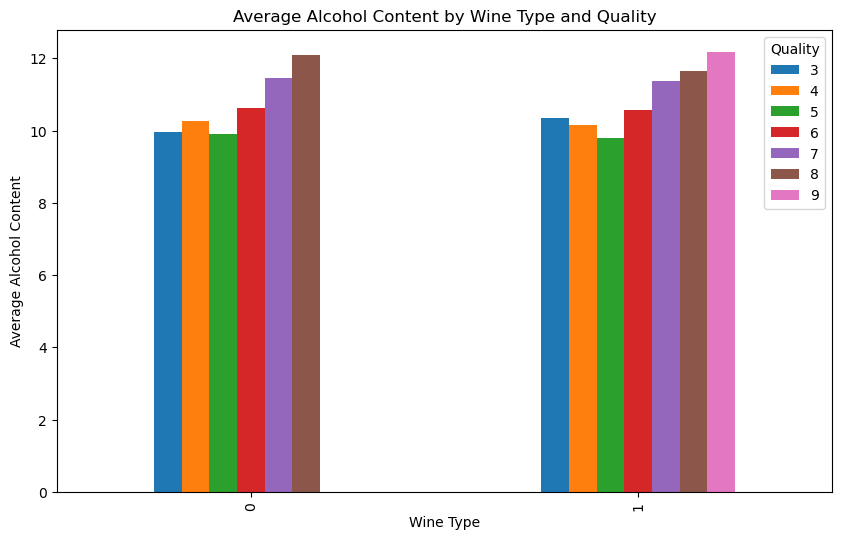

In [473]:
# Group by wine type and quality, then calculate the average alcohol content
avg_alcohol = data.groupby(['winetype', 'quality'])['alcohol'].mean().unstack()

# Create a grouped bar chart
avg_alcohol.plot(kind='bar', figsize=(10, 6))
plt.title('Average Alcohol Content by Wine Type and Quality')
plt.xlabel('Wine Type')
plt.ylabel('Average Alcohol Content')
plt.legend(title='Quality')
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



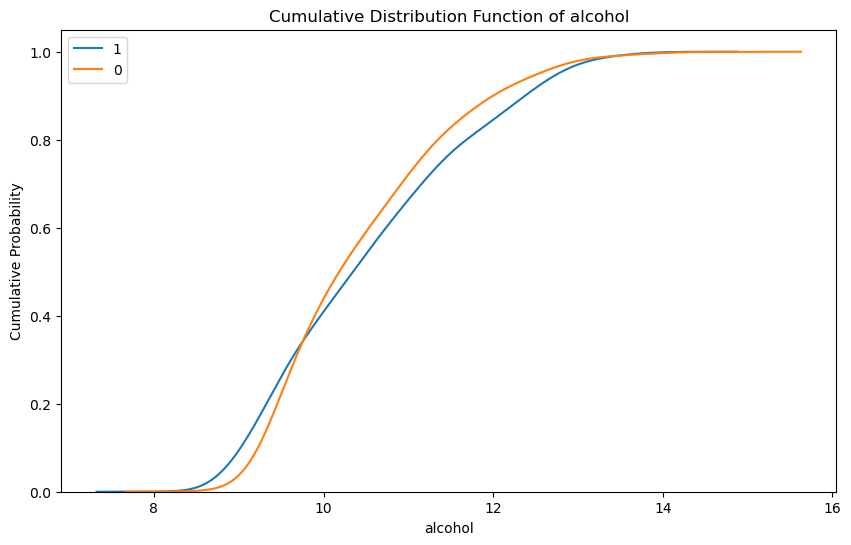

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



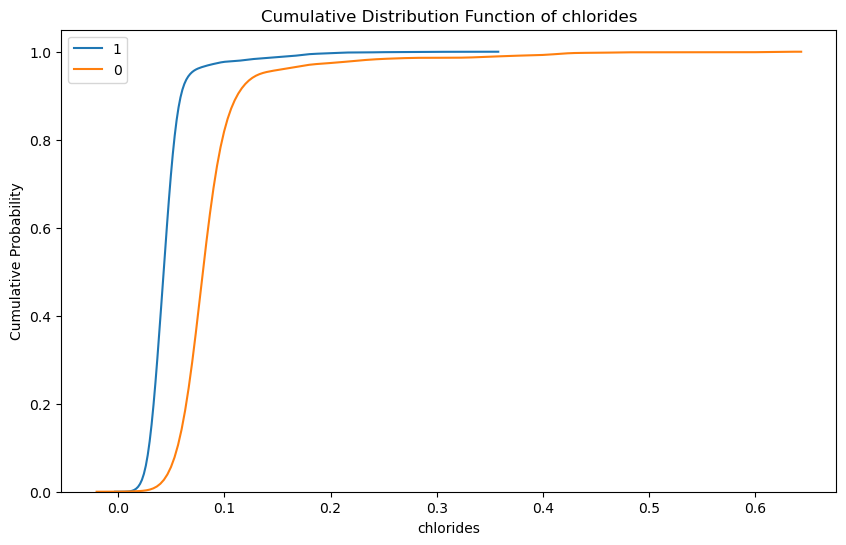

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



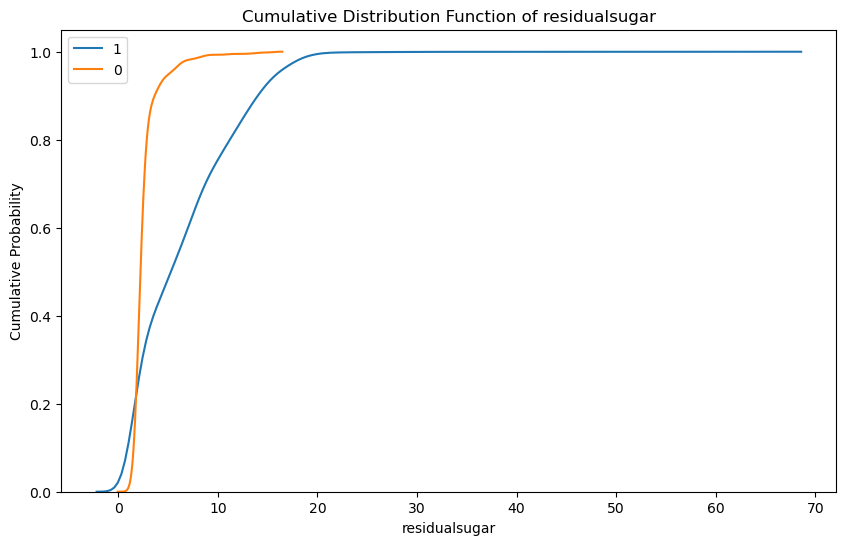

In [475]:
for feature in ['alcohol', 'chlorides', 'residualsugar']:
    plt.figure(figsize=(10, 6))
    for winetype in data['winetype'].unique():
        sns.kdeplot(data[data['winetype'] == winetype][feature], cumulative=True, label=winetype)
    plt.title(f'Cumulative Distribution Function of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.show()

In [477]:
data.dtypes

alcohol               float64
chlorides             float64
citricacid            float64
density               float64
fixedacidity          float64
freesulfurdioxide     float64
ph                    float64
quality                 int64
residualsugar         float64
sulphates             float64
totalsulfurdioxide    float64
volatileacidity       float64
winetype                int32
dtype: object

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

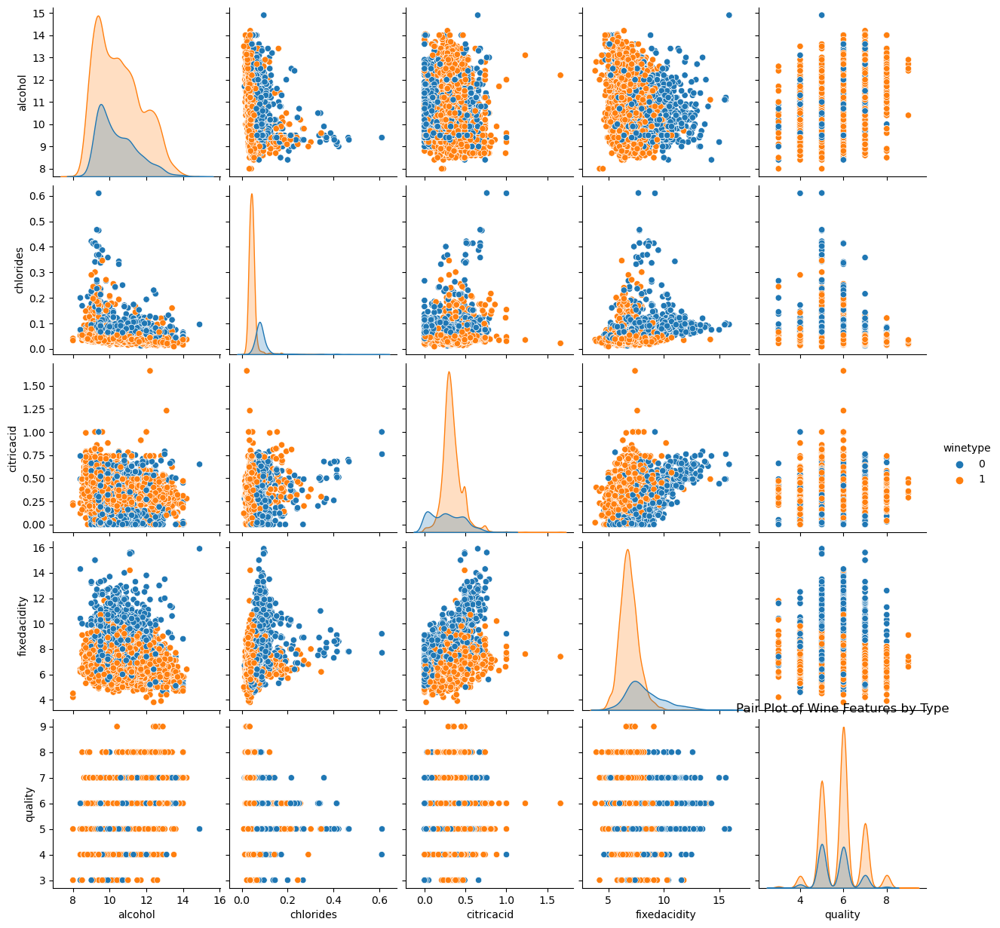

In [479]:
# Pair plot to visualize relationships
sns.pairplot(data, hue='winetype', vars=['alcohol', 'chlorides', 'citricacid', 'fixedacidity', 'quality'])
plt.title('Pair Plot of Wine Features by Type')
plt.show()

In [480]:
data

,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity,winetype
0,12.5,0.043,0.28,0.98918,6.1,24.0,3.14,6,1.7,0.44,98.0,0.26,1
1,8.6,0.041,0.69,0.99770,7.3,58.0,3.06,5,10.2,0.45,160.0,0.31,1
2,9.1,0.058,0.28,0.99520,6.9,14.0,3.29,6,5.0,0.36,146.0,0.19,1
3,9.4,0.060,0.26,0.99690,6.9,55.0,3.21,5,10.9,0.44,193.0,0.56,1
4,9.6,0.055,0.34,0.99450,7.5,50.0,3.29,6,1.3,0.80,153.0,0.14,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,10.7,0.064,0.00,0.99500,6.0,40.0,3.54,6,2.1,0.93,54.0,0.51,0
6493,11.5,0.036,0.49,0.99320,6.9,49.0,3.20,6,6.6,0.27,172.0,0.19,1
6494,10.4,0.054,0.20,0.99200,6.9,5.0,3.10,6,0.9,0.42,126.0,0.46,1
6495,9.5,0.067,0.02,0.99700,6.4,4.0,3.46,5,1.8,0.68,11.0,0.57,0


In [481]:
# Select numerical columns for outlier detection
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Calculate Q1 and Q3 for each numerical column
Q1 = data[numerical_cols].quantile(0.25)
Q3 = data[numerical_cols].quantile(0.75)

# Compute the IQR for each numerical column
IQR = Q3 - Q1

# Define the lower and upper bounds for each numerical column
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers
data_cleaned = data[~((data[numerical_cols] < lower_bound) | (data[numerical_cols] > upper_bound)).any(axis=1)]

# Save the cleaned dataset to a new CSV file
data_cleaned.to_csv('wine_data_cleaned.csv', index=False)


print("Outliers removed. Cleaned dataset saved as 'wine_data_cleaned.csv'.")

Outliers removed. Cleaned dataset saved as 'wine_data_cleaned.csv'.


In [482]:
import pandas as pd
from IPython.display import HTML
import base64

# Save the cleaned dataset to a new CSV file
data_cleaned.to_csv('wine_data_cleaned.csv', index=False)

# Function to create a download link
def create_download_link(df, title="Download CSV file", filename="data.csv"):  
    csv = df.to_csv(index=False)
    b64 = base64.b64encode(csv.encode()).decode()  # some strings <-> bytes conversions necessary here
    href = f'<a href="data:file/csv;base64,{b64}" download="{filename}">{title}</a>'
    return HTML(href)

# Create and display the download link
create_download_link(data_cleaned, filename="wine_data_cleaned.csv")

In [483]:
from IPython.display import FileLink

# Create a link to download the CSV file
display(FileLink('wine_data_cleaned.csv'))

C:\Users\yasmi\wine_data_cleaned.csv

In [484]:
data_cleaned

,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity,winetype
0,12.5,0.043,0.28,0.98918,6.1,24.0,3.14,6,1.7,0.44,98.0,0.26,1
2,9.1,0.058,0.28,0.99520,6.9,14.0,3.29,6,5.0,0.36,146.0,0.19,1
3,9.4,0.060,0.26,0.99690,6.9,55.0,3.21,5,10.9,0.44,193.0,0.56,1
4,9.6,0.055,0.34,0.99450,7.5,50.0,3.29,6,1.3,0.80,153.0,0.14,1
5,12.6,0.029,0.28,0.99060,7.6,7.0,3.00,6,4.2,0.41,112.0,0.38,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6487,8.8,0.039,0.36,0.99946,6.2,37.0,3.23,6,17.2,0.43,130.0,0.23,1
6488,9.9,0.065,0.32,0.99714,7.2,34.0,3.46,5,1.8,0.78,60.0,0.39,0
6489,10.5,0.050,0.37,0.99546,7.5,21.0,3.20,6,6.2,0.55,138.0,0.18,1
6493,11.5,0.036,0.49,0.99320,6.9,49.0,3.20,6,6.6,0.27,172.0,0.19,1


In [485]:
data_cleaned.isnull().sum()

alcohol               0
chlorides             0
citricacid            0
density               0
fixedacidity          0
freesulfurdioxide     0
ph                    0
quality               0
residualsugar         0
sulphates             0
totalsulfurdioxide    0
volatileacidity       0
winetype              0
dtype: int64

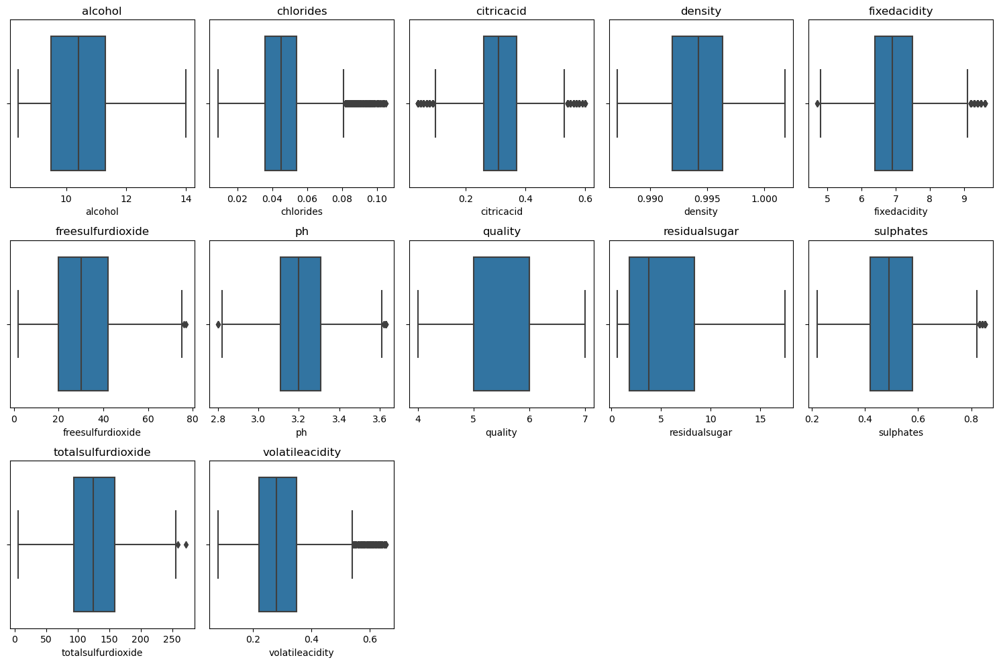

In [486]:
# Box plots to identify outliers
plt.figure(figsize=(15, 10))
for column in data_cleaned.select_dtypes(include=['float64', 'int64']).columns:
    plt.subplot(3, 5, list(data_cleaned.select_dtypes(include=['float64', 'int64']).columns).index(column) + 1)
    sns.boxplot(x=data_cleaned[column])
    plt.title(column)
plt.tight_layout()
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



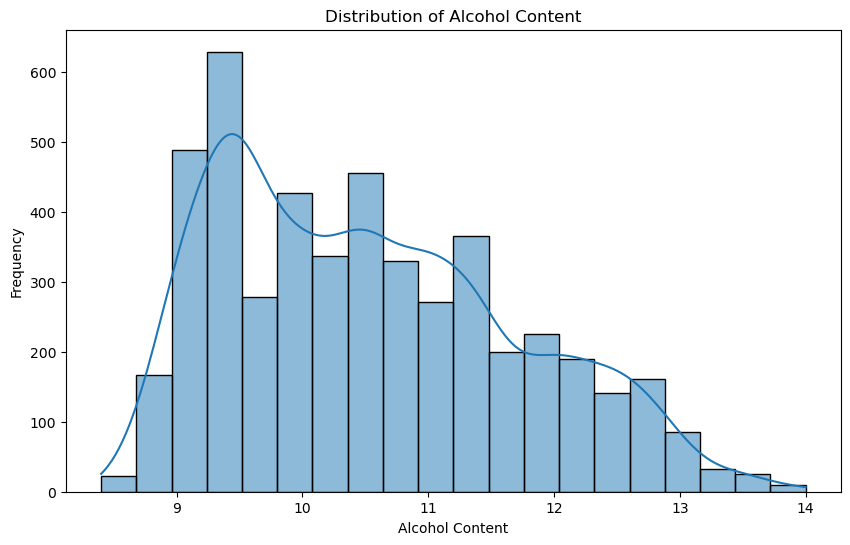

In [487]:
# Histogram of alcohol content
plt.figure(figsize=(10, 6))
sns.histplot(data_cleaned['alcohol'], bins=20, kde=True)
plt.title('Distribution of Alcohol Content')
plt.xlabel('Alcohol Content')
plt.ylabel('Frequency')
plt.show()

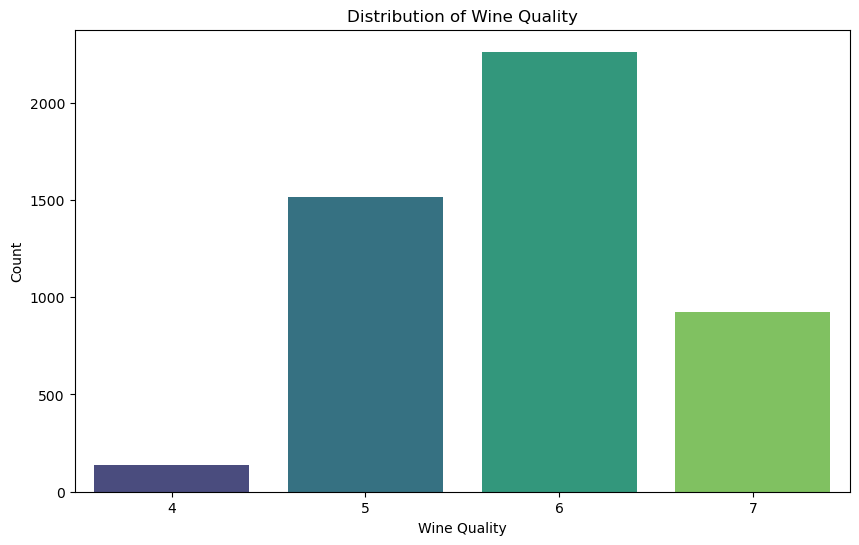

In [488]:
# Count plot of wine quality
plt.figure(figsize=(10, 6))
sns.countplot(x='quality', data=data_cleaned, palette='viridis')
plt.title('Distribution of Wine Quality')
plt.xlabel('Wine Quality')
plt.ylabel('Count')
plt.show()

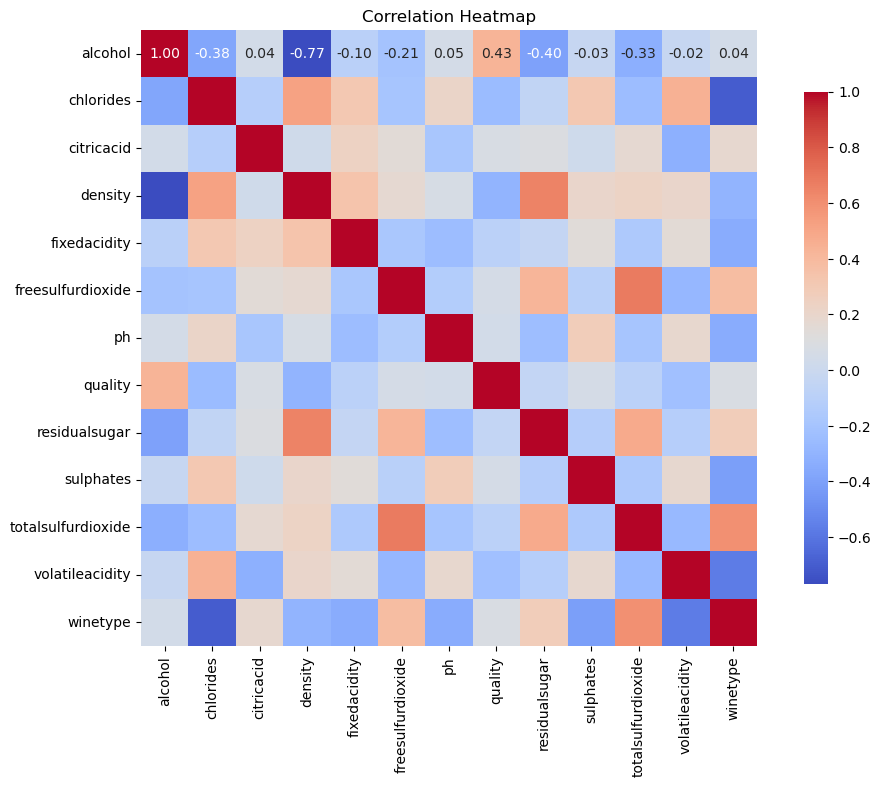

In [489]:
# Correlation matrix
correlation_matrix = data_cleaned.corr()

# Heatmap for correlations
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={'shrink': .8})
plt.title('Correlation Heatmap')
plt.show()

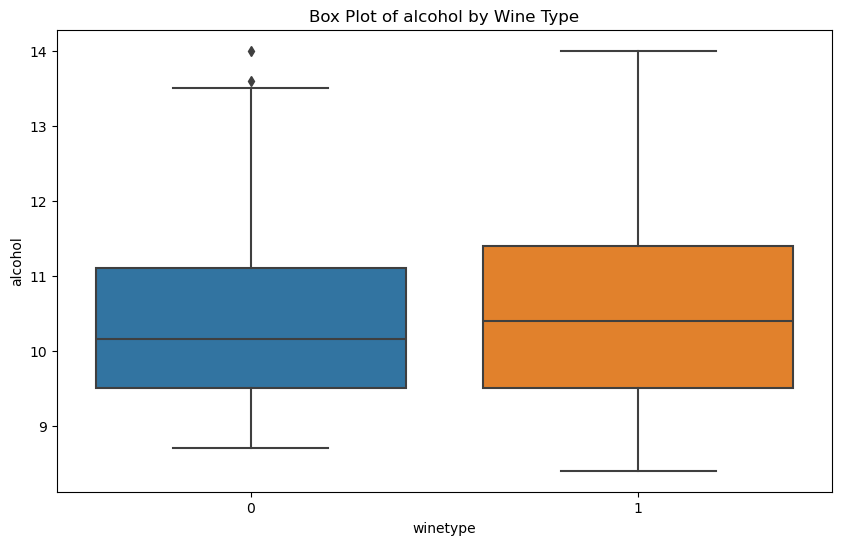

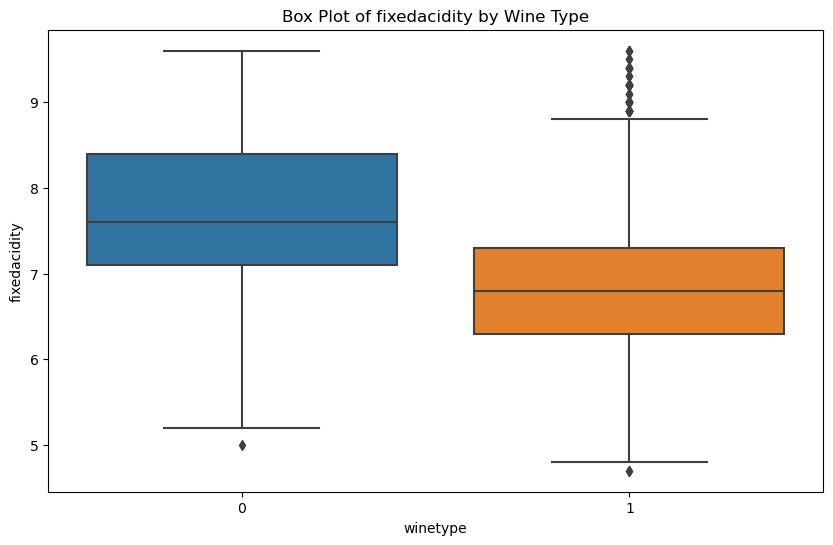

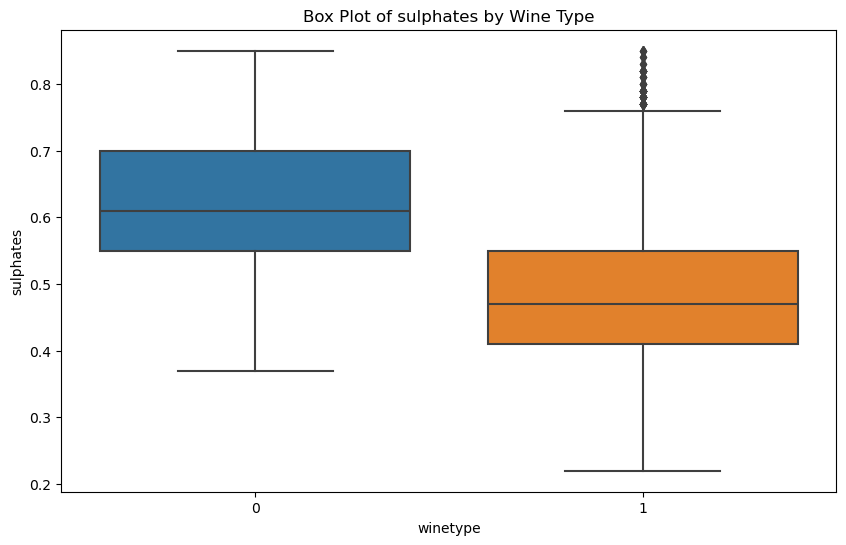

In [490]:
for feature in ['alcohol', 'fixedacidity', 'sulphates']:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='winetype', y=feature, data=data_cleaned)
    plt.title(f'Box Plot of {feature} by Wine Type')
    plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

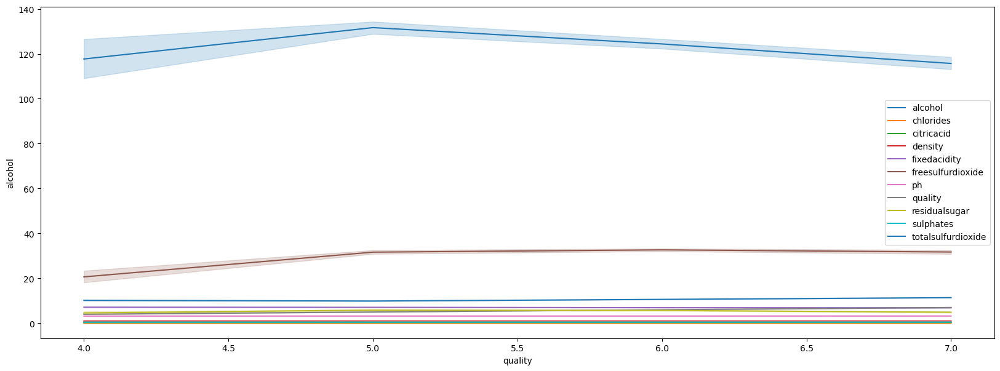

In [491]:
from seaborn import lineplot
plt.figure(figsize=(20,7))
for p in data_cleaned.columns[:11]:
    lineplot(data=data_cleaned,x='quality',y=p,label=p)

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

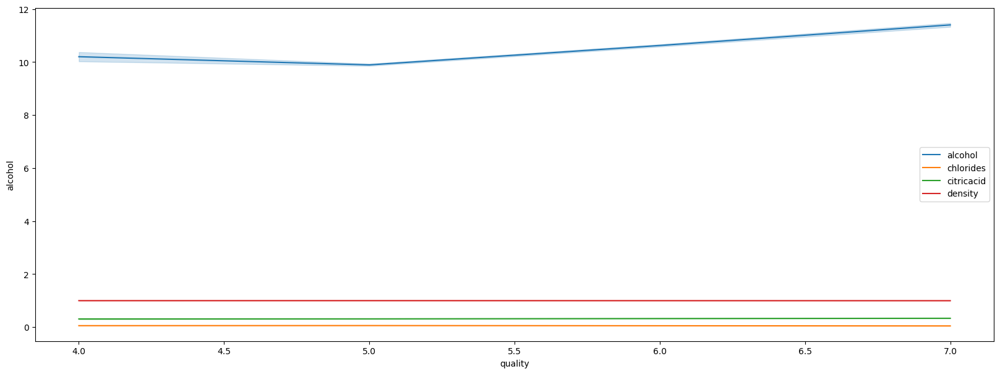

In [500]:
plt.figure(figsize=(20,7))
for p in data_cleaned.columns[:4]:
    lineplot(data=data_cleaned,x='quality',y=p,label=p)

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

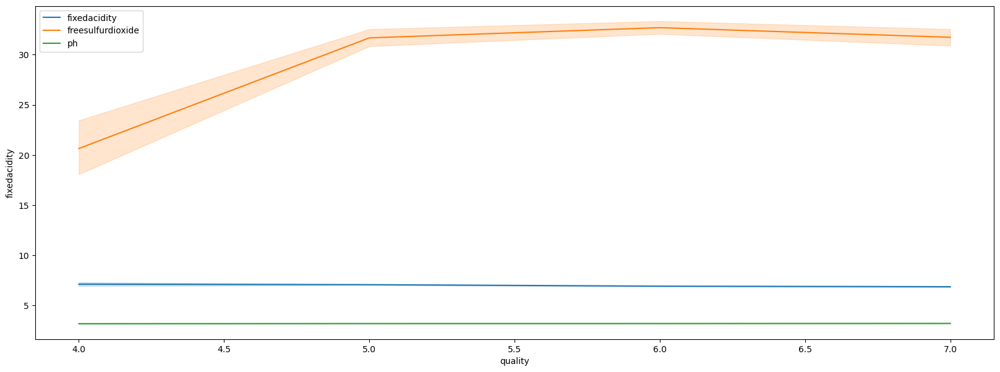

In [502]:
plt.figure(figsize=(20,7))
for p in data_cleaned.columns[4:7]:
    lineplot(data=data_cleaned,x='quality',y=p,label=p)

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

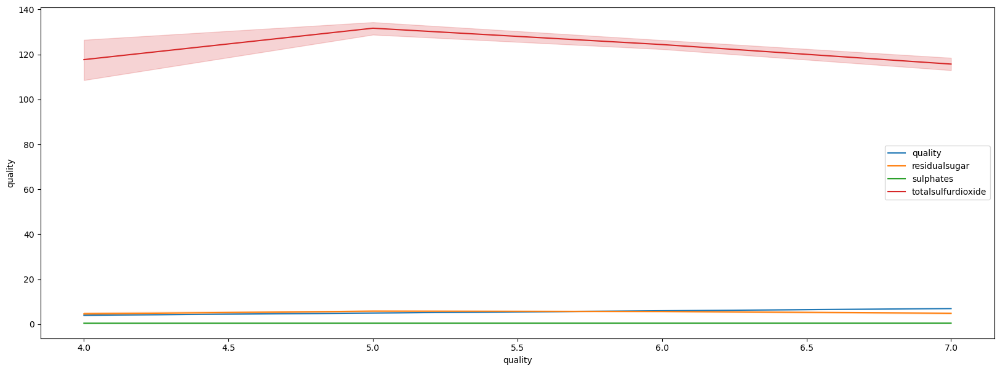

In [504]:
plt.figure(figsize=(20,7))
for p in data_cleaned.columns[7:11]:
    lineplot(data=data_cleaned,x='quality',y=p,label=p)

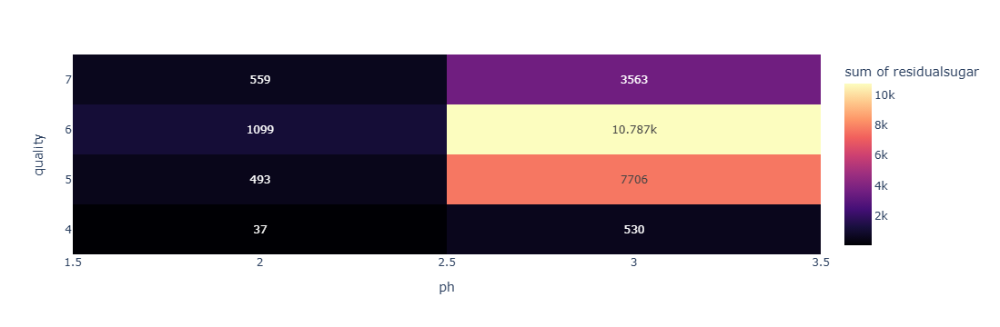

In [635]:
fig = px.density_heatmap(data_cleaned, x = "ph", y = "quality", z = "residualsugar",
                         color_continuous_scale = "magma", text_auto = True)
fig.show()


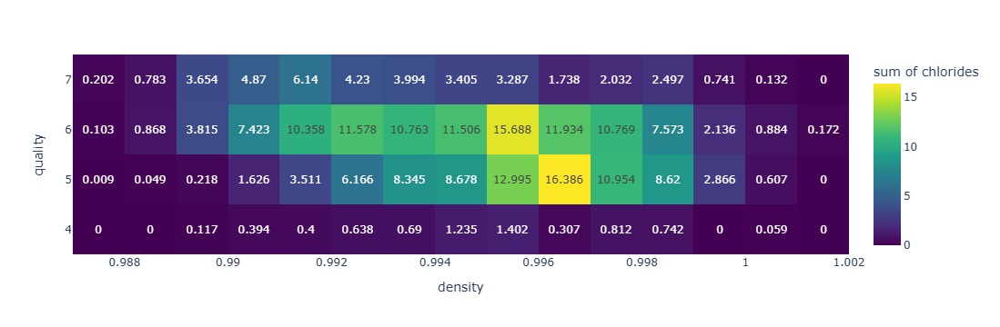

In [508]:
fig = px.density_heatmap(data_cleaned, x = "density", y = "quality", z = "chlorides",
                        color_continuous_scale = "Viridis", text_auto = True)
fig.show()


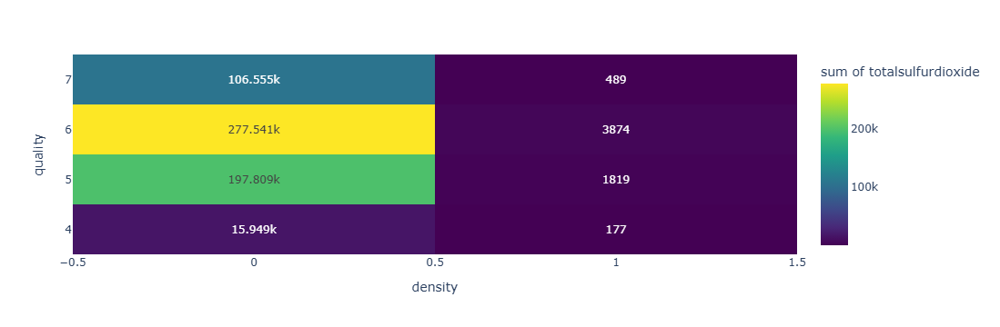

In [621]:
fig = px.density_heatmap(data_cleaned, x = "density", y = "quality", z = "totalsulfurdioxide",
                        color_continuous_scale = "Viridis", text_auto = True)
fig.show()


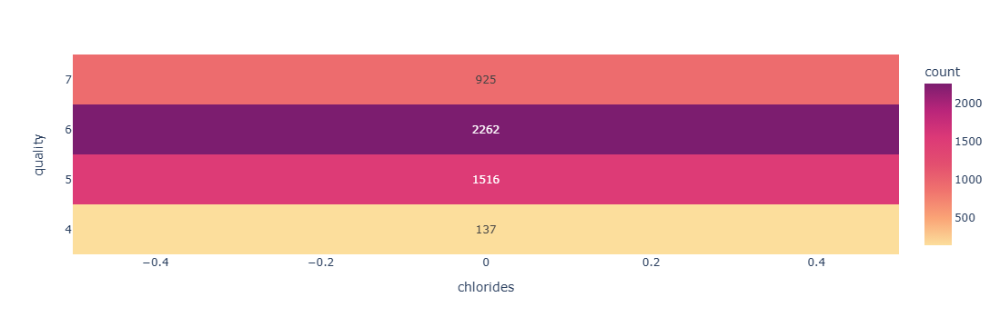

In [625]:
fig = px.density_heatmap(data_cleaned, x = "chlorides", y = "quality", text_auto = True,
                         color_continuous_scale = "sunsetdark")
fig.show()

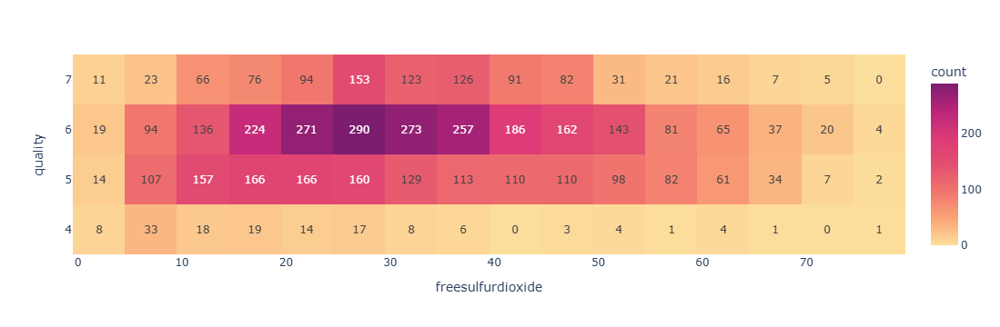

In [623]:
fig = px.density_heatmap(data_cleaned, x = "freesulfurdioxide", y = "quality", text_auto = True,
                         color_continuous_scale = "sunsetdark")
fig.show()

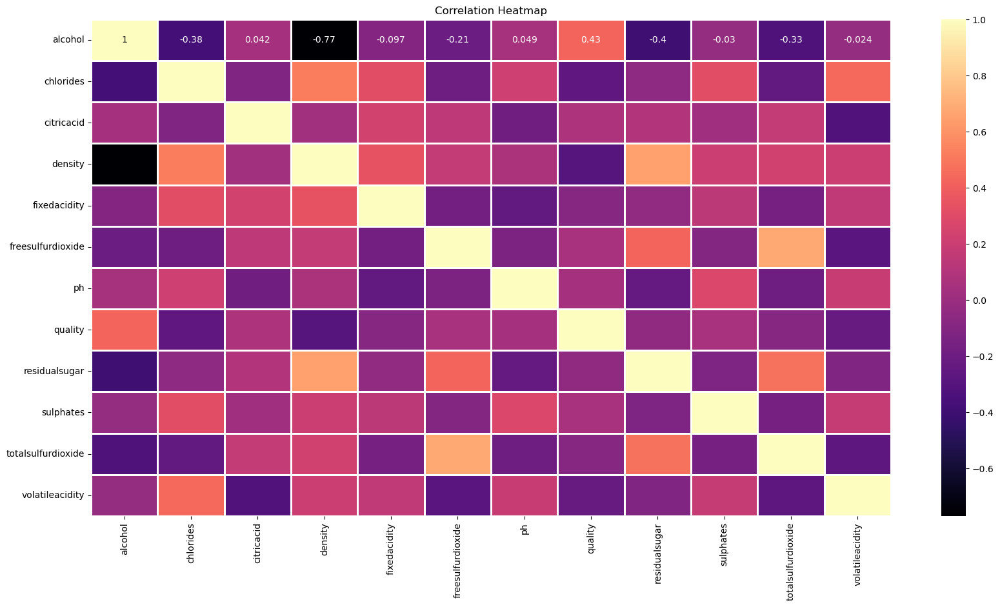

In [512]:
# Select only numeric columns for correlation
numeric_data = data_cleaned.select_dtypes(include=['float64', 'int64'])

# Plot the heatmap for the correlation matrix
plt.figure(figsize=[20, 10], facecolor='white')
sns.heatmap(numeric_data.corr(), annot=True, linewidths=2, cmap="magma")
plt.title('Correlation Heatmap')
plt.show()


IndexError: index 12 is out of bounds for axis 0 with size 12

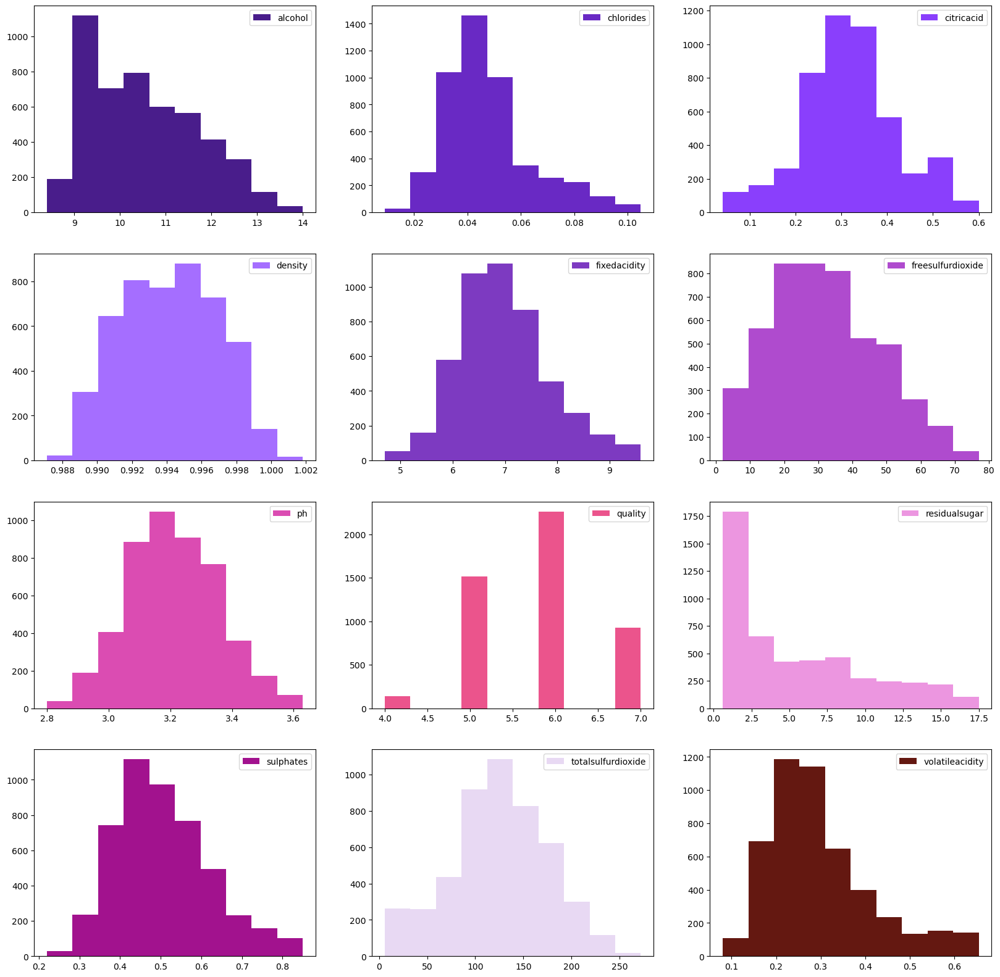

In [514]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (20, 20))

colors = ['#491D8B', '#6929C4', '#8A3FFC', '#A56EFF',
          '#7D3AC1', '#AF4BCE', '#DB4CB2', '#EB548C',
          '#EC96E0', '#A2128E', '#E8D9F3', '#641811']

for index, column in enumerate(data_cleaned.columns):
    ax = axes.flatten()[index]
    ax.hist(data_cleaned[column], color = colors[index], label = column)
    ax.legend(loc = "best")
plt.suptitle("Histograms", size = 18)

plt.show()

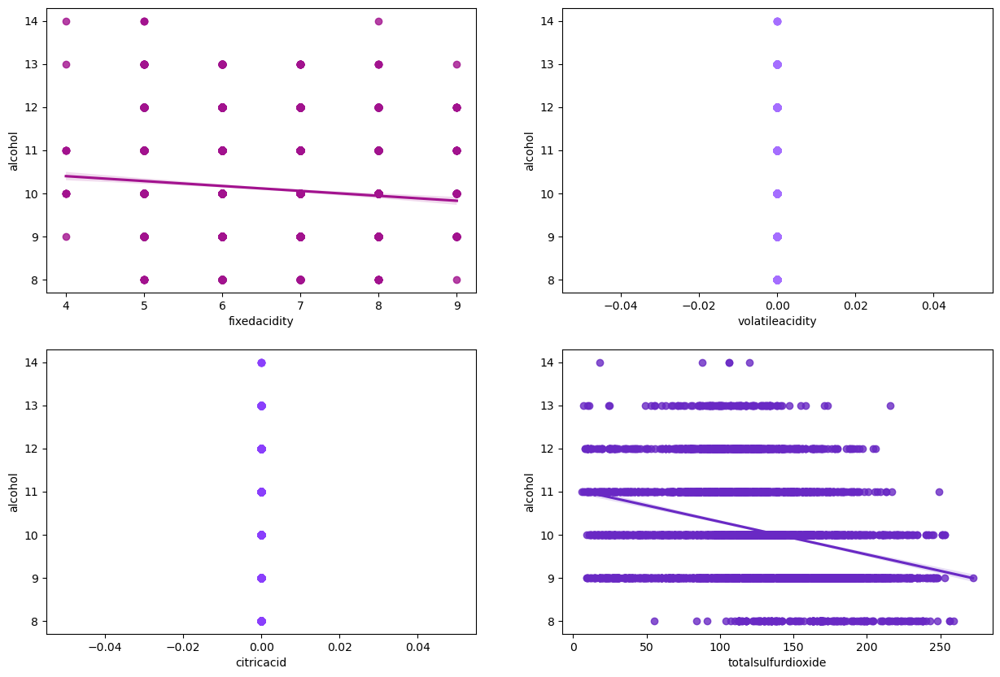

In [619]:
fig, axes = plt.subplots(2, 2, figsize = (15, 10))
axes = axes.flatten()

sns.regplot(ax = axes[0], x = "fixedacidity", y = "alcohol", data = data_cleaned, color = "#A2128E");
sns.regplot(ax = axes[1], x = "volatileacidity", y = "alcohol", data = data_cleaned, color = "#A56EFF");
sns.regplot(ax = axes[2], x = "citricacid", y = "alcohol", data = data_cleaned, color = "#8A3FFC");
sns.regplot(ax = axes[3], x = "totalsulfurdioxide", y = "alcohol", data = data_cleaned, color = "#6929C4");

In [516]:
data_cleaned.dtypes

alcohol               float64
chlorides             float64
citricacid            float64
density               float64
fixedacidity          float64
freesulfurdioxide     float64
ph                    float64
quality                 int64
residualsugar         float64
sulphates             float64
totalsulfurdioxide    float64
volatileacidity       float64
winetype                int32
dtype: object

In [520]:
data_cleaned=data_cleaned.astype('int') # after one hot encoding we change the columns which are encodefor model 

In [522]:
data_cleaned

,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity,winetype
0,12,0,0,0,6,24,3,6,1,0,98,0,1
2,9,0,0,0,6,14,3,6,5,0,146,0,1
3,9,0,0,0,6,55,3,5,10,0,193,0,1
4,9,0,0,0,7,50,3,6,1,0,153,0,1
5,12,0,0,0,7,7,3,6,4,0,112,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6487,8,0,0,0,6,37,3,6,17,0,130,0,1
6488,9,0,0,0,7,34,3,5,1,0,60,0,0
6489,10,0,0,0,7,21,3,6,6,0,138,0,1
6493,11,0,0,0,6,49,3,6,6,0,172,0,1


In [524]:
data_cleaned.dtypes

alcohol               int32
chlorides             int32
citricacid            int32
density               int32
fixedacidity          int32
freesulfurdioxide     int32
ph                    int32
quality               int32
residualsugar         int32
sulphates             int32
totalsulfurdioxide    int32
volatileacidity       int32
winetype              int32
dtype: object

In [526]:
#Train-test split

In [546]:
x = data_cleaned.drop('winetype', axis=1)  # Features
y = data_cleaned['winetype']  # Target variable

In [548]:
x

,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity
0,12,0,0,0,6,24,3,6,1,0,98,0
2,9,0,0,0,6,14,3,6,5,0,146,0
3,9,0,0,0,6,55,3,5,10,0,193,0
4,9,0,0,0,7,50,3,6,1,0,153,0
5,12,0,0,0,7,7,3,6,4,0,112,0
...,...,...,...,...,...,...,...,...,...,...,...,...
6487,8,0,0,0,6,37,3,6,17,0,130,0
6488,9,0,0,0,7,34,3,5,1,0,60,0
6489,10,0,0,0,7,21,3,6,6,0,138,0
6493,11,0,0,0,6,49,3,6,6,0,172,0


In [550]:
y

0       1
2       1
3       1
4       1
5       1
       ..
6487    1
6488    0
6489    1
6493    1
6494    1
Name: winetype, Length: 4840, dtype: int32

In [552]:
## Standardization / scaling numerical features

In [554]:
sc = StandardScaler()
x = sc.fit_transform(x)

In [556]:
# Train - Test split ( 80 - 20 %)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [558]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((3872, 12), (968, 12), (3872,), (968,))

In [560]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [562]:
models = []  #  Empty list to store the models

models.append(('Logistic Regression', LogisticRegression(random_state = 42)))
models.append(('CART', DecisionTreeClassifier(random_state = 42)))
models.append(('Random Forest', RandomForestClassifier(random_state = 42)))
models.append(('SVM', SVC(gamma = 'auto', random_state = 42)))
models.append(('Naive Bayes', GaussianNB()))  # GaussianNB doesn't have random_state parameter
models.append(('K Neighbors', KNeighborsClassifier()))  # K Neighbors doesn't have random_state parameter
models.append(('XG Boost', XGBClassifier(random_state = 42)))
models.append(('Gradient Boost', GradientBoostingClassifier(random_state = 42)))

results = []  # Stores evaluation metrics
name = []  # Stores names of the models

In [566]:
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, recall_score, f1_score, classification_report

In [568]:
# Fit all the models and calculate the accuracy score  in a for loop
# Predicting the accuracy score before actually building the model. 
# Early predictions will help us to decide the best model to choose

for name, model in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)  # prediction done using the X test data
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy_{} : {}".format(name, accuracy))

Accuracy_Logistic Regression : 0.9607438016528925
Accuracy_CART : 0.9669421487603306
Accuracy_Random Forest : 0.9741735537190083
Accuracy_SVM : 0.9607438016528925
Accuracy_Naive Bayes : 0.5402892561983471
Accuracy_K Neighbors : 0.9586776859504132
Accuracy_XG Boost : 0.9731404958677686
Accuracy_Gradient Boost : 0.96900826446281


In [570]:
for name, model in models:
    model.fit(x_train, y_train)
    
    # Train accuracy
    train_pred = model.predict(x_train)
    train_accuracy = accuracy_score(y_train, train_pred)
    print("Train Accuracy_{} : {}".format(name, train_accuracy))

Train Accuracy_Logistic Regression : 0.9553202479338843
Train Accuracy_CART : 0.9994834710743802
Train Accuracy_Random Forest : 0.9994834710743802
Train Accuracy_SVM : 0.9635847107438017
Train Accuracy_Naive Bayes : 0.5511363636363636
Train Accuracy_K Neighbors : 0.9736570247933884
Train Accuracy_XG Boost : 0.9984504132231405
Train Accuracy_Gradient Boost : 0.9798553719008265


In [572]:
for name, model in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    precision = precision_score(y_test, y_pred, average='macro')
    print("Precision_{} : {}".format(name, precision))

Precision_Logistic Regression : 0.9397469082542421
Precision_CART : 0.9321644942170002
Precision_Random Forest : 0.9604486422668241
Precision_SVM : 0.9428821762349799
Precision_Naive Bayes : 0.6091813822583563
Precision_K Neighbors : 0.918881725295027
Precision_XG Boost : 0.9565748168817579
Precision_Gradient Boost : 0.956329933624737


In [574]:
for name, model in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    recall = recall_score(y_test, y_pred, average='macro')
    print("Recall_{} : {}".format(name, recall))

Recall_Logistic Regression : 0.8879585326953747
Recall_CART : 0.9266347687400319
Recall_Random Forest : 0.9276315789473684
Recall_SVM : 0.884768740031898
Recall_Naive Bayes : 0.7242822966507177
Recall_K Neighbors : 0.9027113237639554
Recall_XG Boost : 0.9270334928229664
Recall_Gradient Boost : 0.9086921850079746


In [576]:
for name, model in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    f1 = f1_score(y_test, y_pred, average='macro')
    print("F1_{} : {}".format(name, f1))

F1_Logistic Regression : 0.9115216240919806
F1_CART : 0.9293733526681077
F1_Random Forest : 0.9431656720659278
F1_SVM : 0.9109018331201797
F1_Naive Bayes : 0.5030451119579049
F1_K Neighbors : 0.9105616690227385
F1_XG Boost : 0.9410900034641924
F1_Gradient Boost : 0.9306298731080875


In [578]:
for name, model in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    confusion = confusion_matrix(y_pred, y_test)
    print("Conf_Matrix_{} : ".format(name))
    print("{}".format(confusion))
    print("    ")

Conf_Matrix_Logistic Regression : 
[[104  10]
 [ 28 826]]
    
Conf_Matrix_CART : 
[[115  15]
 [ 17 821]]
    
Conf_Matrix_Random Forest : 
[[114   7]
 [ 18 829]]
    
Conf_Matrix_SVM : 
[[103   9]
 [ 29 827]]
    
Conf_Matrix_Naive Bayes : 
[[129 442]
 [  3 394]]
    
Conf_Matrix_K Neighbors : 
[[109  17]
 [ 23 819]]
    
Conf_Matrix_XG Boost : 
[[114   8]
 [ 18 828]]
    
Conf_Matrix_Gradient Boost : 
[[109   7]
 [ 23 829]]
    


In [601]:
import pandas as pd

# Re-create feature names if `x` is a NumPy array
feature_names = data_cleaned.drop('winetype', axis=1).columns

In [603]:
features = feature_names 

In [605]:
x = data_cleaned.drop('winetype', axis=1)

In [607]:
# Train the Random Forest model
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(x, y)

RandomForestClassifier(random_state=42)

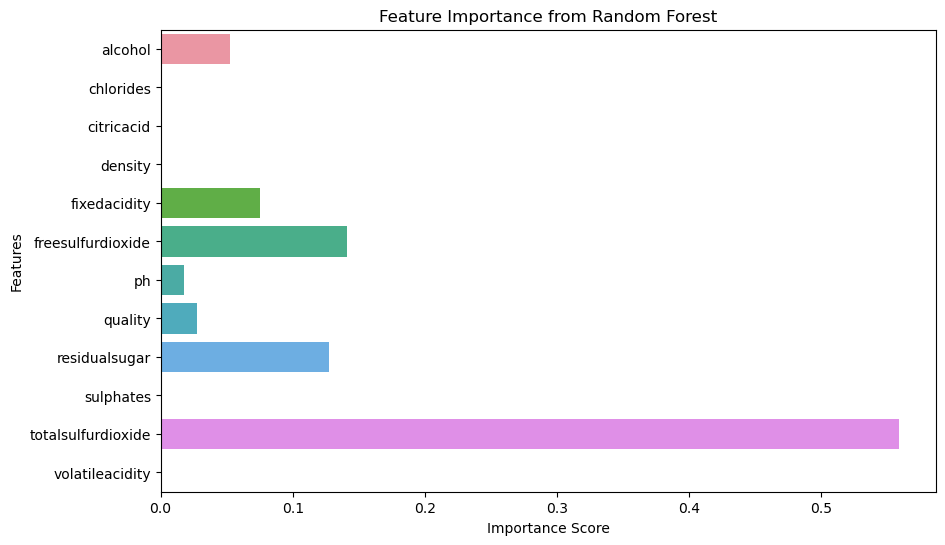

In [611]:
from sklearn.ensemble import RandomForestClassifier

# Train a Random Forest model for feature importance
model = RandomForestClassifier(n_estimators=100, random_state=42)
x = data_cleaned.drop('winetype', axis=1)
y = data_cleaned['winetype']
model.fit(x, y)

# Feature importance
importances = model.feature_importances_
features = x.columns

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=features)
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

In [763]:
data1 = pd.read_excel(r'C:\Users\yasmi\OneDrive\Documents\Data science courses\wine_data_cleaned_categorized.xlsx')

In [764]:
data1

,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,id,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity,winetype,Category
0,12.5,0.043,0.28,0.98918,6.1,24.0,458,3.14,6,1.7,0.44,98.0,0.26,1,Profitable
1,9.1,0.058,0.28,0.99520,6.9,14.0,4374,3.29,6,5.0,0.36,146.0,0.19,1,Profitable
2,9.4,0.060,0.26,0.99690,6.9,55.0,4927,3.21,5,10.9,0.44,193.0,0.56,1,Non_Profitable
3,9.6,0.055,0.34,0.99450,7.5,50.0,2195,3.29,6,1.3,0.80,153.0,0.14,1,Profitable
4,12.6,0.029,0.28,0.99060,7.6,7.0,5198,3.00,6,4.2,0.41,112.0,0.38,1,Profitable
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,8.8,0.039,0.36,0.99946,6.2,37.0,1484,3.23,6,17.2,0.43,130.0,0.23,1,Profitable
4836,9.9,0.065,0.32,0.99714,7.2,34.0,3505,3.46,5,1.8,0.78,60.0,0.39,0,Non_Profitable
4837,10.5,0.050,0.37,0.99546,7.5,21.0,3688,3.20,6,6.2,0.55,138.0,0.18,1,Profitable
4838,11.5,0.036,0.49,0.99320,6.9,49.0,2355,3.20,6,6.6,0.27,172.0,0.19,1,Profitable


In [767]:
data1.isnull().sum()

alcohol               0
chlorides             0
citricacid            0
density               0
fixedacidity          0
freesulfurdioxide     0
id                    0
ph                    0
quality               0
residualsugar         0
sulphates             0
totalsulfurdioxide    0
volatileacidity       0
winetype              0
Category              0
dtype: int64

In [769]:
# Check for duplicates
data1.duplicated().sum()

0

In [771]:
categorical_cols = [] #Initializes an empty list to store the names of columns that are identified as categorical.
for column in data1.columns: #Iterates through each column in the DataFrame.
    #if data[column].dtype==object and 
    if len(data1[column].unique()) <= 15:#Checks if the column's data type is 'object' (typically indicating a categorical variable) and if the number of unique values in that column is 30 or less.
        categorical_cols.append(column) # If the conditions in the if statement are met, it appends the column name to the categorical_clist.
        print(f"{column} : {data1[column].unique()}") #Prints the name of the column and its unique values.
        print("====================================") # Prints a separator line for clarity.

quality : [6 5 7 4]
winetype : [1 0]
Category : ['Profitable' 'Non_Profitable']


In [773]:
categorical_cols

['quality', 'winetype', 'Category']

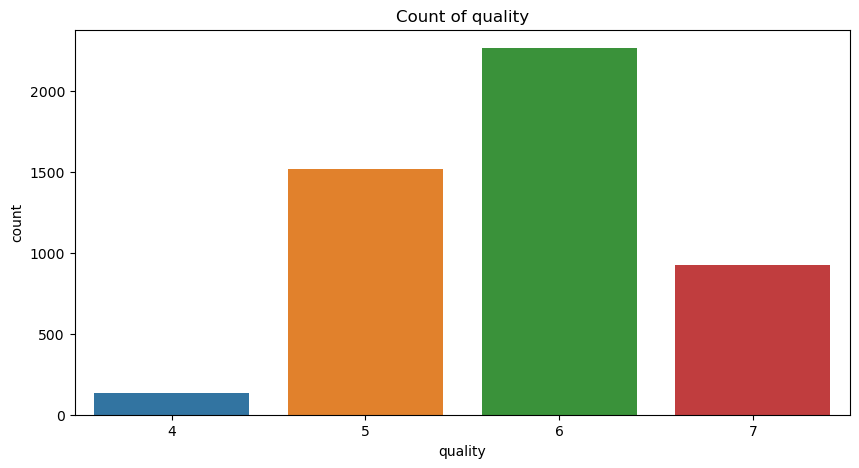

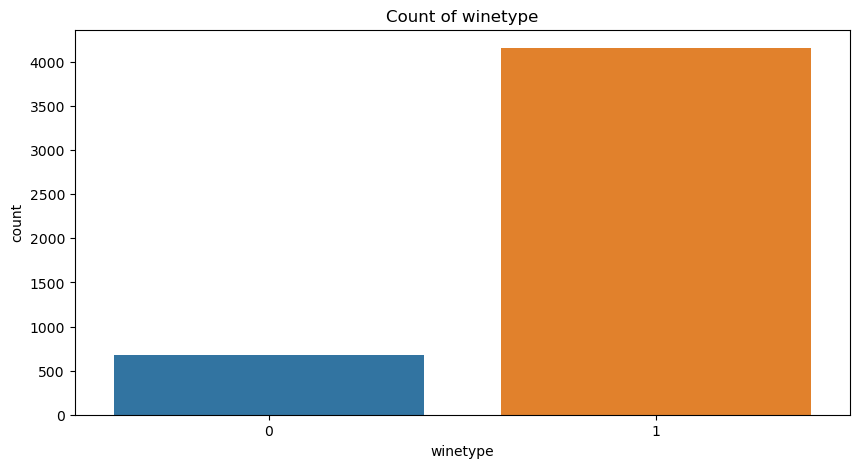

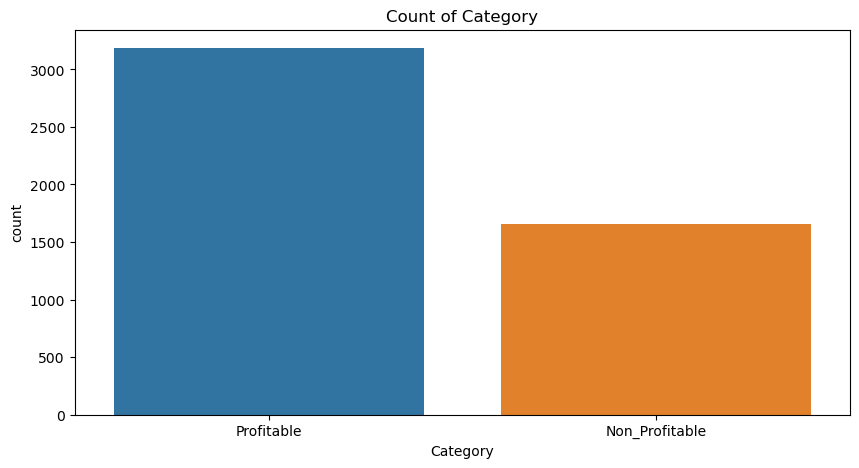

In [775]:
# Count plots
categorical_cols = ['quality', 'winetype', 'Category']
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(x=col, data=data1)
    plt.title(f'Count of {col}')
    plt.show()

In [777]:
# Continuous column
continuous_columns = []
for column in data1.columns:
    if len(data1[column].unique()) > 15:
        continuous_columns.append(column)
        print(f"{column} : {data[column].describe()}")
        print(f"{column} : {data[column].unique()}")
        print("====================================")

alcohol : count    4840.000000
mean       10.531425
std         1.173864
min         8.400000
25%         9.500000
50%        10.400000
75%        11.300000
max        14.000000
Name: alcohol, dtype: float64
alcohol : [12.5         9.1         9.4         9.6        12.6         9.7
 12.8         9.9        10.8         9.2        13.          9.8
 11.5        12.2        11.2         8.7         9.5         9.
 11.9        11.         11.7        11.3         8.8        10.1
 12.7        10.6        10.         11.8        12.9        12.3
 12.1        10.2        10.7        11.4        10.9        10.5
 10.3        12.         12.4         8.6        13.5         9.3
 11.1        10.4        13.1        11.05        8.9        13.4
 11.45       11.6        11.75       13.7        13.2        11.95
 10.65        8.4        12.75       10.46666667 10.96666667 11.73333333
 10.15       10.55       11.35       11.36666667  9.53333333  9.05
 10.93333333 13.55       10.13333333 10.03333333

In [779]:
continuous_columns

['alcohol',
 'chlorides',
 'citricacid',
 'density',
 'fixedacidity',
 'freesulfurdioxide',
 'id',
 'ph',
 'residualsugar',
 'sulphates',
 'totalsulfurdioxide',
 'volatileacidity']

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



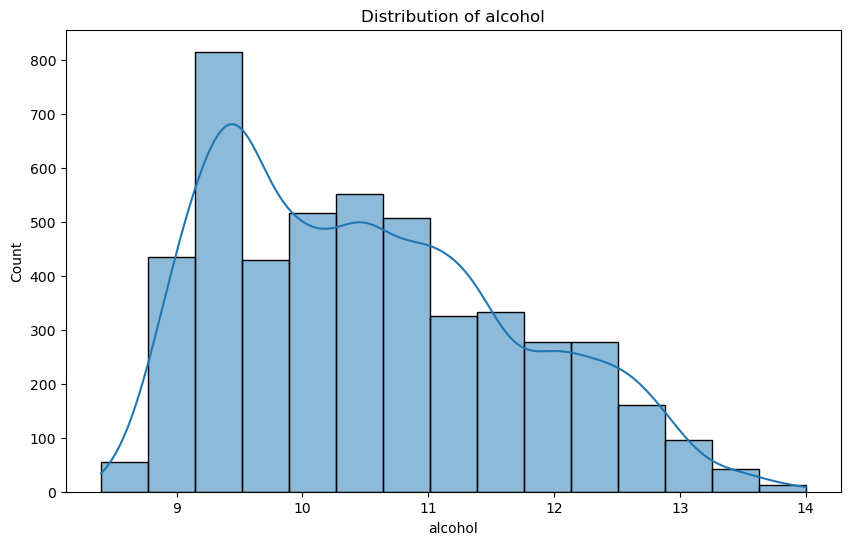

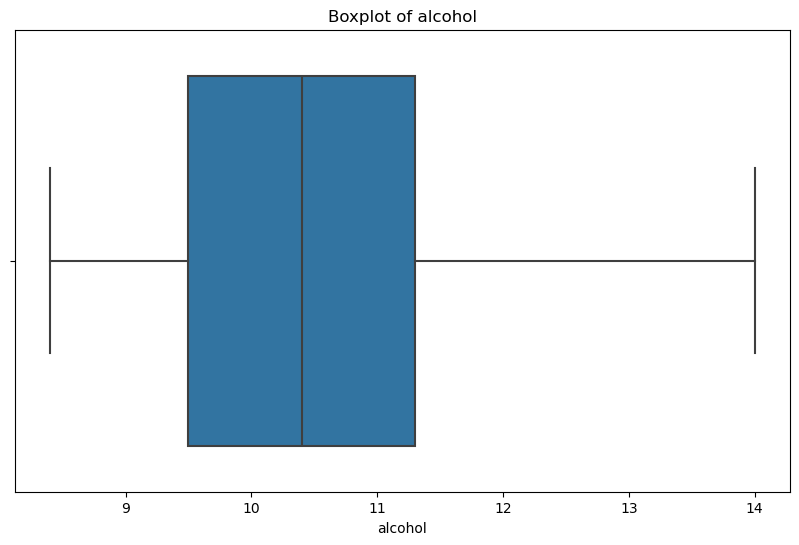

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



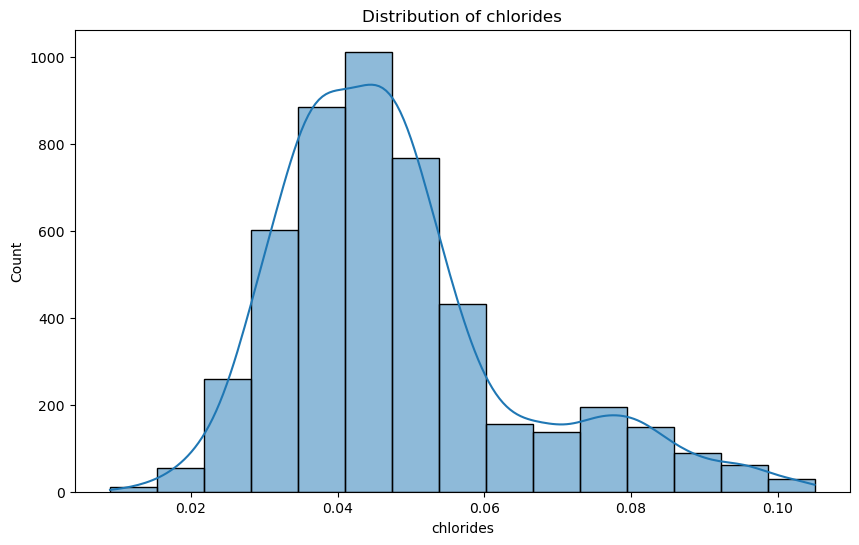

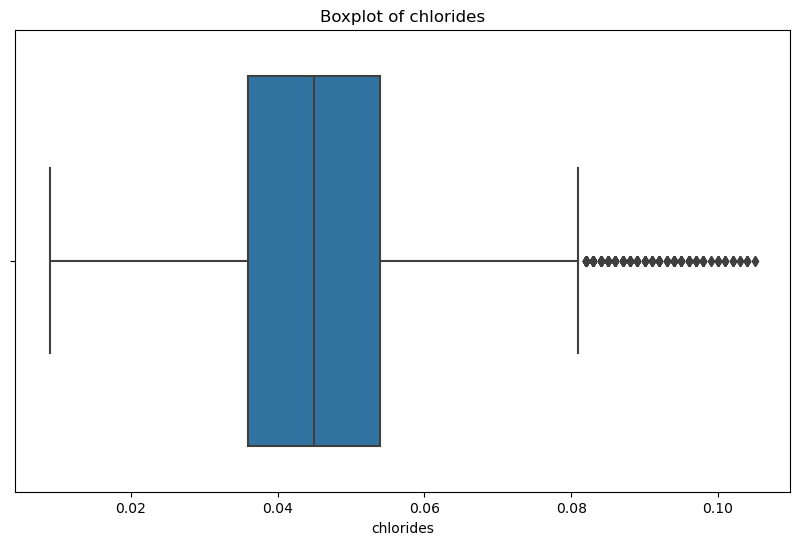

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



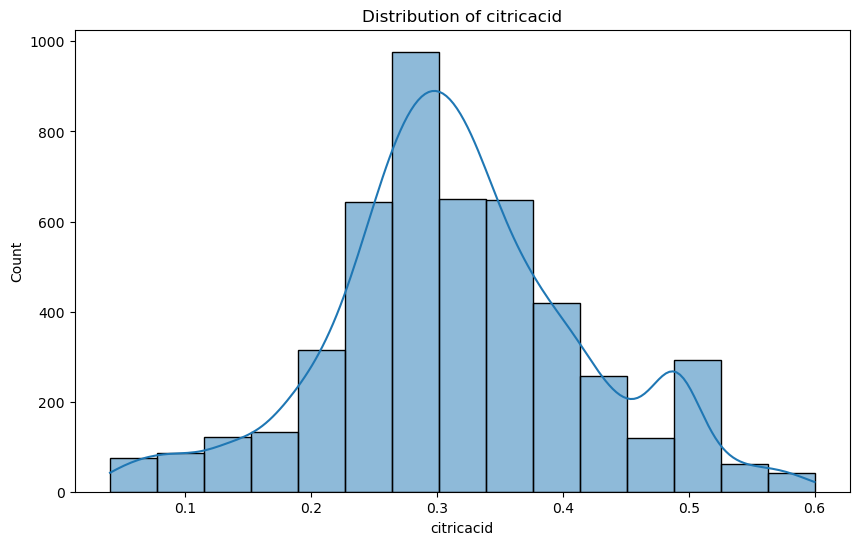

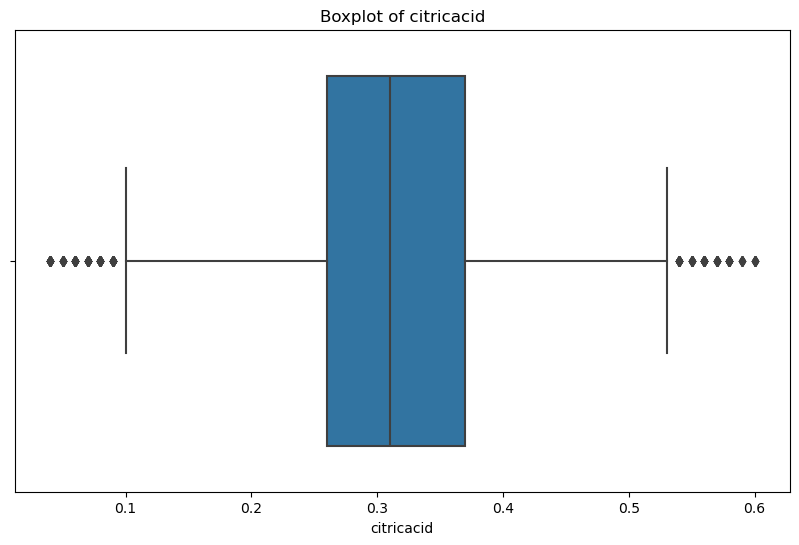

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



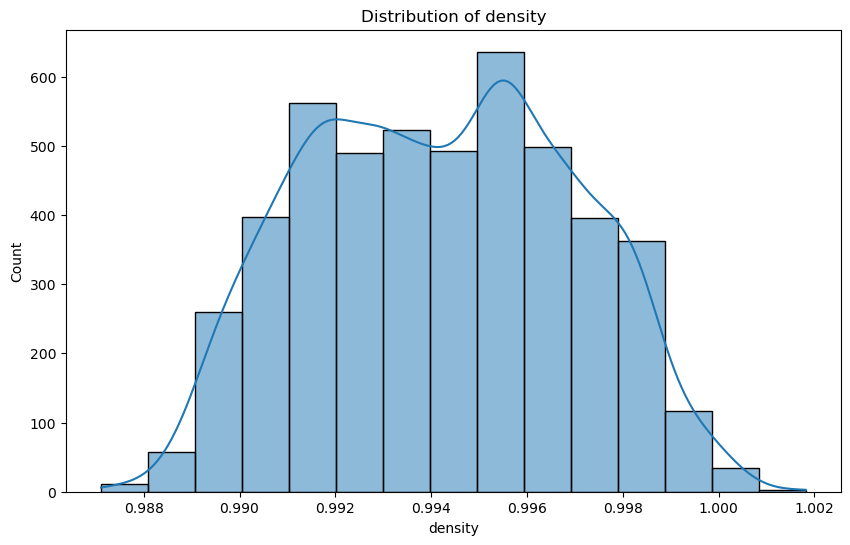

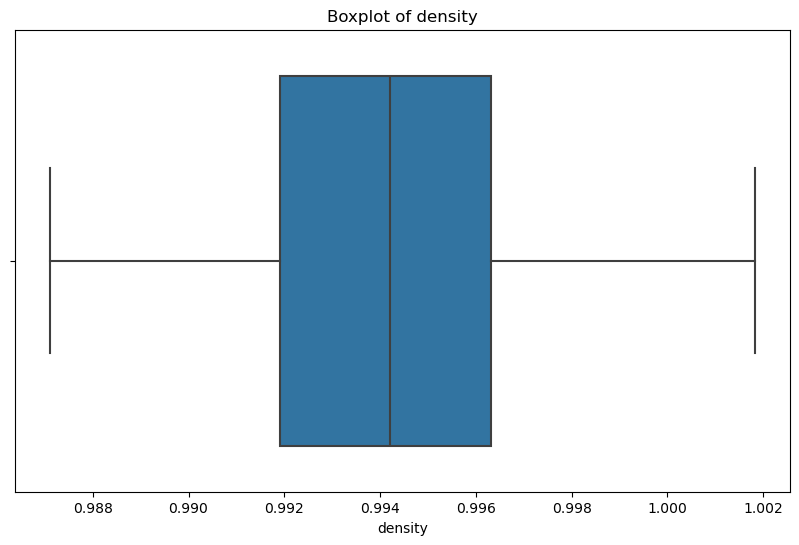

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



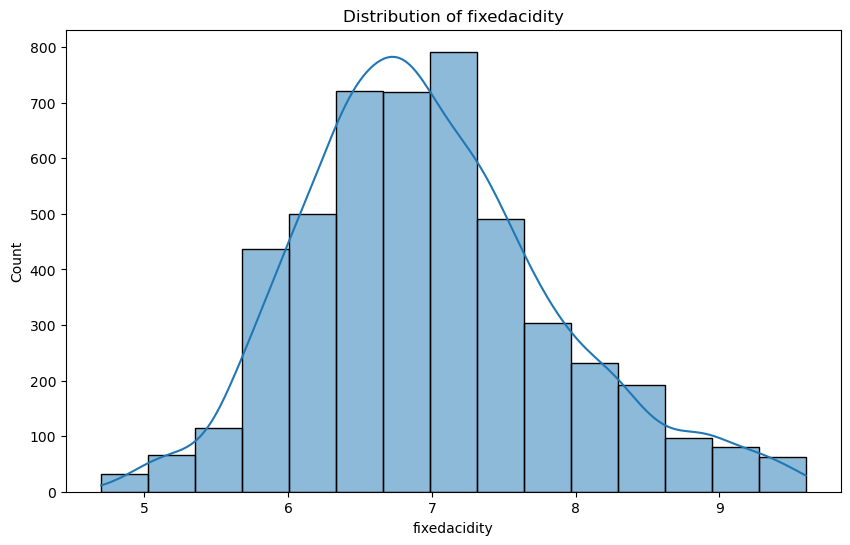

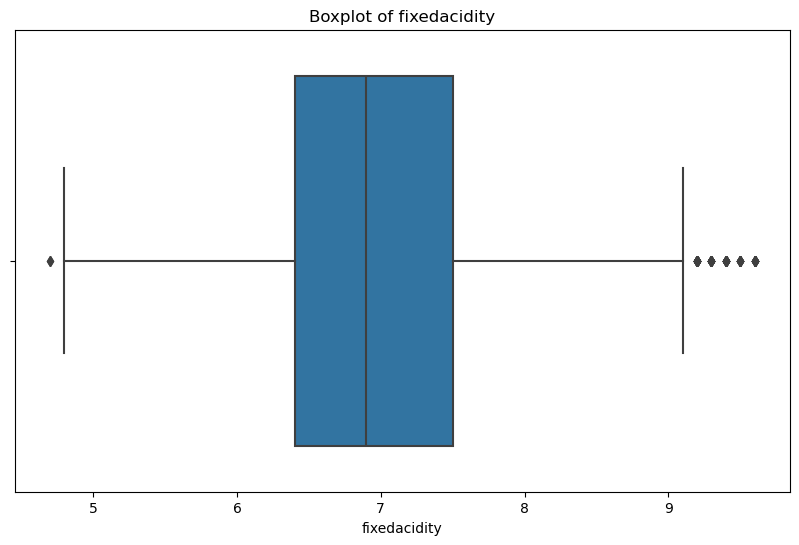

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



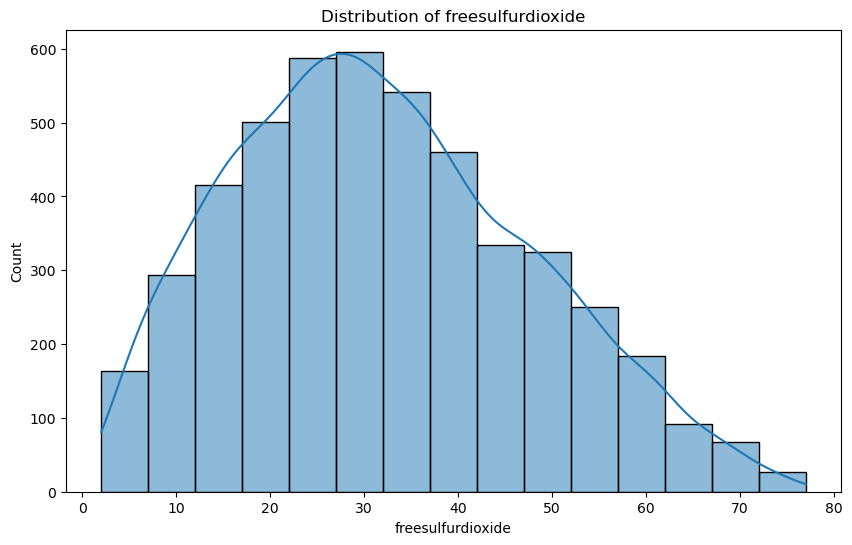

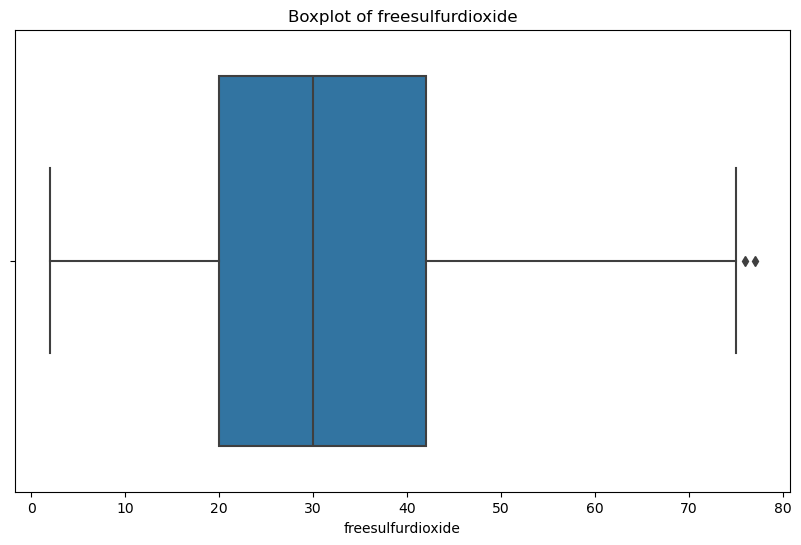

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



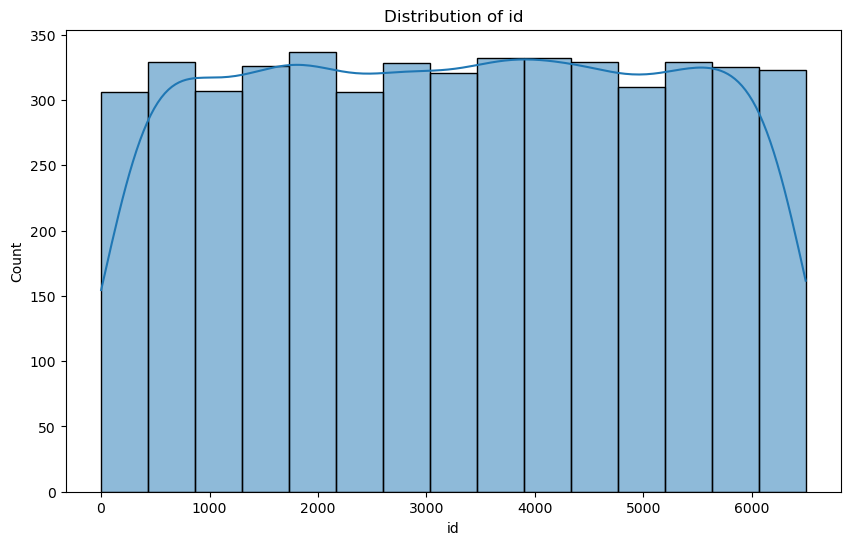

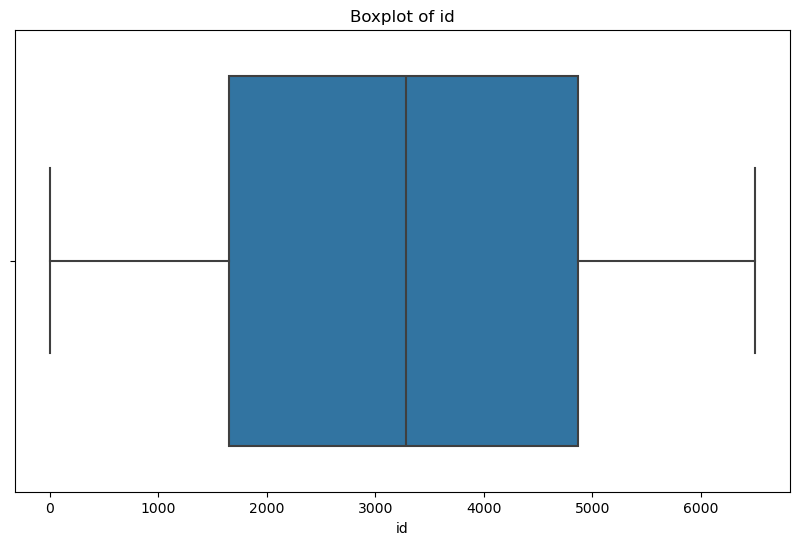

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



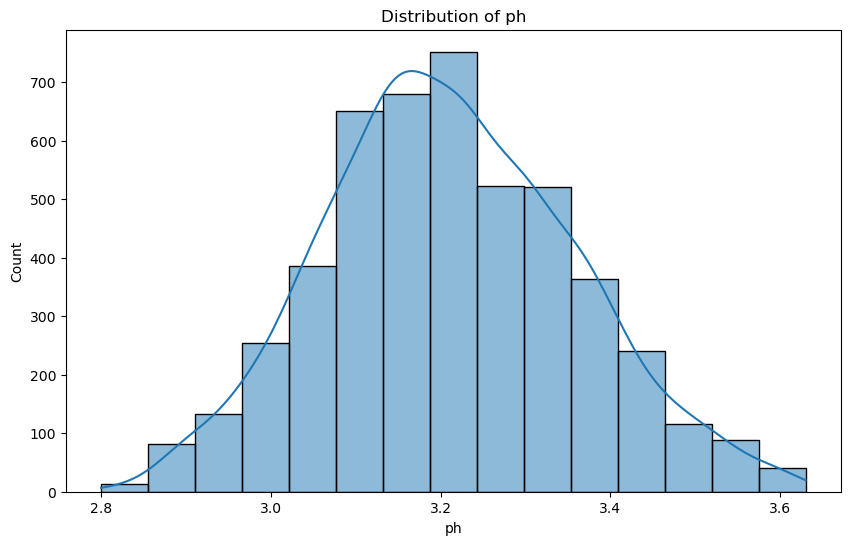

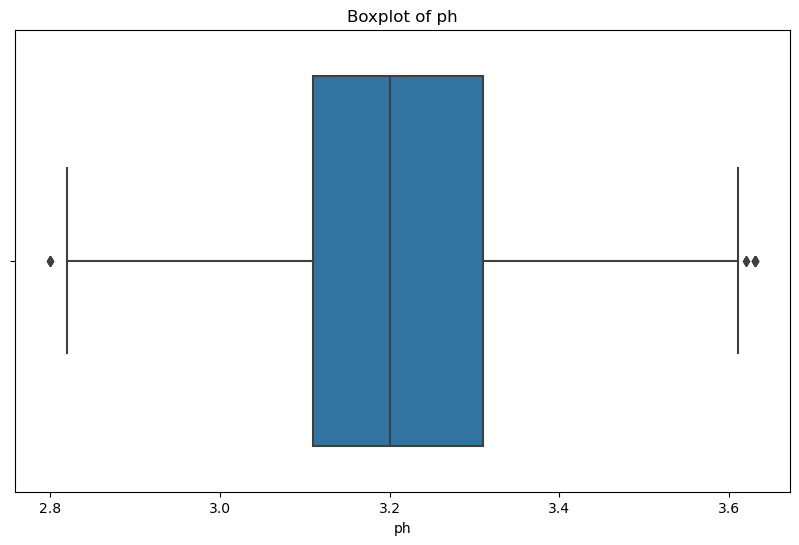

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



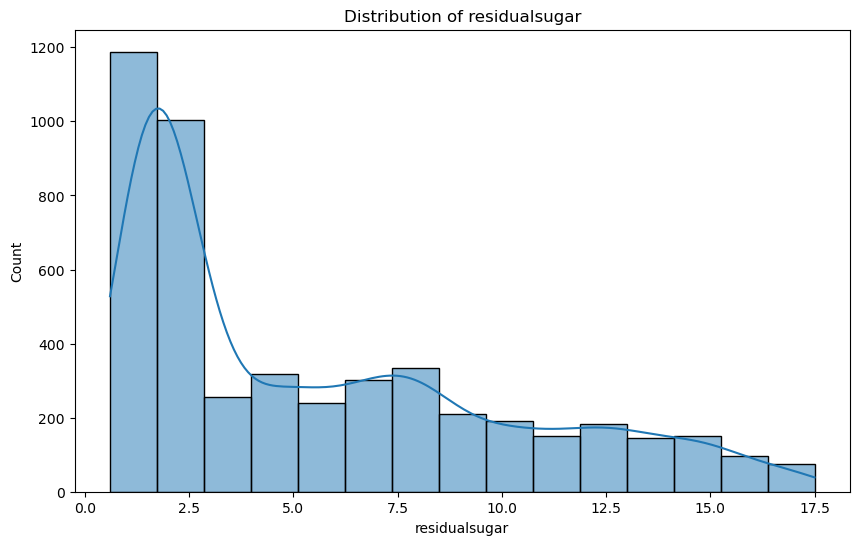

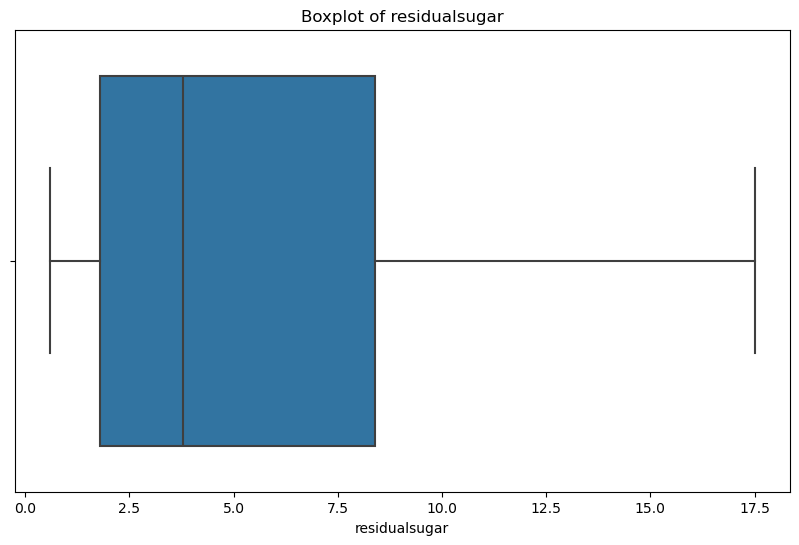

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



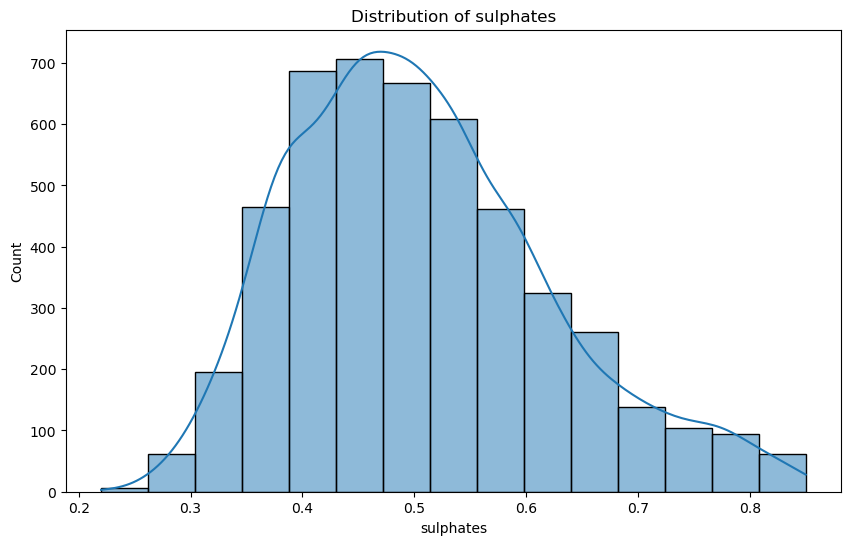

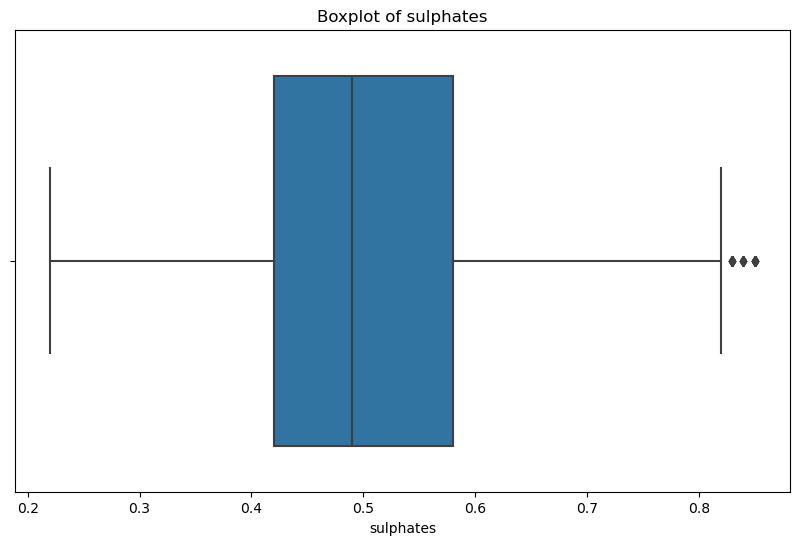

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



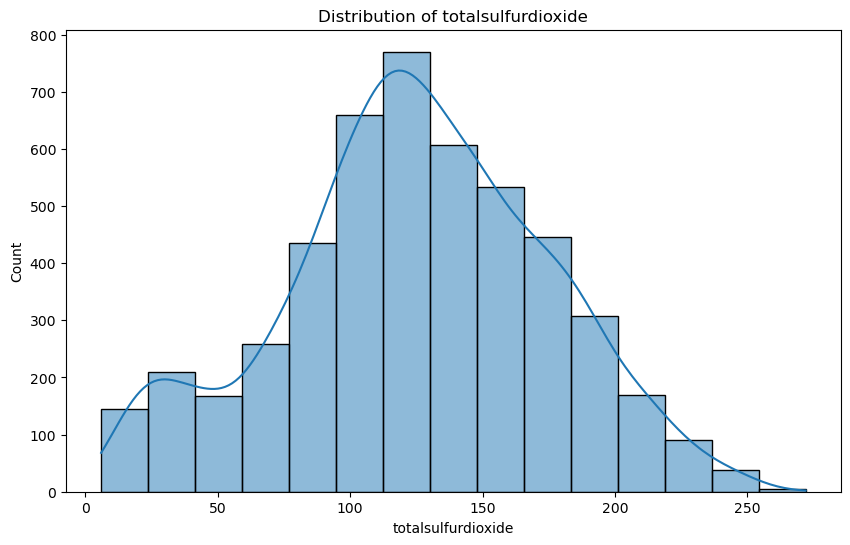

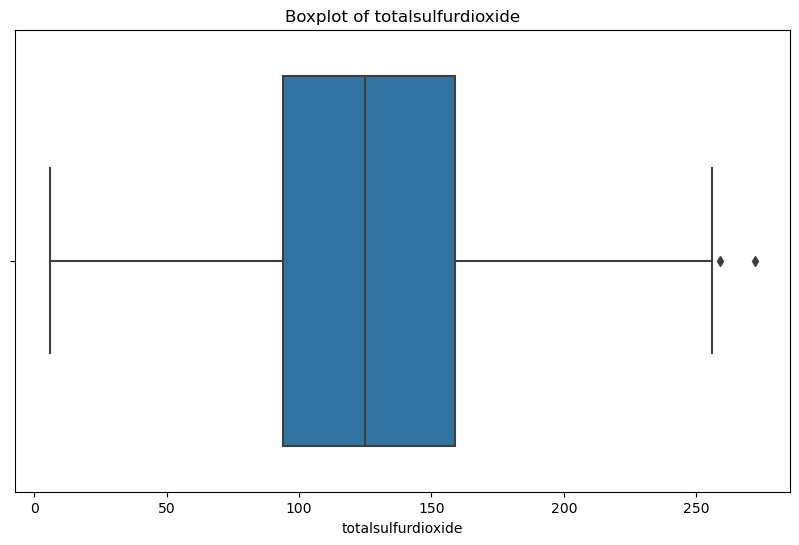

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



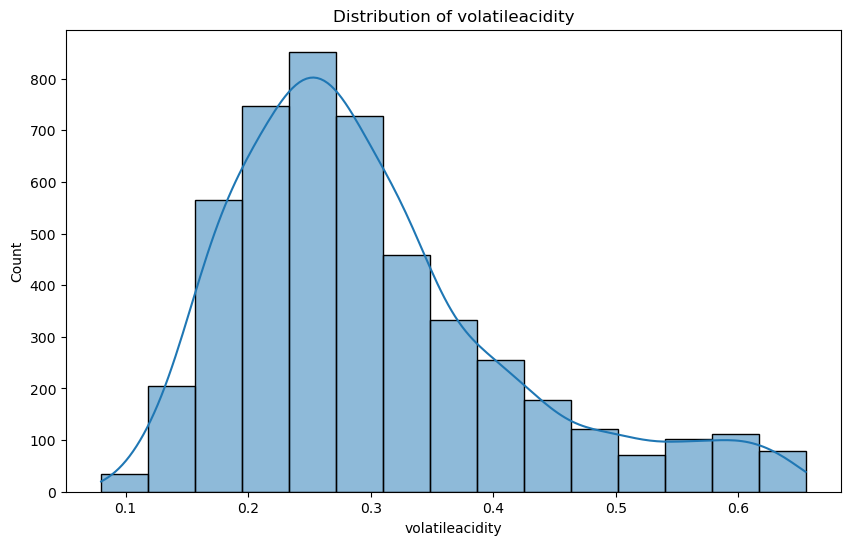

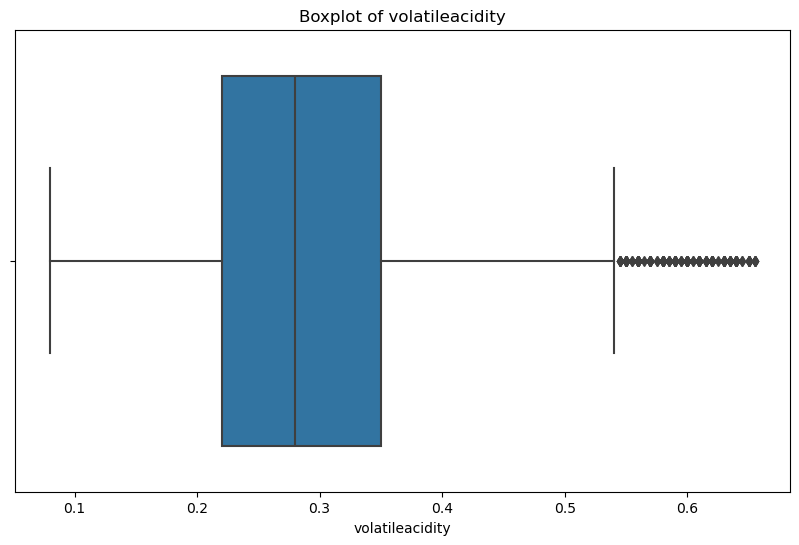

In [781]:
continuous_columns = ['alcohol',
 'chlorides',
 'citricacid',
 'density',
 'fixedacidity',
 'freesulfurdioxide',
 'id',
 'ph',
 'residualsugar',
 'sulphates',
 'totalsulfurdioxide',
 'volatileacidity']  

# Visualization
for col in continuous_columns:
    plt.figure(figsize=(10, 6))
    
    # Histogram
    sns.histplot(data1[col], bins=15, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.show()
    
    # Boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=data1[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='quality', ylabel='Category'>

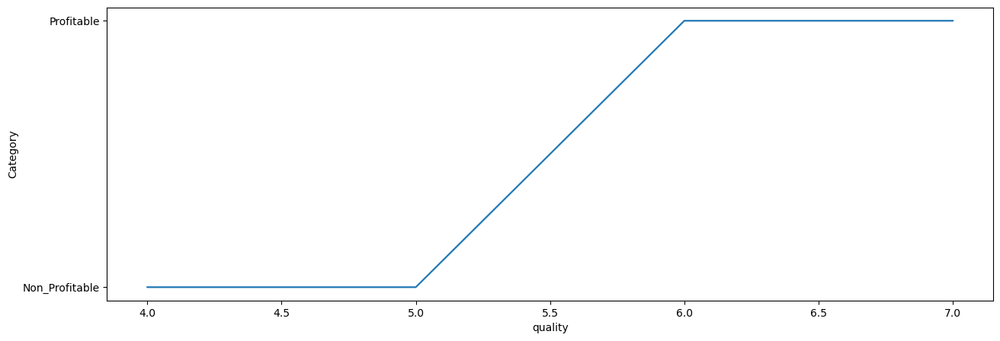

In [782]:
# ploting the line chart 
plt.figure(figsize = [15, 5])
sns.lineplot(data = data1, x = 'quality', y = 'Category')

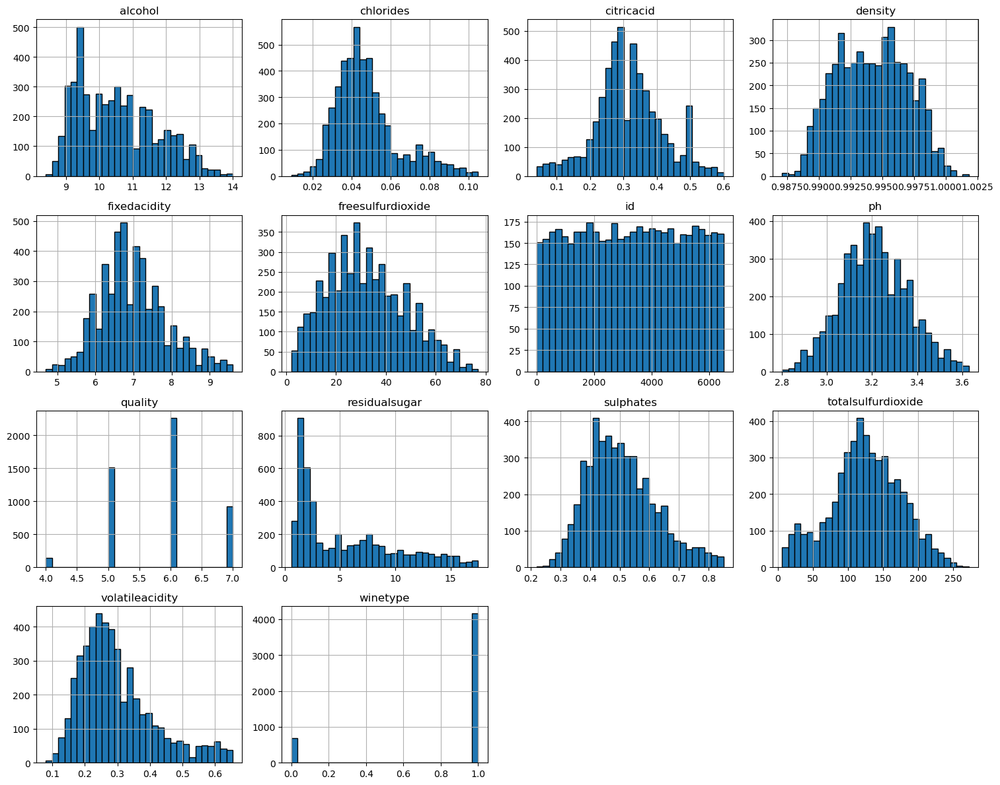

In [783]:
# Histograms for numerical features
data1.hist(figsize=(15, 12), bins=30, edgecolor='black')
plt.tight_layout()
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



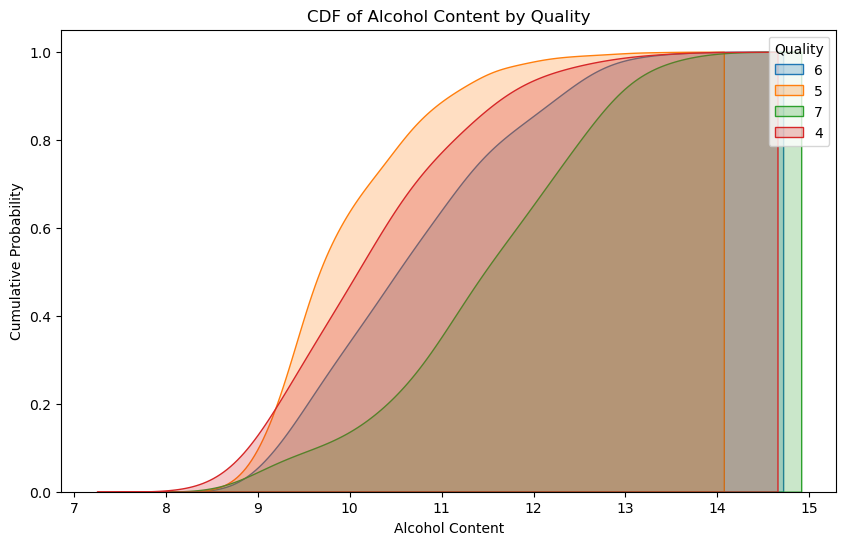

In [787]:
plt.figure(figsize=(10, 6))
for quality in data1['quality'].unique():
    sns.kdeplot(data1[data1['quality'] == quality]['alcohol'], cumulative=True, label=quality, fill=True)
plt.title('CDF of Alcohol Content by Quality')
plt.xlabel('Alcohol Content')
plt.ylabel('Cumulative Probability')
plt.legend(title='Quality')
plt.show()

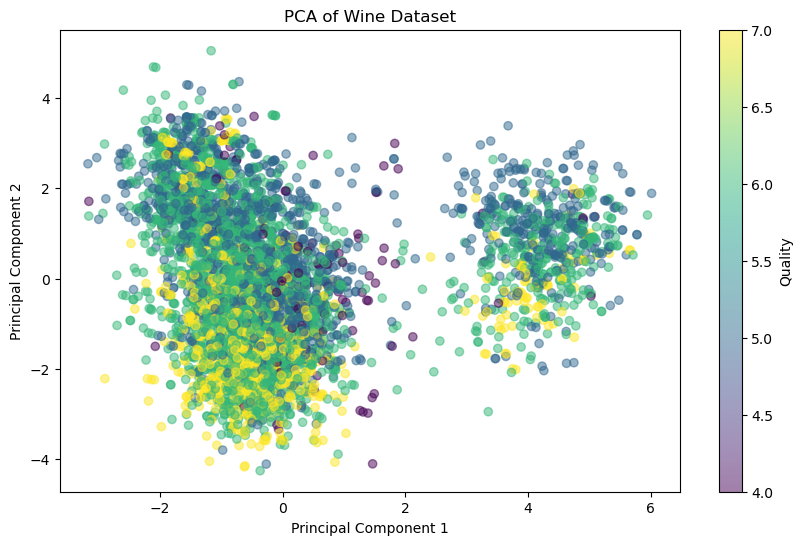

In [793]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize the data before PCA
x = data1.drop(columns=['Category', 'quality'])  # Excluding target variables
x_scaled = StandardScaler().fit_transform(x)

pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(x_pca[:, 0], x_pca[:, 1], c=data1['quality'], alpha=0.5, cmap='viridis')
plt.title('PCA of Wine Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Quality')
plt.show()

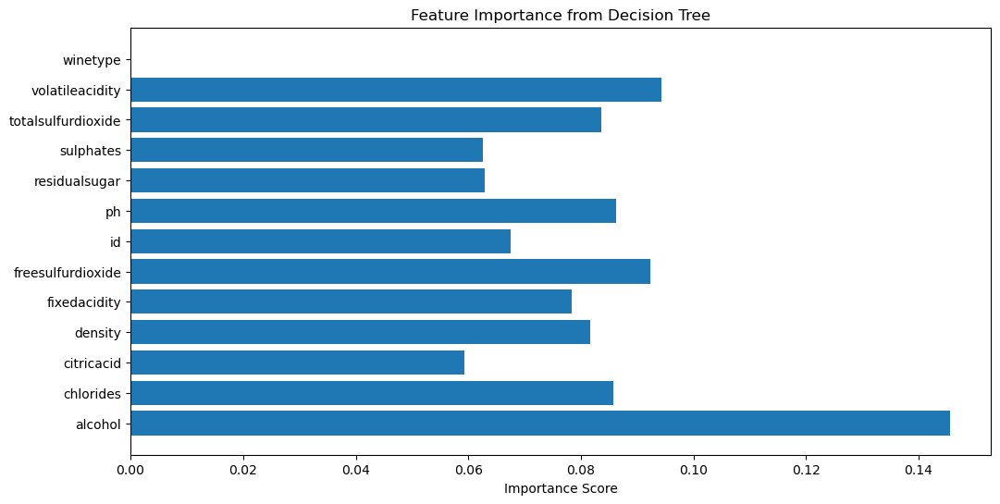

In [795]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Preparing data
x = data1.drop(columns=['Category', 'quality'])
y = data1['quality']

# Train-test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Decision Tree
tree_model = DecisionTreeClassifier()
tree_model.fit(x_train, y_train)

# Plot feature importance
importances = tree_model.feature_importances_

plt.figure(figsize=(12, 6))
plt.barh(x.columns, importances)
plt.title('Feature Importance from Decision Tree')
plt.xlabel('Importance Score')
plt.show()

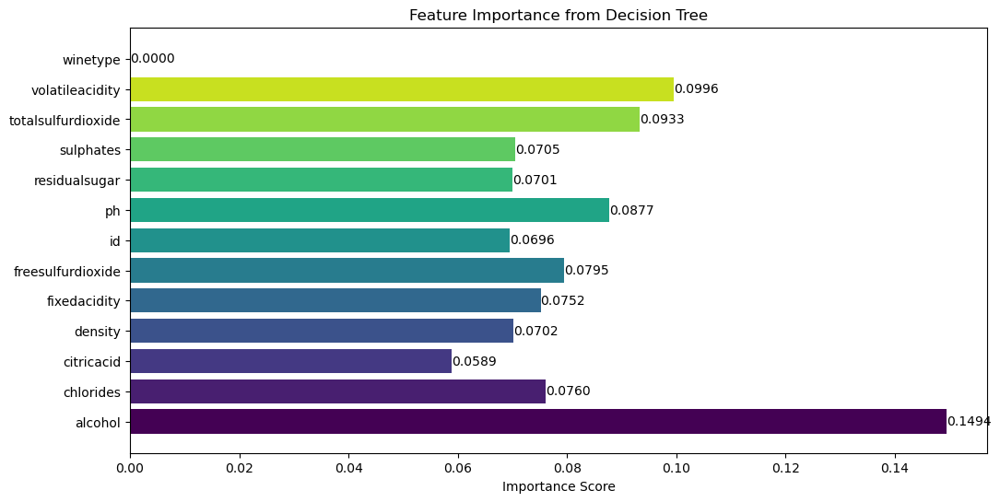

In [797]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

# Preparing data
x = data1.drop(columns=['Category', 'quality'])
y = data1['quality']

# Train-test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Decision Tree
tree_model = DecisionTreeClassifier()
tree_model.fit(x_train, y_train)

# Plot feature importance
importances = tree_model.feature_importances_

# Create a color map
colors = plt.get_cmap("viridis")(np.linspace(0, 1, len(importances)))

plt.figure(figsize=(12, 6))
bars = plt.barh(x.columns, importances, color=colors)
plt.title('Feature Importance from Decision Tree')
plt.xlabel('Importance Score')

# Add value labels on the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
             f"{bar.get_width():.4f}", 
             va='center', 
             ha='left', 
             color='black')

plt.show()

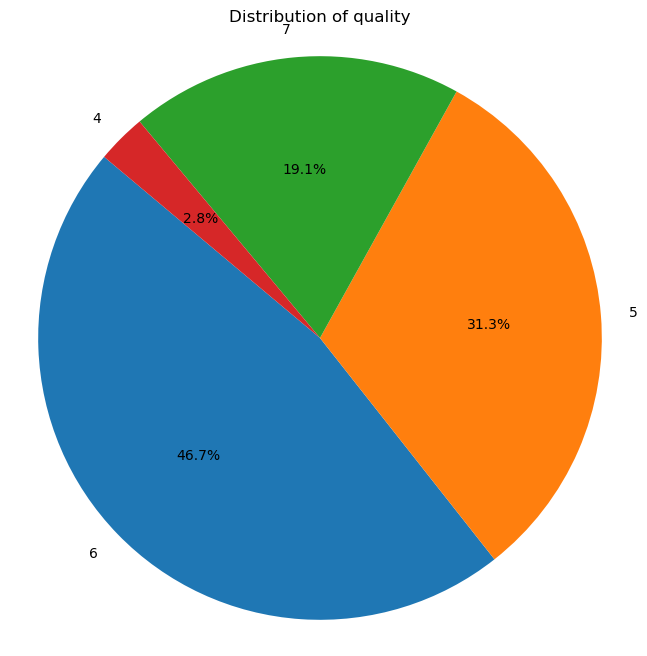

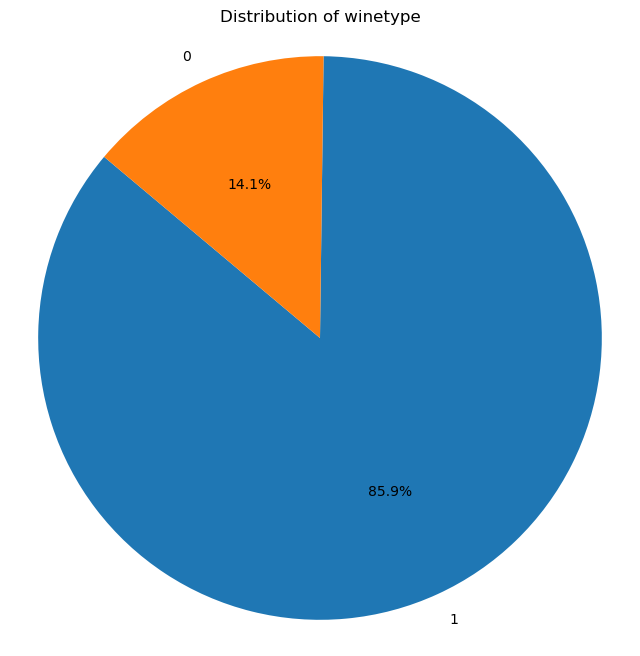

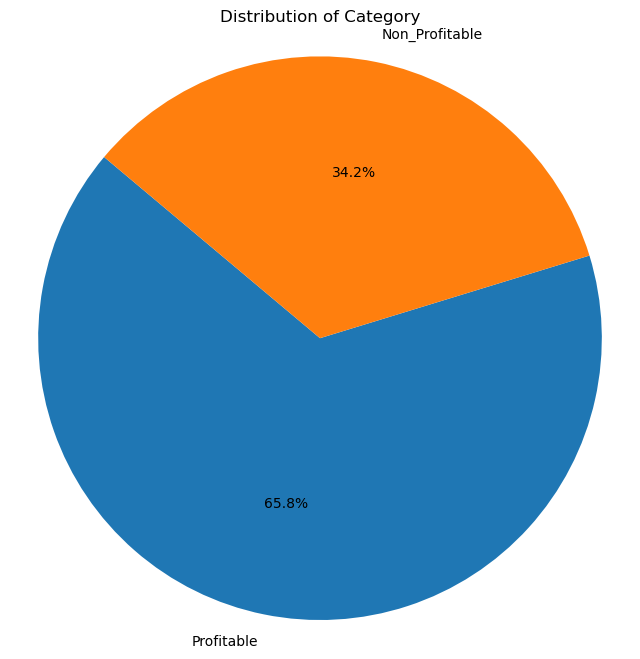

In [677]:
# Loop through each categorical column and create pie charts
for col in categorical_cols:
    counts = data1[col].value_counts()
    
    # Create pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(f'Distribution of {col}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


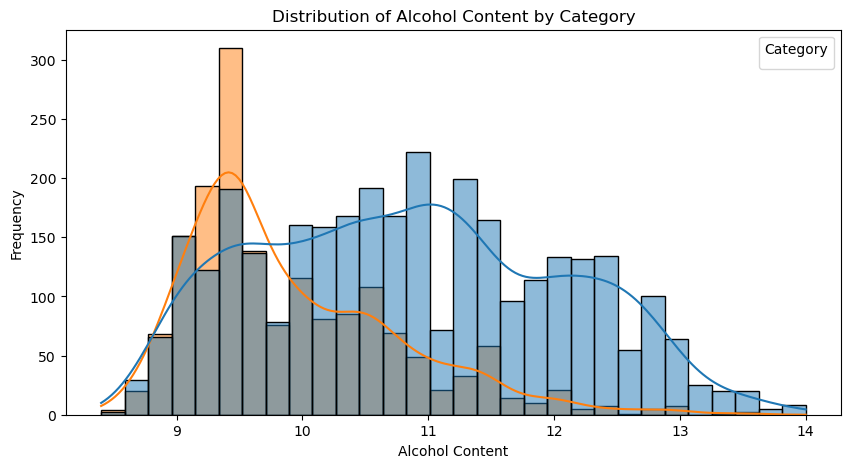

In [679]:
# Distribution of alcohol by category
plt.figure(figsize=(10, 5))
sns.histplot(data=data1, x='alcohol', hue='Category', kde=True, bins=30)
plt.title('Distribution of Alcohol Content by Category')
plt.xlabel('Alcohol Content')
plt.ylabel('Frequency')
plt.legend(title='Category')
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


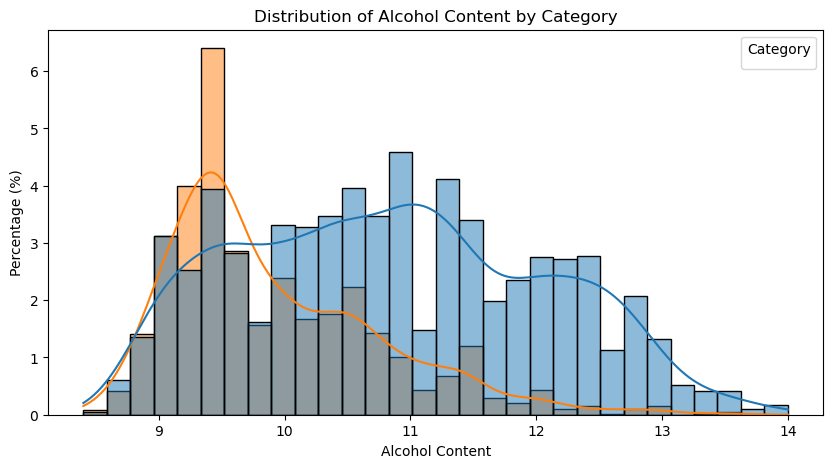

In [689]:
# Distribution of alcohol by category with percentage
plt.figure(figsize=(10, 5))
sns.histplot(data=data1, x='alcohol', hue='Category', kde=True, bins=30, stat='percent')
plt.title('Distribution of Alcohol Content by Category')
plt.xlabel('Alcohol Content')
plt.ylabel('Percentage (%)')
plt.legend(title='Category')
plt.show()

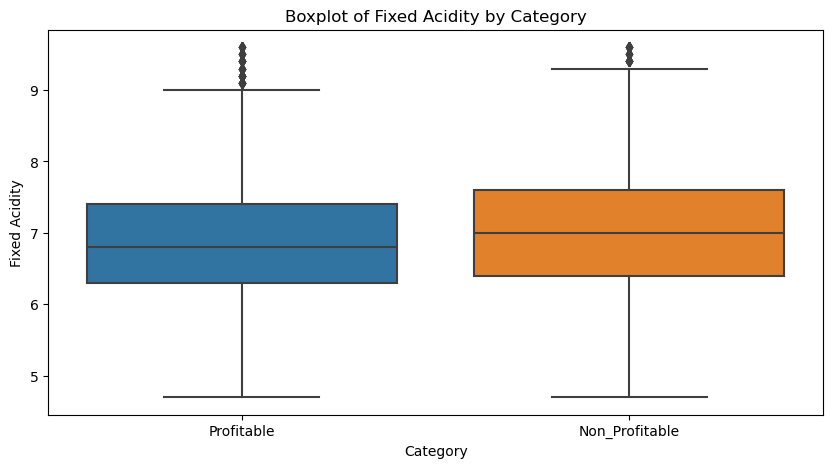

In [681]:
# Boxplot for fixed acidity by category
plt.figure(figsize=(10, 5))
sns.boxplot(x='Category', y='fixedacidity', data=data1)
plt.title('Boxplot of Fixed Acidity by Category')
plt.xlabel('Category')
plt.ylabel('Fixed Acidity')
plt.show()

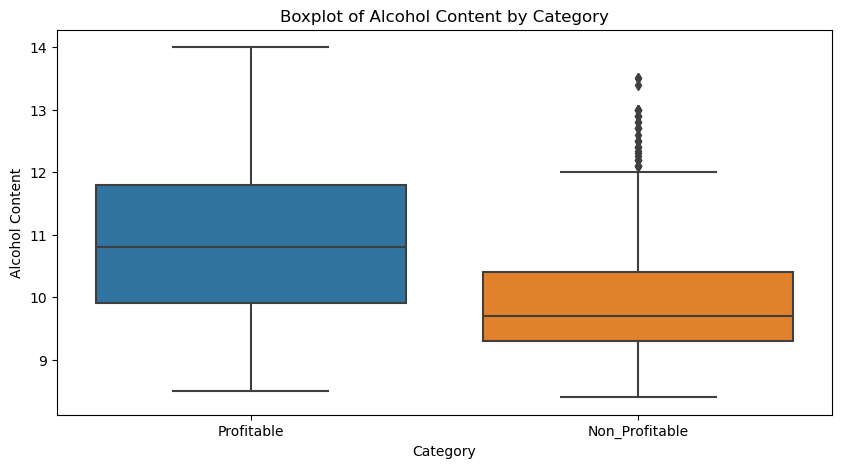

In [699]:
# Boxplot for alcohol content by category
plt.figure(figsize=(10, 5))
sns.boxplot(x='Category', y='alcohol', data=data1)
plt.title('Boxplot of Alcohol Content by Category')
plt.xlabel('Category')
plt.ylabel('Alcohol Content')
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



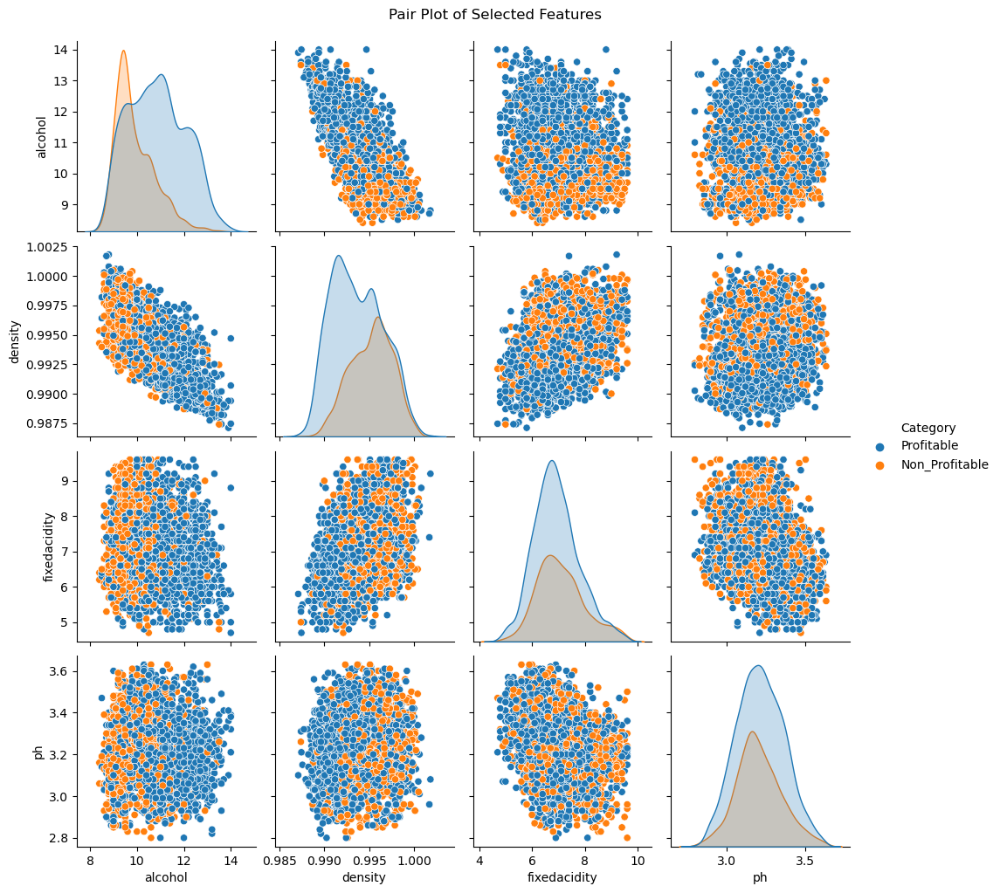

In [683]:
# Pair plot
sns.pairplot(data1, hue='Category', vars=['alcohol', 'density', 'fixedacidity', 'ph'])
plt.suptitle('Pair Plot of Selected Features', y=1.02)
plt.show()


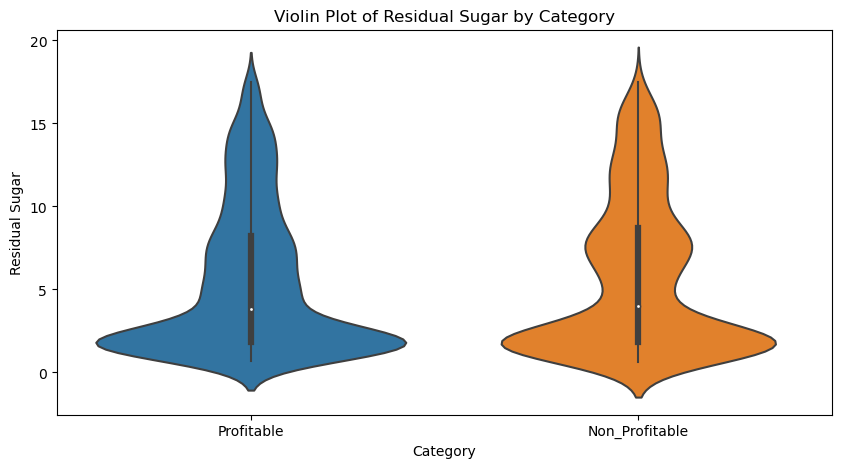

In [685]:
# Violin plot for residual sugar by category
plt.figure(figsize=(10, 5))
sns.violinplot(x='Category', y='residualsugar', data=data1)
plt.title('Violin Plot of Residual Sugar by Category')
plt.xlabel('Category')
plt.ylabel('Residual Sugar')
plt.show()

In [687]:
# Group-wise Analysis
grouped = data1.groupby('Category').mean()
print(grouped[['alcohol', 'fixedacidity', 'residualsugar', 'ph']])

                  alcohol  fixedacidity  residualsugar        ph
Category                                                        
Non_Profitable   9.917985      7.085602       5.737266  3.204719
Profitable      10.849597      6.915955       5.465406  3.212934


<Figure size 1200x600 with 0 Axes>

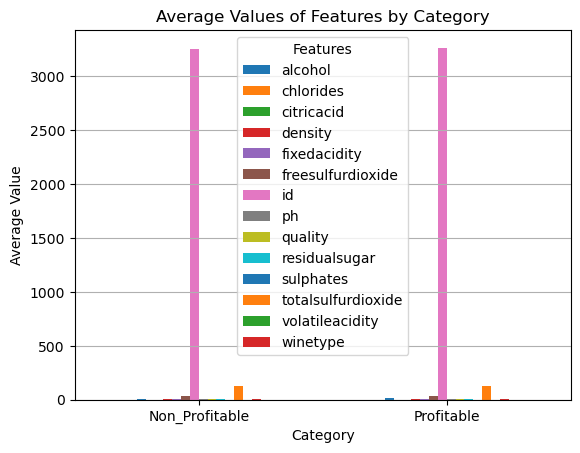

In [691]:
# Reset the index for better plotting
grouped = grouped.reset_index()

# Set up the bar plot
plt.figure(figsize=(12, 6))
grouped.plot(x='Category', kind='bar', stacked=False)
plt.title('Average Values of Features by Category')
plt.xlabel('Category')
plt.ylabel('Average Value')
plt.xticks(rotation=0)
plt.legend(title='Features')
plt.grid(axis='y')
plt.show()

C:\Users\yasmi\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



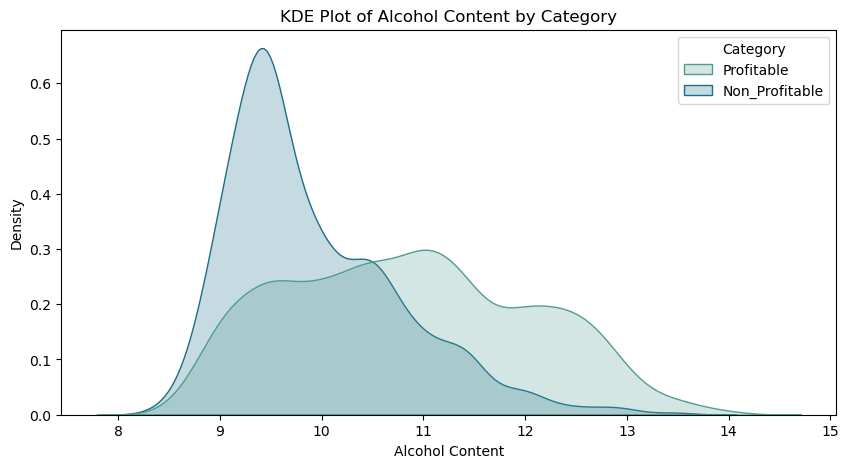

In [701]:
# KDE plot for alcohol content
plt.figure(figsize=(10, 5))
sns.kdeplot(data=data1, x='alcohol', hue='Category', fill=True, common_norm=False, palette="crest")
plt.title('KDE Plot of Alcohol Content by Category')
plt.xlabel('Alcohol Content')
plt.ylabel('Density')
plt.show()

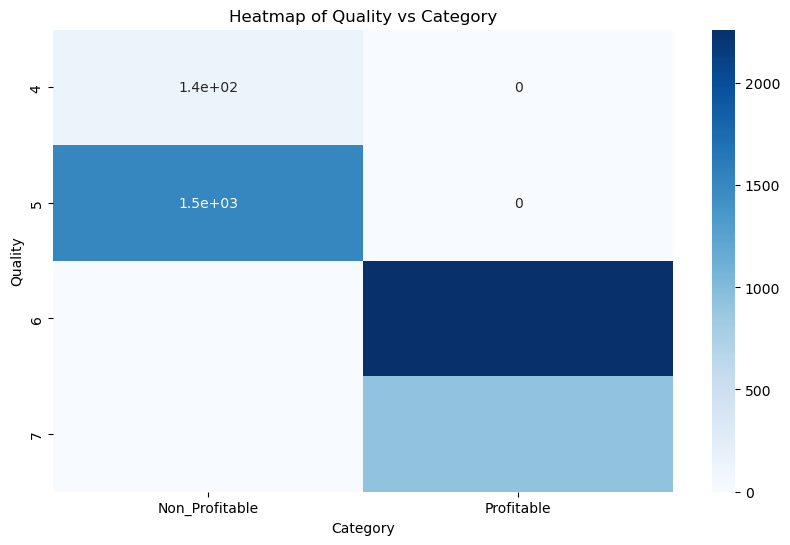

In [703]:
# Crosstab heatmap between quality and category
quality_category_crosstab = pd.crosstab(data1['quality'], data1['Category'])
plt.figure(figsize=(10, 6))
sns.heatmap(quality_category_crosstab, annot=True, cmap='Blues')
plt.title('Heatmap of Quality vs Category')
plt.ylabel('Quality')
plt.xlabel('Category')
plt.show()

In [827]:
# Label Encoding for category
label_encoder = LabelEncoder()

In [829]:
data['Category'] = label_encoder.fit_transform(data['Category'])

In [831]:
data1.dtypes

alcohol               float64
chlorides             float64
citricacid            float64
density               float64
fixedacidity          float64
freesulfurdioxide     float64
id                      int16
ph                    float64
quality                  int8
residualsugar         float64
sulphates             float64
totalsulfurdioxide    float64
volatileacidity       float64
winetype                 int8
Category               object
dtype: object

In [833]:
data1['Category'].unique()

array(['Profitable', 'Non_Profitable'], dtype=object)

In [839]:
# Step 1: Identify numeric columns
numeric_cols = data1.select_dtypes(include=['float64', 'int64']).columns

# Step 2: Convert the numeric columns to integers
data1[numeric_cols] = data1[numeric_cols].apply(pd.to_numeric, downcast='integer', errors='coerce')

In [845]:
# Convert only numeric columns to integers
numeric_cols = data1.select_dtypes(include='number').columns
data1[numeric_cols] = data1[numeric_cols].astype(int)

In [847]:
# Encode non-numeric column (Category) to integers
data1['Category'] = data1['Category'].astype('category').cat.codes

In [849]:
print(data1.dtypes)

alcohol               int32
chlorides             int32
citricacid            int32
density               int32
fixedacidity          int32
freesulfurdioxide     int32
id                    int32
ph                    int32
quality               int32
residualsugar         int32
sulphates             int32
totalsulfurdioxide    int32
volatileacidity       int32
winetype              int32
Category               int8
dtype: object


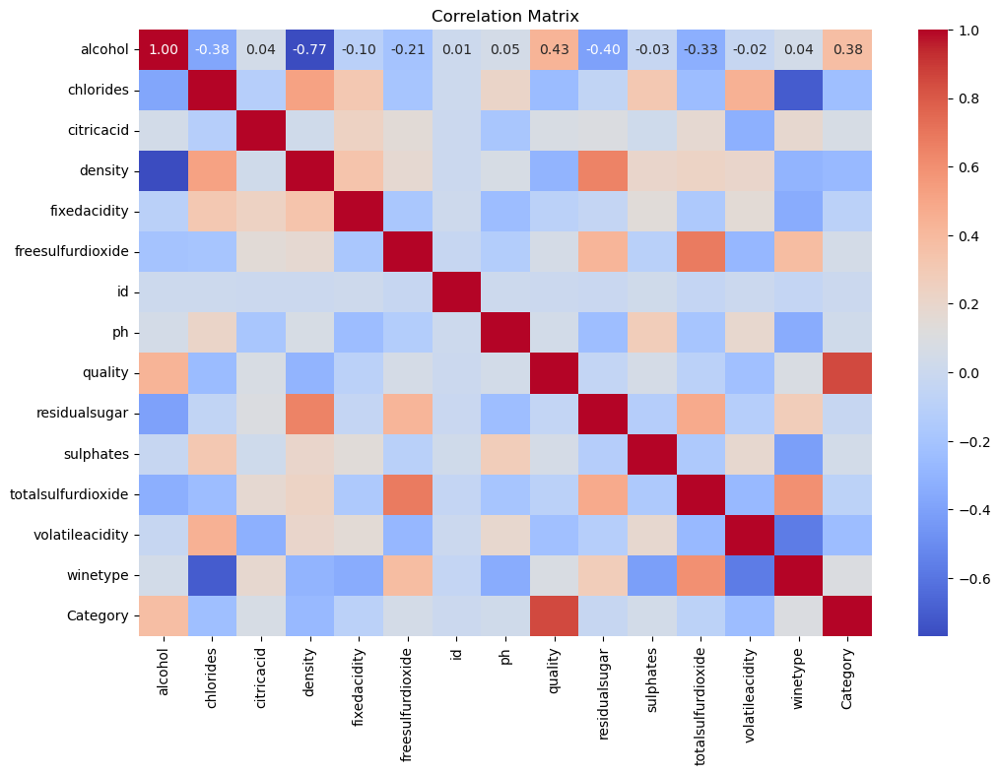

In [851]:
# Correlation Matrix
plt.figure(figsize=(12, 8))
correlation = data.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [855]:
data1

,alcohol,chlorides,citricacid,density,fixedacidity,freesulfurdioxide,id,ph,quality,residualsugar,sulphates,totalsulfurdioxide,volatileacidity,winetype,Category
0,12,0,0,0,6,24,458,3,6,1,0,98,0,1,1
1,9,0,0,0,6,14,4374,3,6,5,0,146,0,1,1
2,9,0,0,0,6,55,4927,3,5,10,0,193,0,1,0
3,9,0,0,0,7,50,2195,3,6,1,0,153,0,1,1
4,12,0,0,0,7,7,5198,3,6,4,0,112,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4835,8,0,0,0,6,37,1484,3,6,17,0,130,0,1,1
4836,9,0,0,0,7,34,3505,3,5,1,0,60,0,0,0
4837,10,0,0,0,7,21,3688,3,6,6,0,138,0,1,1
4838,11,0,0,0,6,49,2355,3,6,6,0,172,0,1,1


In [857]:
x = data.drop('Category', axis=1)  # Features
y = data['Category']  # Target variable

In [859]:
sc = StandardScaler()
x = sc.fit_transform(x)

In [861]:
# Train - Test split ( 80 - 20 %)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

In [863]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((3872, 14), (968, 14), (3872,), (968,))

In [865]:
from sklearn.ensemble import RandomForestClassifier  # Use RandomForestRegressor for regression tasks
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [867]:
# Assuming X_train and y_train are already defined
clf = RandomForestClassifier(random_state=42)  # Instantiate the model
clf.fit(x_train, y_train)  # Fit the model

RandomForestClassifier(random_state=42)

In [869]:
# Extract feature importances
importances = clf.feature_importances_
feature_names = data.drop('Category', axis=1).columns  # Corresponding feature names

In [871]:
# Display feature importances
for feature, importance in zip(feature_names, importances):
    print(f"{feature}: {importance:.4f}")

alcohol: 0.0610
chlorides: 0.0202
citricacid: 0.0153
density: 0.0265
fixedacidity: 0.0097
freesulfurdioxide: 0.0148
id: 0.0063
ph: 0.0100
quality: 0.7699
residualsugar: 0.0114
sulphates: 0.0112
totalsulfurdioxide: 0.0138
volatileacidity: 0.0285
winetype: 0.0015


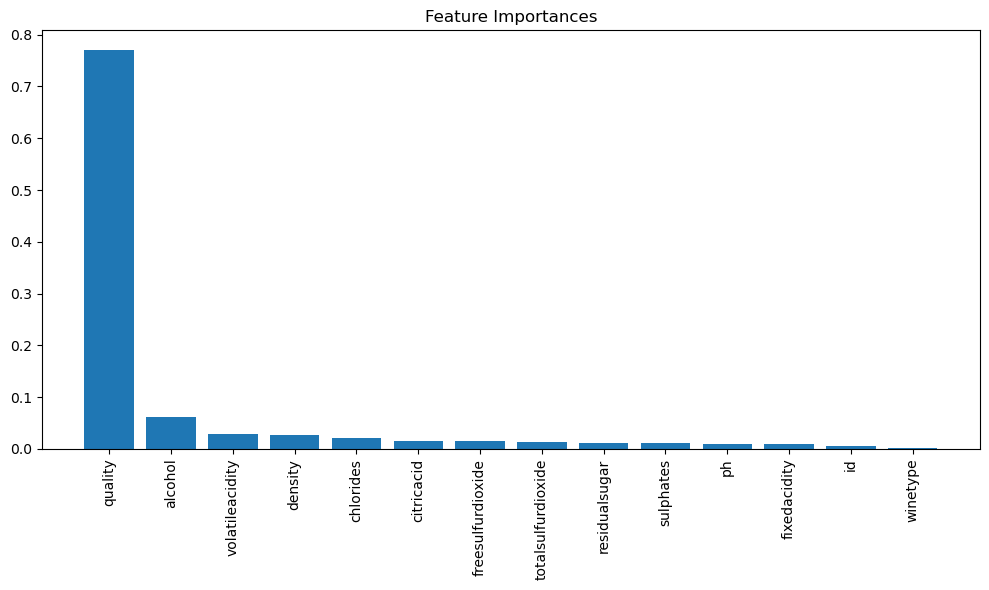

In [873]:
import matplotlib.pyplot as plt
import numpy as np

# Sorting features by importance
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(x_train.shape[1]), importances[indices], align="center")
plt.xticks(range(x_train.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.tight_layout()

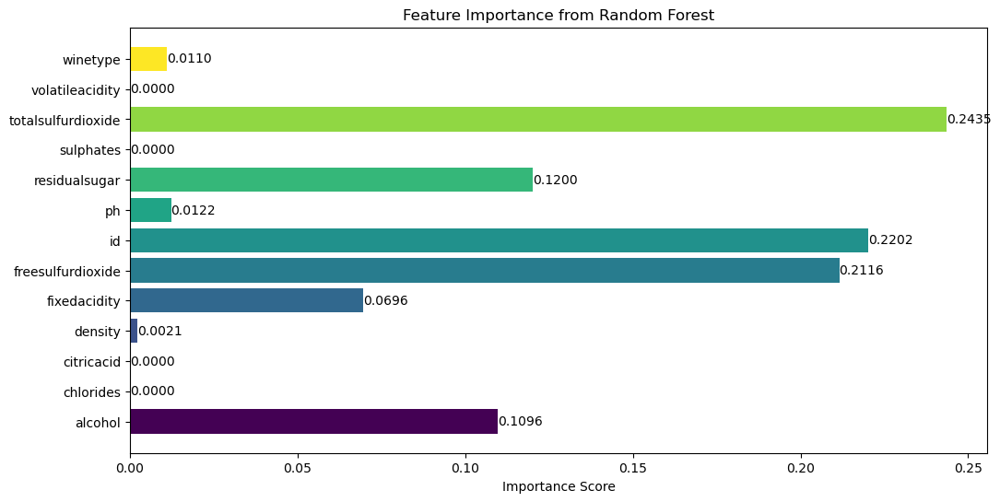

In [853]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

# Preparing data
x = data1.drop(columns=['Category', 'quality'])
y = data1['quality']

# Train-test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(x_train, y_train)

# Get feature importances
importances = rf_model.feature_importances_

# Create a color map
colors = plt.get_cmap("viridis")(np.linspace(0, 1, len(importances)))

plt.figure(figsize=(12, 6))
bars = plt.barh(x.columns, importances, color=colors)
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance Score')

# Add value labels on the bars
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, 
             f"{bar.get_width():.4f}", 
             va='center', 
             ha='left', 
             color='black')

plt.show()